In [1]:
from importlib import reload
import numpy as np
import os
import random
import pickle
import multiprocessing
import functools
import seaborn
import logging
import typhon
import cmocean
from pylab import cm
from os.path import join
from netCDF4 import Dataset
from tqdm import tqdm_notebook
from scipy.interpolate import interp1d
from scipy.signal import detrend
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import processing_tools as ptools
import analysis_tools as atools
from importlib import reload
from moisture_space import utils, plots
from moisture_space import moisture_space
from typhon.plots import set_yaxis_formatter, ScalingFormatter
mpl_logger = logging.getLogger('matplotlib') 
mpl_logger.setLevel(logging.WARNING) 

# Config

In [13]:
models = ['ICON', 'NICAM', 'ARPEGE', 'SAM', 'FV3', 'UM', 'IFS', 'GEOS', 'MPAS', 'ERA5']
runs = {
    'ICON': ['2.5km'],
    'NICAM': ['3.5km'],
    'SAM': ['4.0km'],
    'UM': ['5.0km'],
    'FV3': ['3.25km'],
    'GEOS': ['3.0km'],
    'IFS': ['4.0km'],
    'MPAS': ['3.75km'],
    'ARPEGE': ['2.5km'],
    'ERA5': ['31.0km']
}
exps = []
for m in models:
    for run in runs[m]:
        exps.append(m+'-'+run)
        
time_period = ['0810', '0908']
variables_3D = ['TEMP', 'PRES', 'QV', 'QI', 'QC', 'RH', 'ICQI', 'CFI', 'ICQC', 'CFL', 'W']
variables_2D = ['IWV']
datapath = '/mnt/lustre02/work/mh1126/m300773/DYAMOND/{}/random_samples/'
filenames = '{}-{}_{}_sample_{}_{}-{}.nc'
num_profiles = int(1 * 1e7)
perc_values = np.arange(1, 100.5, 1.0)
num_percs = len(perc_values)
iwv_bin_bnds = np.arange(0, 101, 1)
bins = range(len(iwv_bin_bnds) - 1) 
exp = 0
h = np.arange(100, 17900, 400) # height vector to interpolate all models on
height = {}
num_levels = {}
for m in models:
    for run in runs[m]:
        key = m+'-'+run
        filename = filenames.format(m, run, variables_3D[0], num_profiles, time_period[0], time_period[1])
        if run == '2.5km_winter':
            filename = filenames.format(m, run, variables_3D[0], num_profiles, '0120', '0202')
        if m == 'ERA5':
            filename = f'/mnt/lustre02/work/mh1126/m300773/DYAMOND/ERA5/2016/random_samples/{filename}'
        else:
            filename = join(datapath.format(m), filename)
        #xarr = xr.open_dataset(filename)
        with(Dataset(filename)) as ds:
            height[key] = ds.variables['height'][:].filled(np.nan)
        num_levels[key] = len(height[key])
        
# NICAM excluded for variablilty analysis!
variability_exclude = ['']
models_variability = [m for m in exps if not m in variability_exclude]

# Cloudsat data
cloudsat_path = '/mnt/lustre02/work/mh1126/m300773/CloudSat/2016/cloudsat_iwc_profile.csv'

# ERA5 mean profiles for several years
era5_path = '/mnt/lustre02/work/mh1126/m300773/DYAMOND/ERA5/ERA5_tropical_mean_profiles_2014-2018.pkl'

# Read randomly sampled profiles from files and interpolate to common height

In [14]:
reload(moisture_space)
ms_perc = {}
ms_bins = {}
percentiles = {}
for m in models:
    print(m)
    for run in runs[m]:
        exp = m+'-'+run
        if m == 'ERA5':
            p = f'{m}/2016'
        else:
            p = m
        path_perc = f'{m}-{run}_{time_period[0]}-{time_period[1]}_perc_means_{num_profiles}_1exp.pkl'
        path_bin = f'{m}-{run}_{time_period[0]}-{time_period[1]}_bin_means_{num_profiles}_1exp.pkl'
        if run == '2.5km_winter':
            path_perc = f'{m}-{run}_0120-0202_perc_means_{num_profiles}_1exp.pkl'
            path_bin = f'{m}-{run}_0120-0202_bin_means_{num_profiles}_1exp.pkl'
        with open(join(datapath.format(p), path_perc), 'rb' ) as infile:
            perc = pickle.load(infile)
        with open(join(datapath.format(p), path_bin), 'rb' ) as infile:
            binned = pickle.load(infile)
        percentiles[exp] = perc['percentiles']
        if 'OLR' in variables_2D and 'STOA' in variables_2D:
            if m == 'ICON':
                perc['mean']['OLR'] *= -1 
                binned['mean']['OLR'] *= -1
            if np.mean(perc['mean']['STOA']) < 0:
                perc['mean']['STOA'] *= -1
                binned['mean']['STOA'] *= -1
        ms_perc[exp] = {}
        ms_bins[exp] = {}
        for var in variables_3D:
            stats_perc = moisture_space.ProfileStats.from_dict(perc, var)
            ms_perc[exp][var] = moisture_space.PercMoistureSpace(exp, stats_perc, perc_values, height[exp]).interpolate(h)
            stats_bin = moisture_space.ProfileStats.from_dict(binned, var)
            ms_bins[exp][var] = moisture_space.BinMoistureSpace(exp, stats_bin, perc_values, height[exp], binned['count']).interpolate(h)
            ms_bins[exp][var].remove_empty_bins(number_threshold=300)
        for var in variables_2D:
            stats_perc = moisture_space.ProfileStats.from_dict(perc, var)
            ms_perc[exp][var] = moisture_space.PercMoistureSpace(exp, stats_perc, perc_values, None)   
            stats_bin = moisture_space.ProfileStats.from_dict(binned, var)
            ms_bins[exp][var] = moisture_space.BinMoistureSpace(exp, stats_bin, perc_values, None, binned['count'])
            ms_bins[exp][var].remove_empty_bins(number_threshold=300)

ICON
NICAM
ARPEGE
SAM
FV3
UM
IFS
GEOS
MPAS
ERA5


# Read cloudsat tropical mean CIC profile

In [15]:
cloudsat_data = np.genfromtxt(cloudsat_path, delimiter=',')
cloudsat_height = cloudsat_data[:, 1]
cloudsat_cic = cloudsat_data[:, 0]

# Read ERA5 mean profiles for several years:

In [16]:
with open(era5_path, 'rb') as infile:
    era5_mean_profiles = pickle.load(infile)

for year in np.arange(2014, 2019):
    era5_density = utils.calc_density_moist_air(
        era5_mean_profiles[year]['PRES'],
        era5_mean_profiles[year]['TEMP'],
        era5_mean_profiles[year]['QV']
    )
    era5_mean_profiles[year]['QI_vol'] = era5_mean_profiles[year]['QI'] / era5_density
    


# Calculate lapse rate and total cloud condensate

In [17]:
reload(utils)
Rd = typhon.constants.gas_constant_dry_air
cp = typhon.constants.isobaric_mass_heat_capacity
g = typhon.constants.g
for exp in exps:
    lapse_rate = -np.gradient(ms_perc[exp]['TEMP'].mean, axis=1) / np.gradient(h)
    stability = Rd / cp * ms_perc[exp]['TEMP'].mean / ms_perc[exp]['PRES'].mean * (1 - lapse_rate * cp / g)
    cc_tot = ms_perc[exp]['QI'].mean + ms_perc[exp]['QC'].mean
    e = typhon.physics.specific_humidity2vmr(ms_perc[exp]['QV'].mean) * ms_perc[exp]['PRES'].mean
    es = typhon.physics.e_eq_mixed_mk(ms_perc[exp]['TEMP'].mean)
    td = utils.calc_dewpoint(e)
    density = utils.calc_density_moist_air(
        ms_perc[exp]['PRES'].mean,
        ms_perc[exp]['TEMP'].mean,
        ms_perc[exp]['QV'].mean
    )
    w_int = utils.calc_integrated_velocity(
        ms_perc[exp]['W'].mean,
        h,
        100,
        12500,
        ms_perc[exp]['TEMP'].mean,
        ms_perc[exp]['PRES'].mean,
        ms_perc[exp]['QV'].mean
    )
    theta_e = utils.calc_equivalent_pot_temp(
        ms_perc[exp]['TEMP'].mean,
        ms_perc[exp]['PRES'].mean,
        ms_perc[exp]['QV'].mean
    )
    theta_es = utils.calc_sat_equivalent_pot_temp(
        ms_perc[exp]['TEMP'].mean,
        ms_perc[exp]['PRES'].mean
    )
    q_sat = utils.rel_hum2spec_hum(
        np.ones(ms_perc[exp]['TEMP'].mean.shape), 
        ms_perc[exp]['TEMP'].mean, 
        ms_perc[exp]['PRES'].mean, 
        phase='mixed')
    qi_vol = ms_perc[exp]['QI'].mean * density
    
    stats_perc = moisture_space.ProfileStats(variable='LR', mean=lapse_rate)
    ms_perc[exp]['LR'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)
    stats_perc = moisture_space.ProfileStats(variable='THETA_E', mean=theta_e)
    ms_perc[exp]['THETA_E'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)
    stats_perc = moisture_space.ProfileStats(variable='THETA_ES', mean=theta_es)
    ms_perc[exp]['THETA_ES'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)
    stats_perc = moisture_space.ProfileStats(variable='S', mean=stability)
    ms_perc[exp]['S'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)
    stats_perc = moisture_space.ProfileStats(variable='QTOT', mean=cc_tot)
    ms_perc[exp]['QTOT'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)
    stats_perc = moisture_space.ProfileStats(variable='E', mean=e)
    ms_perc[exp]['E'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)
    stats_perc = moisture_space.ProfileStats(variable='QS', mean=q_sat)
    ms_perc[exp]['QS'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)
    stats_perc = moisture_space.ProfileStats(variable='TEMP_D', mean=td)
    ms_perc[exp]['TEMP_D'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)
    stats_perc = moisture_space.ProfileStats(variable='Es', mean=es)
    ms_perc[exp]['Es'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)
    stats_perc = moisture_space.ProfileStats(variable='logQV', mean=np.log(ms_perc[exp]['QV'].mean))
    ms_perc[exp]['logQV'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)
    stats_perc = moisture_space.ProfileStats(variable='Wint', mean=w_int)
    ms_perc[exp]['Wint'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)
    stats_perc = moisture_space.ProfileStats(variable='DENS', mean=density)
    ms_perc[exp]['DENS'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)
    stats_perc = moisture_space.ProfileStats(variable='QI_vol', mean=qi_vol)
    ms_perc[exp]['QI_vol'] = moisture_space.PercMoistureSpace(exp, stats_perc, ms_perc[exp]['TEMP'].bins, h)

In [18]:
density_profiles = {}
for exp in exps:
    density_profiles[exp] = ms_perc[exp]['DENS'].mean_profile()
density_profiles['height'] = h
with open('/mnt/lustre02/work/mh1126/m300773/DYAMOND/Intermediate_data/density_profiles.pkl', 'wb') as outfile:
    pickle.dump(density_profiles, outfile)

# Create collections of moisture spaces for each variable

In [19]:
reload(moisture_space)
ms_perc_series = {}
ms_bins_series = {}
for var in variables_3D+['QTOT', 'E', 'Es', 'logQV', 'LR', 'S', 'TEMP_D', 'QS', 'QI_vol']:
    perc_space_list = [ms_perc[exp][var] for exp in models_variability]
    ms_perc_series[var] = moisture_space.MoistureSpaceSeries(perc_space_list)
for var in variables_3D:
    bin_space_list = [ms_bins[exp][var] for exp in models_variability]
    ms_bins_series[var] = moisture_space.MoistureSpaceSeries(bin_space_list, remove_nans=True)

# Mean profiles

In [38]:
pmean = np.mean(ms_perc_series['PRES'].mean, axis=0)
pticklabels = np.arange(100000, 9000, -10000).astype(int)
pticks = interp1d(pmean, h)(pticklabels)

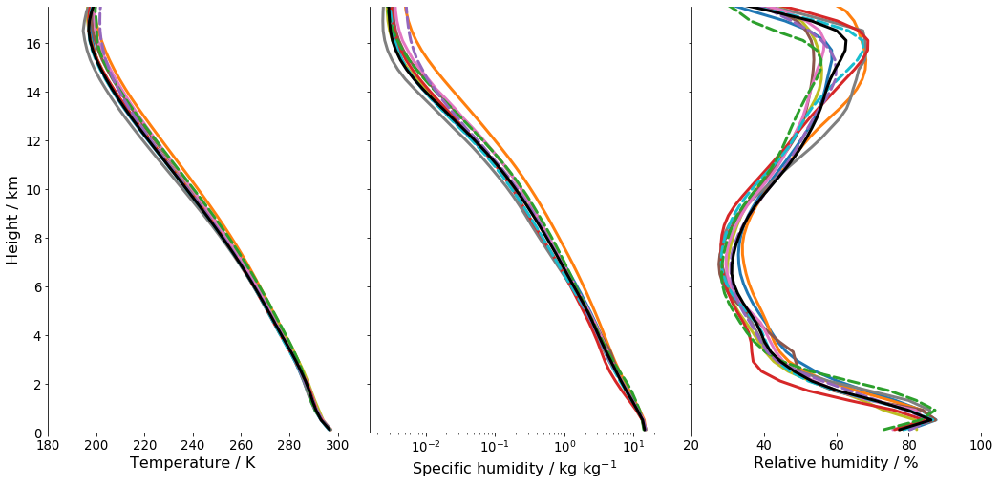

In [39]:
reload(plots)
plt.style.use(typhon.plots.styles.get('typhon')) 
plt.rcParams.update({'font.size': 19})
plot_vars = ['TEMP', 'QV', 'RH']
num_vars = len(plot_vars)
bin_start= 0
bin_end = 101
plt.rcParams.update({'font.size': 16})
fig, ax = plt.subplots(1, num_vars, figsize=(5 * num_vars, 7), sharey=True)
for i, var in enumerate(plot_vars):
    for exp in exps:
        if var == 'QV':
            ax[i].semilogx(ms_perc[exp][var].mean_profile(bin_start, bin_end) * plots.scaling_factors(ms_perc[exp][var].variable),
                           h * 1e-3, lw=3, label=exp, color=plots.DYAMOND_colors(exp), linestyle=plots.DYAMOND_ls(exp))
        else:
            ax[i].plot(ms_perc[exp][var].mean_profile(bin_start, bin_end) * plots.scaling_factors(ms_perc[exp][var].variable),\
                       h * 1e-3, lw=3, label=exp, color=plots.DYAMOND_colors(exp), linestyle=plots.DYAMOND_ls(exp))
            
    if bin_start == 0 and bin_end == 100:   
        if var == 'QI_vol':
            ax[i].plot(cloudsat_cic * 1e3, cloudsat_height * 1e-3, '--', color='k', label='2C-ICE')

        #for year in np.arange(2014, 2019):
        #    ax[i].plot(era5_mean_profiles[year][var] * plots.scaling_factors(var), era5_mean_profiles['height'] * 1e-3, lw=2.5, color='lightgrey', zorder=0)
        
        ax[i].set_xlabel(plots.axis_labels(ms_perc[exp][var].variable))
        
        ax[i].set_ylim(0, 17.5)
        seaborn.despine(ax=ax[i])
ax[0].set_ylabel('Height / km')
#ax[1].legend(fontsize=18, facecolor='w', framealpha=1.)
#ax[1].set_xlim(0, 0.2)
ax[0].set_xlim(180, 300)
ax[2].set_xlim(20, 100)
#ax[3].set_xlim(0, 20)
#ax[4].set_xlim(0, 50)
plt.tight_layout()
ax[0].set_ylim(0, 17.5)
ax[0].set_xlabel('Temperature / K')
ax[1].set_xlabel('Specific humidity / kg kg$^{-1}$')
ax[2].set_xlabel('Relative humidity / %')
plt.savefig('plots_seminar/tropical_mean_profiles.pdf', dpi=400)

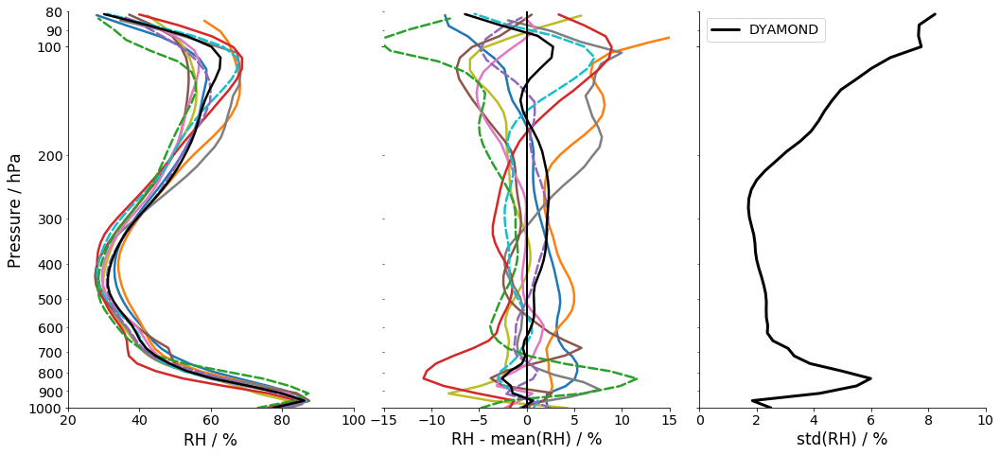

In [66]:
reload(plots)
amip_file = '/mnt/lustre02/work/um0878/users/tlang/work/cmip5/CMIP5_AMIP_RH_stats.pkl'
with open(amip_file, 'rb') as infile:
    rh_amip = pickle.load(infile)

plt.rcParams.update({'font.size': 15})

num_vars = len(plot_vars)
bin_start= 0
bin_end = 100
plt.rcParams.update({'font.size': 17})
fig, ax = plt.subplots(1, 3, figsize=(15, 7), sharey=True)
mean_rh_profiles = []
for exp in exps:
    typhon.plots.profile_p_log(ms_perc[exp]['PRES'].mean_profile(bin_start, bin_end), ms_perc[exp]['RH'].mean_profile(bin_start, bin_end) * 1e2,\
               lw=2.5, label=exp, color=plots.DYAMOND_colors(exp), linestyle=plots.DYAMOND_ls(exp), ax=ax[0])
    if exp != 'ERA5-31.0km':
        mean_rh_profiles.append(ms_perc[exp]['RH'].mean_profile(bin_start, bin_end))
        
    typhon.plots.profile_p_log(ms_perc[exp]['PRES'].mean_profile(bin_start, bin_end), (ms_perc[exp]['RH'].mean_profile(bin_start, bin_end) - np.mean(ms_perc_series['RH'].mean[bin_start:bin_end], axis=0)) * 1e2,
                              lw=2.5, label=exp, color=plots.DYAMOND_colors(exp), linestyle=plots.DYAMOND_ls(exp), ax=ax[1])
typhon.plots.profile_p_log(ms_perc[exp]['PRES'].mean_profile(bin_start, bin_end), np.std(mean_rh_profiles, axis=0) * 1e2, color='k', lw=3, label='DYAMOND', ax=ax[2])
#typhon.plots.profile_p_log(rh_amip['PRES'], rh_amip['std'], color='k', lw=3, ls='--', label='CMIP5 AMIP')
#ax.plot(cloudsat_cic * 1e3, cloudsat_height * 1e-3, '--', color='k', lw=2.5, label='2C-ICE')

rh_era5 = []
pres_era5 = []
for year in np.arange(2014, 2019):
    rh_era5.append(era5_mean_profiles[year]['RH'])
    pres_era5.append(era5_mean_profiles[year]['PRES'])

#typhon.plots.profile_p_log(np.mean(pres_era5, axis=0), np.std(rh_era5, axis=0) * 1e2, color='k', lw=3, ls=':', label='ERA5 2014-2018')
set_yaxis_formatter(ScalingFormatter(scaling='hecto', fmtstr='{x:g}'))        
ax[0].set_xlabel('RH / %')
ax[2].set_xlabel('std(RH) / %')
        
ax[0].set_ylim(100000, 8000)
#seaborn.despine(right=False, top=False)
#ax.set_ylabel('Height / m')
ax[0].set_ylabel('Pressure / hPa')

ax[0].set_xlim(20, 100)
ax[2].set_xlim(0, 10)
#ax2 = ax.twinx()
#ax2.set_ylim(0, 17.5)
#ax2.set_yticks(pticks * 1e-3)
#ax2.set_yticklabels(pticklabels // 100)
#ax2.set_ylabel('Pressure / hPa')
ax[1].set_xlim(-15, 15)
ax[1].plot([0, 0], [100000, 8000], color='k')
seaborn.despine(ax=ax[1], left=True)
ax[1].set_xlabel('RH - mean(RH) / %')

#ax.legend(fontsize=10)
ax[2].legend()
plt.tight_layout()
plt.savefig('plots_seminar/tropical_mean_RH.pdf', dpi=400)
#plt.savefig('DYAMOND_2C-ICE.pdf')

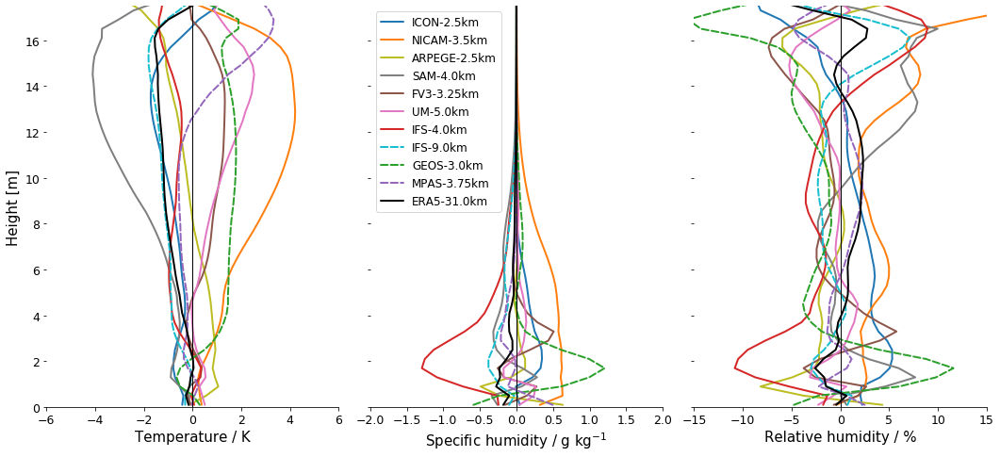

In [41]:
plt.rcParams.update({'font.size': 15})
reload(plots)
plot_vars = ['TEMP', 'QV', 'RH']
num_vars = len(plot_vars)
bin_start= 0
bin_end = 101
plt.rcParams.update({'font.size': 15})
fig, ax = plt.subplots(1, num_vars, figsize=(5 * num_vars, 7), sharey=True)
for i, var in enumerate(plot_vars):
    for exp in exps:
        if exp in exps:
            ax[i].plot((ms_perc[exp][var].mean_profile(bin_start, bin_end) - np.mean(np.mean(ms_perc_series[var].space_array[:, bin_start:bin_end], axis=0), axis=0)) * plots.scaling_factors(ms_perc[exp][var].variable),\
                        h * 1e-3, lw=2, label=exp, color=plots.DYAMOND_colors(exp), linestyle=plots.DYAMOND_ls(exp))
            ax[i].set_xlabel(plots.axis_labels(ms_perc[exp][var].variable))
            ax[i].plot([0, 0], [0, 17.5], color='k', lw=1)
        ax[i].set_ylim(0, 17.5)
        seaborn.despine(left=True)
ax[0].set_ylabel('Height [m]')
ax[1].set_xlim(-2, 2)
ax[0].set_xlim(-6, 6)
ax[2].set_xlim(-15, 15)
#ax[3].set_xlim(-10, 10)
#ax[4].set_xlim(-25, 25)
ax[1].legend(fontsize=12)
plt.tight_layout()

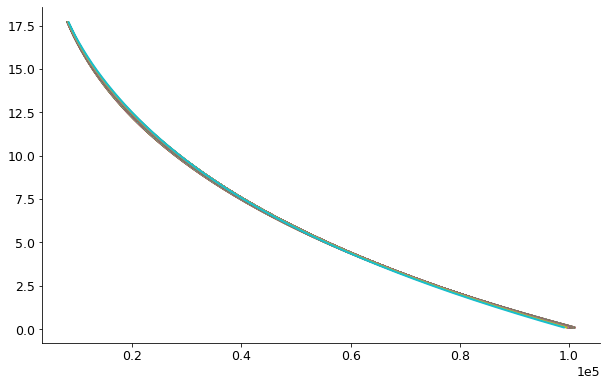

In [42]:
fig, ax = plt.subplots()
exp = 'ICON-2.5km'
for i in range(num_percs):
    ax.plot(ms_perc[exp]['PRES'].mean[i], h * 1e-3)

# 2D Variables in moisture space

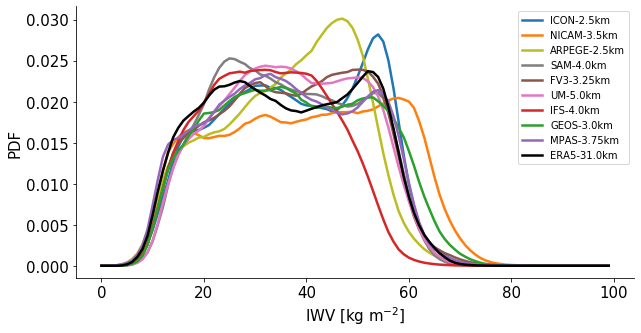

In [22]:
plt.rcParams.update({'font.size': 15})
fig, ax = plt.subplots(figsize=(10, 5))
for m in exps:
    ax.plot(ms_bins[m]['RH'].profile_pdf / num_profiles, lw=2.5, label=m, color=plots.DYAMOND_colors(m))
ax.legend(fontsize=10)
ax.set_xlabel('IWV [kg m$^{-2}$]')
ax.set_ylabel('PDF')
seaborn.despine()
plt.savefig('plots_seminar/IWV_distribution.pdf', dpi=400)

In [10]:
num_profiles

10000000

KeyError: 'OLR'

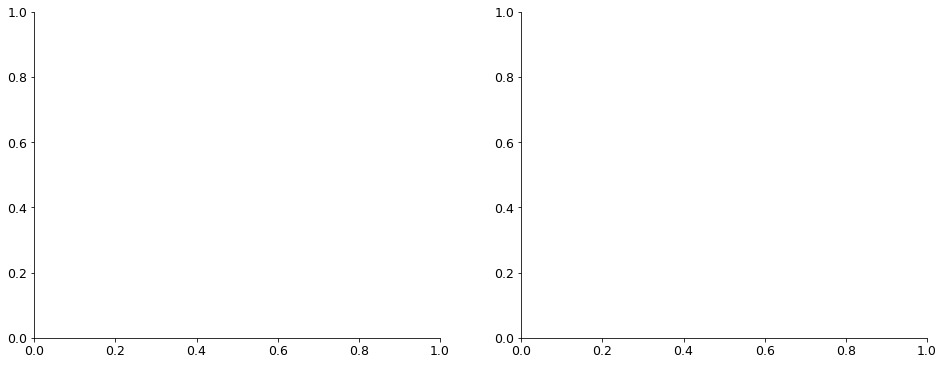

In [44]:
plot_vars = ['OLR', 'STOA']
num_vars = len(plot_vars)
x_lims = [0, 100]
y_lims = [150, 300]
fig, ax = plt.subplots(1, num_vars, figsize=(8 * num_vars, 6))
for i, var in enumerate(plot_vars):
    for exp in exps:
        plots.moisture_space_line(ax[i], perc_values, ms_perc[exp][var].mean,\
                                  x_lims, y_lims, 'Percentile of IWV', plots.axis_labels(ms_perc[exp][var].variable), color=plots.DYAMOND_colors(exp), lw=2, label=exp)
        seaborn.despine()
plt.tight_layout()
ax[1].legend()

In [ ]:
fig, ax = plt.subplots()
for exp in exps:
    ax.plot(np.mean(ms_perc[exp]['STOA'].mean - ms_perc[exp]['OLR'].mean), '.', markersize=20)

Relationship between UTH and OLR

Text(0, 0.5, 'OLR [W m$^{-2}$]')

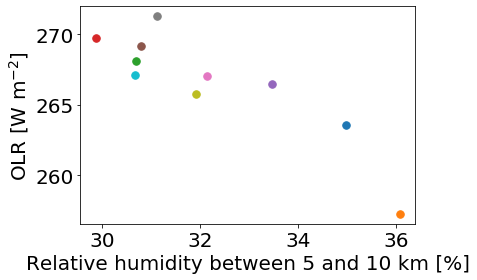

In [250]:
fig, ax = plt.subplots()
for m in exps:
    ax.plot(ms_perc[m]['RH'].area_mean(bin_start=0, bin_end=100, lower_bnd=5000, upper_bnd=10000) * 1e2,
            np.mean(ms_perc[m]['OLR'].mean[0:100]), '.', markersize=15, color=plots.DYAMOND_colors(exp))
#ax.set_ylim(270, 300)
#ax.set_xlim(0, 40)
ax.set_xlabel('Relative humidity between 5 and 10 km [%]')
ax.set_ylabel(r'OLR [W m$^{-2}$]')

ICON-2.5km
15913.904255974448
NICAM-3.5km
nan
GEOS-3.0km
nan
IFS-4.0km
16187.163453675363
IFS-9.0km
15976.575234939808
MPAS-3.75km
nan
FV3-3.25km
16412.965142058747
UM-5.0km
16393.754651439773
SAM-4.0km
16064.986132978875
ARPEGE-2.5km
16474.469267873712


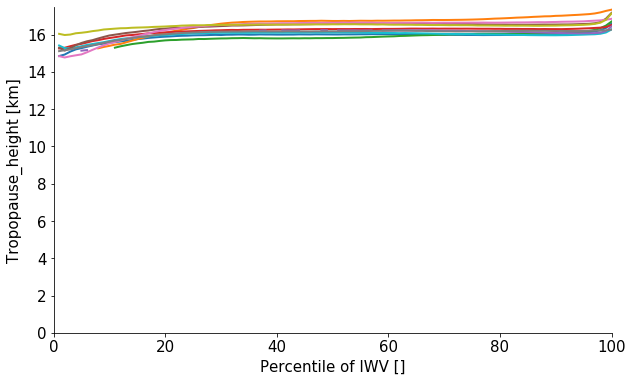

In [123]:
plot_vars = ['H_tropo']
num_vars = len(plot_vars)
x_lims = [0, 100]
y_lims = [0, 17.5]
fig, ax = plt.subplots(figsize=(10, 6))
for i, var in enumerate(plot_vars):
    for exp in models_variability:
        plots.moisture_space_line(ax, perc_values, ms_perc[exp][var].mean * plots.scaling_factors(ms_perc[exp][var].variable),\
                                  x_lims, y_lims, 'Percentile of IWV []', plots.axis_labels(ms_perc[exp][var].variable), lw=2, label=m, color=plots.DYAMOND_colors(exp))
        print(exp)
        print(np.mean(ms_perc[exp][var].mean))
        seaborn.despine()

9913.904255974448
10493.615454602968
9779.534775187543
10187.163453675363
9976.575234939808
10031.625748531613
10412.965142058747
10393.754651439773
10064.986132978875
10474.687657668343
9953.910444509553


KeyError: 'OLR'

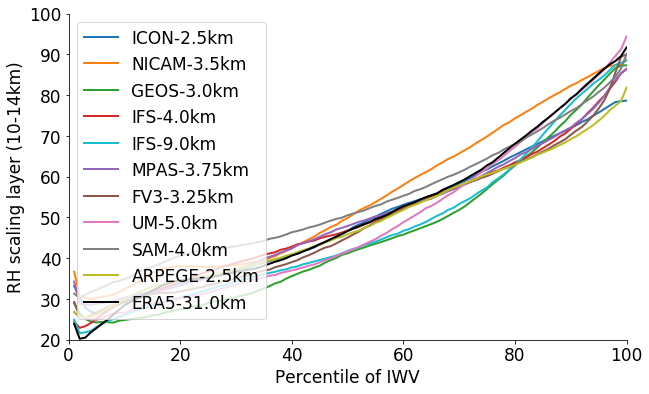

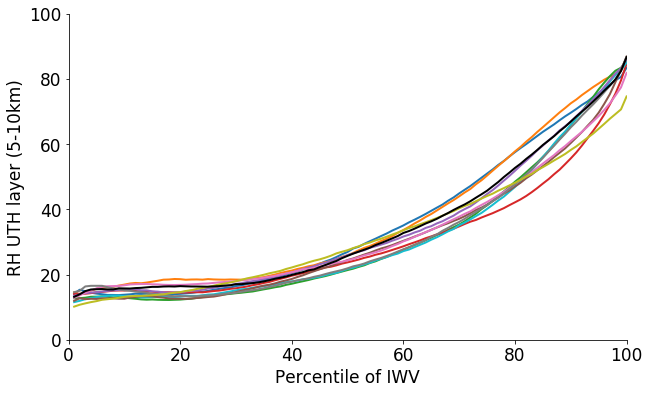

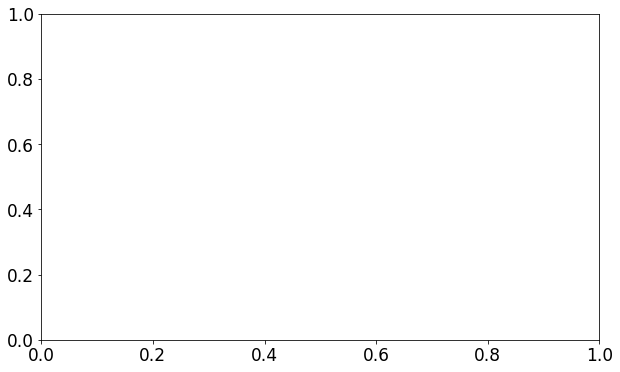

In [319]:
x_lims = [0, 100]
y_lims = [20, 100]
#level_start = 10000
#level_end = 14000
fig, ax = plt.subplots(figsize=(10, 6))
for exp in exps:
    level_start = np.mean(ms_perc[exp]['H_tropo'].mean) - 6000
    print(level_start)
    level_end = level_start + 4000
    plots.moisture_space_line(ax, perc_values, ms_perc[exp]['RH'].vertical_mean(level_start, level_end) * 1e2,\
                              x_lims, y_lims, 'Percentile of IWV', 'RH scaling layer (10-14km)', lw=2, label=exp, color=plots.DYAMOND_colors(exp))
    seaborn.despine()
ax.legend()

fig, ax = plt.subplots(figsize=(10, 6))
x_lims = [0, 100]
y_lims = [0, 100]
level_start = 5000
level_end = 10000
for exp in exps:
    plots.moisture_space_line(ax, perc_values, ms_perc[exp]['RH'].vertical_mean(level_start, level_end) * 1e2,\
                              x_lims, y_lims, 'Percentile of IWV', 'RH UTH layer (5-10km)', lw=2, label=exp, color=plots.DYAMOND_colors(exp))
    seaborn.despine()


fig, ax = plt.subplots(figsize=(10, 6))
x_lims = [0, 100]
y_lims = [150, 300]
level_start = 5000
level_end = 10000
for exp in exps:
    plots.moisture_space_line(ax, perc_values, ms_perc[exp]['OLR'].mean,\
                              x_lims, y_lims, 'Percentile of IWV', 'OLR / W m-2', lw=2, label=exp, color=plots.DYAMOND_colors(exp))
    seaborn.despine()
    


# Moisture space overview 1


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

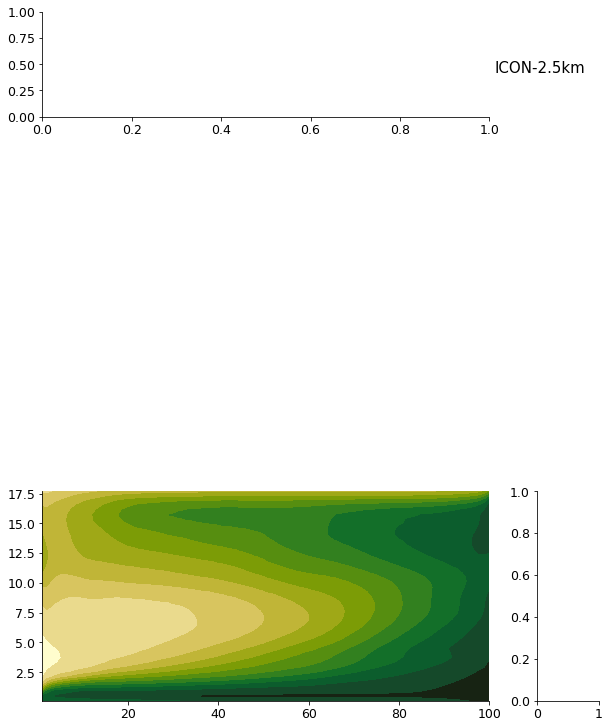

In [45]:
reload(plots)
plt.rcParams.update({'font.size': 15})
tick_labels = np.arange(10, 81, 10)
for m in exps:
    fig = plt.figure(figsize=(1.4 * 6, 10), constrained_layout=True)
    gs = gridspec.GridSpec(ncols=5, nrows=3, figure=fig)
    ax1 = fig.add_subplot(gs[0, :-1])
    ax2 = fig.add_subplot(gs[1:, :-1])
    ax3 = fig.add_subplot(gs[1:, 4])
    plt.annotate(m, xy=(0.81, 0.9), xycoords='figure fraction', fontsize=15)
    
    x_lims = [0, 100]
    y_lims = [150, 310]
#    plots.moisture_space_line(ax1, perc_values, ms_perc[m]['OLR'].mean,\
#                              x_lims, y_lims, 'IWV [kg m$^{-2}$]', 'OLR [W m$^{-2}$]', color='C3', lw=2)

    x_lims = [0, 100]
    y_lims = [0, 20]
    x_label = 'IWV [kg m$^{-2}$]'
    y_label = 'Height [km]'
    plots.moisture_space_contourf(fig, ax2, perc_values, h * 1e-3, ms_perc[m]['RH'].mean.T * 1e2, 10,\
                                  x_lims, y_lims, x_label, y_label, 'Relative humidity [%]',\
                                  percentiles[m], tick_labels,\
                                  cmap='speed', vmin=0, vmax=100)
    
    contours_ci = np.arange(1, 200, 10)
    contours_cl = np.arange(1, 120, 8)
#    ci = plots.moisture_space_contour(fig, ax2, perc_values, h * 1e-3, ms_perc[m]['QI'].mean.T * 1e6, contours_ci,\
#                                  x_lims, y_lims, x_label, y_label, 'w')
#    cl = plots.moisture_space_contour(fig, ax2, perc_values, h * 1e-3, ms_perc[m]['QC'].mean.T * 1e6, contours_cl,\
#                                   x_lims, y_lims, x_label, y_label, 'lightblue')
    
#    ax2.clabel(ci, fontsize=7, fmt='%.1f')
#    ax2.clabel(cl, fontsize=7, fmt='%.1f')
    
    x_lims = [0, 100]
    y_lims = [0, 20]

    plots.moisture_space_line(ax3, ms_perc[m]['RH'].mean_profile() * 1e2, h * 1e-3,\
                              x_lims, y_lims, 'RH [%]', '', color='C2', lw=2)
    ax3.set_xlabel('RH [%]', color='C2', fontsize=13)
    ax3.tick_params(axis='x', colors='C2')
    ax3.set_yticks([])
    ax4 = ax3.twiny()
    x_lims = [0, 30]
    plots.moisture_space_line(ax4, ms_perc[m]['QI'].mean_profile() * 1e6, h * 1e-3,\
                              x_lims, y_lims, 'CIC [mg kg$^{-1}$]', '', color='C0', lw=2)    
    ax4.xaxis.set_ticks_position("bottom")
    ax4.xaxis.set_label_position("bottom")
    ax4.spines["bottom"].set_position(("axes", -0.25))
    ax4.tick_params(axis='x', colors='C0')
    ax4.set_xlabel('CIC [mg kg$^{-1}$]', color='C0', fontsize=13)
    ax4.set_yticks([])
    
#    ax5 = ax3.twiny()
#    x_lims = [0, 30]
#    plots.moisture_space_line(ax4, mean_qc * 1e6, height[m] * 1e-3,\
#                              x_lims, y_lims, 'CIC/CWC [mg kg$^{-1}$]', '', color='lightblue', lw=2)    
#    ax5.set_yticks([])
#    ax5.set_xticks([])

# Moisture space overview 2

0.4771183338912082
0.4771183338912082
0.4771183338912082
0.4771183338912082
0.4771183338912082
0.4771183338912082
0.4771183338912082
0.4771183338912082
0.4771183338912082
0.4771183338912082
0.4771183338912082


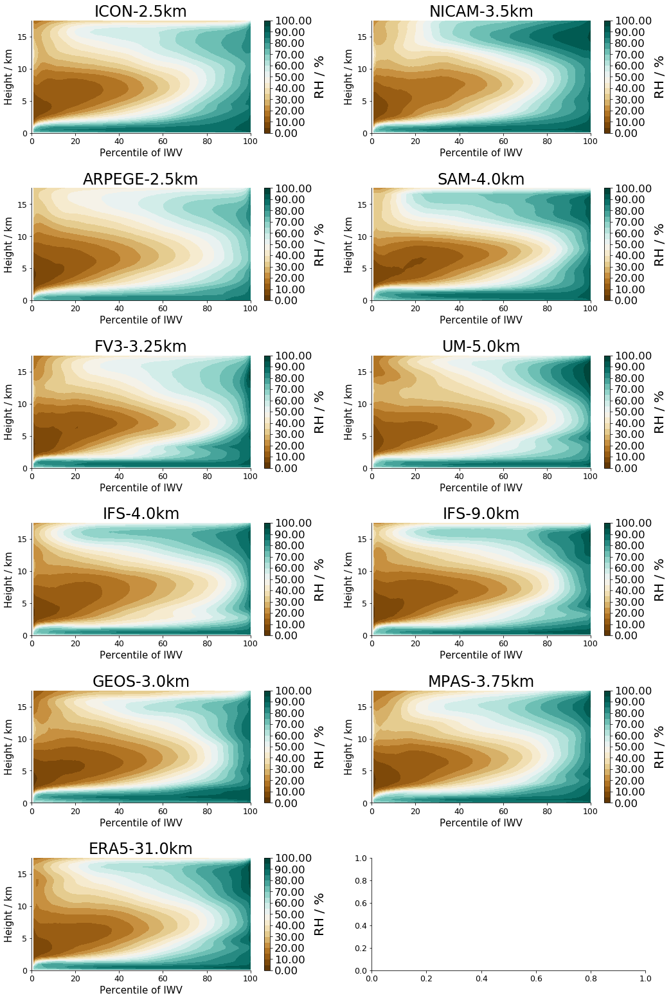

In [46]:
reload(plots)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 22))
tick_labels = np.arange(10, 81, 10)
ax = ax.ravel()

plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height / km'
contours = np.arange(0, 101, 5)
contours_ci = np.arange(1, 200, 20)
contours_cl = np.arange(1, 150, 20)

lower_layer_bnd = 100
upper_layer_bnd = 12500
mean_up = {}
for m in exps:
    mean_up[m] = ms_perc[m]['Wint'].mean

for i, exp in enumerate(exps):
    plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, (ms_perc[exp]['RH'].mean.T) * 1e2, contours,\
                                  x_lims, y_lims, x_label, y_label, 'RH / %',
                                  cm_orientation='vertical', cb_extend='neither', cb_ticks=np.arange(0, 110, 10),\
                                  cmap='BrBG', vmin=0, vmax=100)
        
    #ci = plots.moisture_space_contour(fig, ax[i], perc_values, h * 1e-3, ms_perc[exp]['QI'].mean.T * 1e6, contours_ci,\
    #                              x_lims, y_lims, x_label, y_label, 'w')
    #cl = plots.moisture_space_contour(fig, ax[i], perc_values, h * 1e-3, ms_perc[exp]['QC'].mean.T * 1e6, contours_cl,\
    #                               x_lims, y_lims, x_label, y_label, 'lightblue')
    print(np.mean(ms_perc_series['RH'].mean))
    #cs = plots.moisture_space_contour(fig, ax[i], perc_values, h * 1e-3, ms_perc[exp]['W'].mean.T,\
    #                         [0.0], x_lims, y_lims, x_label, y_label, 'k')
    #plots.moisture_space_line(ax[i], perc_values, ms_perc[exp]['H_tropo'].mean * 1e-3,\
    #                              x_lims, y_lims, x_label, y_label, lw=2, label=m, color='r')
    w0 = np.argmin(np.abs(mean_up[exp]))
    perc_w0 = perc_values[w0]
    #ax[i].plot([perc_w0, perc_w0], y_lims)
    ax[i].set_title(exp)
    freezing_level = h[np.argmin(np.abs(ms_perc[exp]['TEMP'].mean - 273.15), axis=1)] 
    #ax[i].plot(perc_values[80:100], freezing_level[80:100] * 1e-3)

plt.tight_layout()
plt.savefig('plots_seminar/RH_moisture_space.pdf', dpi=450)


# Moisture space overview 2 - IWV bins

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7ea1e8f28>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7d52c9438>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


0.49250534211899505
0.49250534211899505


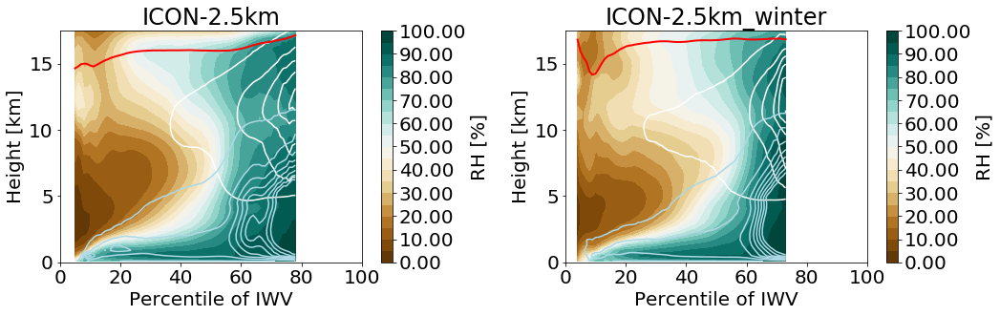

In [107]:
reload(plots)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 5))
tick_labels = np.arange(10, 81, 10)
ax = ax.ravel()

plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height [km]'
contours = np.arange(0, 101, 5)
contours_ci = np.arange(1, 200, 20)
contours_cl = np.arange(1, 150, 20)

lower_layer_bnd = 100
upper_layer_bnd = 12500
mean_up = {}

for i, exp in enumerate(exps):
    plots.moisture_space_contourf(fig, ax[i], bins, h * 1e-3, (ms_bins[exp]['RH'].mean.T) * 1e2, contours,\
                                  x_lims, y_lims, x_label, y_label, 'RH [%]',
                                  cm_orientation='vertical', cb_extend='neither', cb_ticks=np.arange(0, 110, 10),\
                                  cmap='BrBG', vmin=0, vmax=100)
        
    ci = plots.moisture_space_contour(fig, ax[i], bins, h * 1e-3, ms_bins[exp]['QI'].mean.T * 1e6, contours_ci,\
                                  x_lims, y_lims, x_label, y_label, 'w')
    cl = plots.moisture_space_contour(fig, ax[i], bins, h * 1e-3, ms_bins[exp]['QC'].mean.T * 1e6, contours_cl,\
                                   x_lims, y_lims, x_label, y_label, 'lightblue')
    print(np.mean(ms_perc_series['RH'].mean))
    #cs = plots.moisture_space_contour(fig, ax[i], perc_values, h * 1e-3, ms_perc[exp]['W'].mean.T,\
    #                         [0.0], x_lims, y_lims, x_label, y_label, 'k')
    plots.moisture_space_line(ax[i], bins, ms_bins[exp]['H_tropo'].mean * 1e-3,\
                                  x_lims, y_lims, x_label, y_label, lw=2, label=m, color='r')
    
    #ax[i].plot([perc_w0, perc_w0], y_lims)
    ax[i].set_title(exp)
    freezing_level = h[np.argmin(np.abs(ms_perc[exp]['TEMP'].mean - 273.15), axis=1)] 
    #ax[i].plot(perc_values[80:100], freezing_level[80:100] * 1e-3)

plt.tight_layout()



DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1cb2c4b00>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1c8377e10>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1c91cfe10>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1cc8c4eb8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1ca9fa550>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1c9262ba8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1c9e51cc0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

IndexError: index 10 is out of bounds for axis 0 with size 10

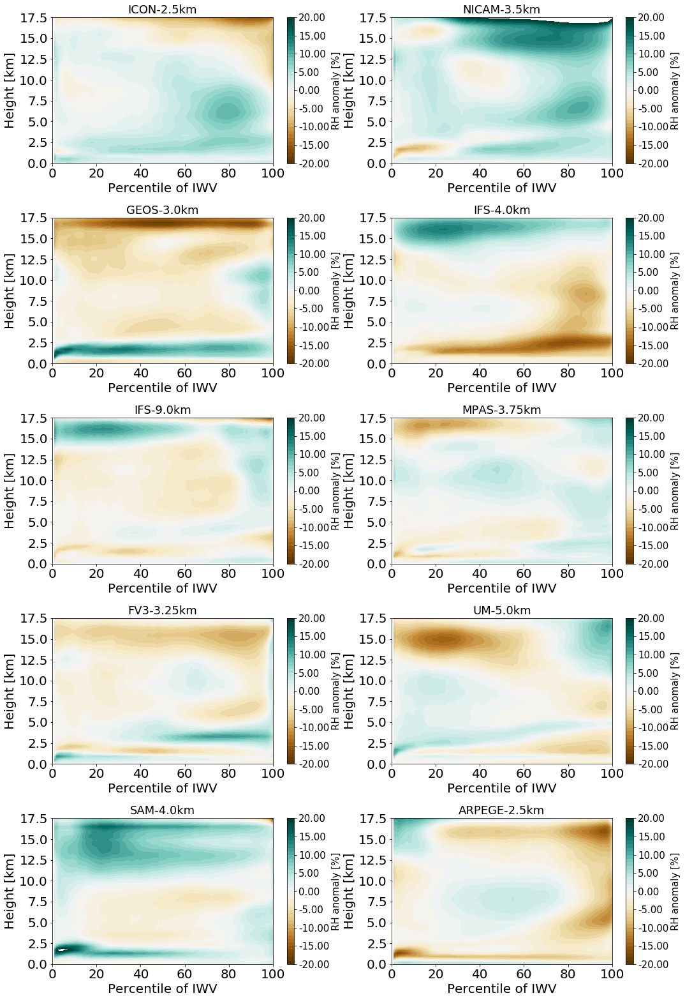

In [207]:
reload(plots)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 22))
tick_labels = np.arange(10, 81, 10)
ax = ax.ravel()

plt.rcParams.update({'font.size': 15})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'
contours=np.arange(-20, 21, 1)

for i, exp in enumerate(exps):
    plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, (ms_perc[exp]['RH'].mean.T - ms_perc_series['RH'].mean.T) * 1e2, contours,\
                                  x_lims, y_lims, x_label, y_label, 'RH anomaly [%]',
                                  cm_orientation='vertical', cb_extend='neither',
                                  cmap='BrBG', vmin=-20, vmax=20)
    ax[i].set_title(exp)
plt.tight_layout()
ax[i+1].set_visible(False)

# Moisture space overview one model

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7e9af2438>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7e9b10e80>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7e93d8470>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7ea217198>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7e9b06ef0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7e9e575f8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7eb5be320>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

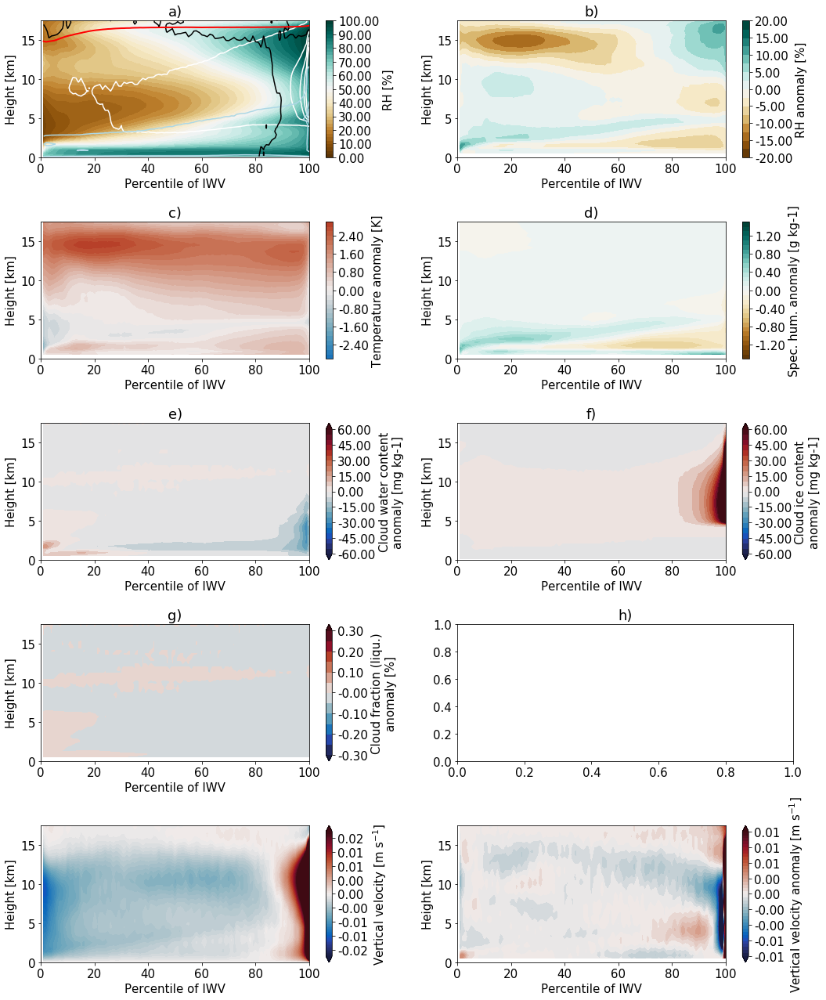

In [152]:
exp = 'UM-5.0km'
fig, ax = plt.subplots(5, 2, figsize=(15, 18))

x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'

contours_rh = np.arange(0, 101, 2.5)
contours_rh_anom = np.arange(-20, 21, 2.5)
contours_temp = np.arange(-3, 3.2, 0.2)
contours_qv = np.arange(-1.5, 1.6, 0.1)
contours_ci = np.arange(1, 200, 40)
contours_cl = np.arange(1, 150, 25)
contours_cfl_anom = np.arange(-0.3, 0.31, 0.05)
contours_w = np.arange(-0.02, 0.020001, 0.0005)
contours_w_anom = np.arange(-0.01, 0.010001, 0.0005)
contours_qc_anom = np.arange(-60, 61, 5)
mean_up = ms_perc[exp]['Wint'].mean
plots.moisture_space_contourf(fig, ax[0, 0], perc_values, h * 1e-3, (ms_perc[exp]['RH'].mean.T) * 1e2, contours_rh,\
                              x_lims, y_lims, x_label, y_label, 'RH [%]',
                              cm_orientation='vertical', cb_extend='neither', cb_ticks=np.arange(0, 101, 10),
                              cmap='BrBG', vmin=0, vmax=100)
ci = plots.moisture_space_contour(fig, ax[0, 0], perc_values, h * 1e-3, ms_perc[exp]['QI'].mean.T * 1e6, contours_ci,\
                              x_lims, y_lims, x_label, y_label, 'w')
cl = plots.moisture_space_contour(fig, ax[0, 0], perc_values, h * 1e-3, ms_perc[exp]['QC'].mean.T * 1e6, contours_cl,\
                               x_lims, y_lims, x_label, y_label, 'lightblue')
plots.moisture_space_line(ax[0, 0], perc_values, ms_perc[exp]['H_tropo'].mean * 1e-3,\
                              x_lims, y_lims, x_label, y_label, lw=2, label=m, color='r')
cs = plots.moisture_space_contour(fig, ax[0, 0], perc_values, h * 1e-3, ms_perc[exp]['W'].mean.T,\
                             [0.0], x_lims, y_lims, x_label, y_label, 'k')
plots.moisture_space_contourf(fig, ax[0, 1], perc_values, h * 1e-3, (ms_perc[exp]['RH'].mean.T - ms_perc_series['RH'].mean.T) * 1e2, contours_rh_anom,\
                              x_lims, y_lims, x_label, y_label, 'RH anomaly [%]',
                              cm_orientation='vertical', cb_extend='neither',
                              cmap='BrBG', vmin=-20, vmax=20)
plots.moisture_space_contourf(fig, ax[1, 0], perc_values, h * 1e-3, (ms_perc[exp]['TEMP'].mean.T - ms_perc_series['TEMP'].mean.T), contours_temp,\
                              x_lims, y_lims, x_label, y_label, 'Temperature anomaly [K]',
                              cm_orientation='vertical', cb_extend='neither',
                              cmap='difference', vmin=-5, vmax=5)
plots.moisture_space_contourf(fig, ax[1, 1], perc_values, h * 1e-3, (ms_perc[exp]['QV'].mean.T - ms_perc_series['QV'].mean.T) * 1e3, contours_qv,\
                              x_lims, y_lims, x_label, y_label, 'Spec. hum. anomaly [g kg-1]',
                              cm_orientation='vertical', cb_extend='neither',
                              cmap='BrBG', vmin=-1.5, vmax=1.5)
plots.moisture_space_contourf(fig, ax[2, 0], perc_values, h * 1e-3, (ms_perc[exp]['QC'].mean.T - ms_perc_series['QC'].mean.T) * 1e6, contours_qc_anom,\
                              x_lims, y_lims, x_label, y_label, 'Cloud water content\nanomaly [mg kg-1]',
                              cm_orientation='vertical', cb_extend='both', vmin=-60, vmax=60,
                              cmap='difference')
plots.moisture_space_contourf(fig, ax[2, 1], perc_values, h * 1e-3, (ms_perc[exp]['QI'].mean.T - ms_perc_series['QI'].mean.T) * 1e6, contours_qc_anom,\
                              x_lims, y_lims, x_label, y_label, 'Cloud ice content\nanomaly [mg kg-1]',
                              cm_orientation='vertical', cb_extend='both', vmin=-60, vmax=60,
                              cmap='difference')
plots.moisture_space_contourf(fig, ax[3, 0], perc_values, h * 1e-3, (ms_perc[exp]['CFL'].mean.T - ms_perc_series['CFL'].mean.T), contours_cfl_anom,\
                              x_lims, y_lims, x_label, y_label, 'Cloud fraction (liqu.)\nanomaly [%]',
                              cm_orientation='vertical', cb_extend='both', vmin=-0.3, vmax=0.3,
                              cmap='difference')
plots.moisture_space_contourf(fig, ax[4, 0], perc_values, h * 1e-3, ms_perc[exp]['W'].mean.T,\
                             contours_w, x_lims, y_lims, x_label, y_label, r'Vertical velocity [m s$^{-1}$]', cm_orientation='vertical', cmap='difference')
plots.moisture_space_contourf(fig, ax[4, 1], perc_values, h * 1e-3, ms_perc[exp]['W'].mean.T - ms_perc_series['W'].mean.T,\
                             contours_w_anom, x_lims, y_lims, x_label, y_label, r'Vertical velocity anomaly [m s$^{-1}$]', cm_orientation='vertical', cmap='difference')

ax[0, 0].set_title('a)')
ax[0, 1].set_title('b)')
ax[1, 0].set_title('c)')
ax[1, 1].set_title('d)')
ax[2, 0].set_title('e)')
ax[2, 1].set_title('f)')
ax[3, 0].set_title('g)')
ax[3, 1].set_title('h)')
plt.tight_layout()

# Cloud ice

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7e9cf3080>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f049a908>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f0157b38>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f09369e8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f0939cf8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7e9adac88>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7eb8ab630>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

IndexError: index 10 is out of bounds for axis 0 with size 10

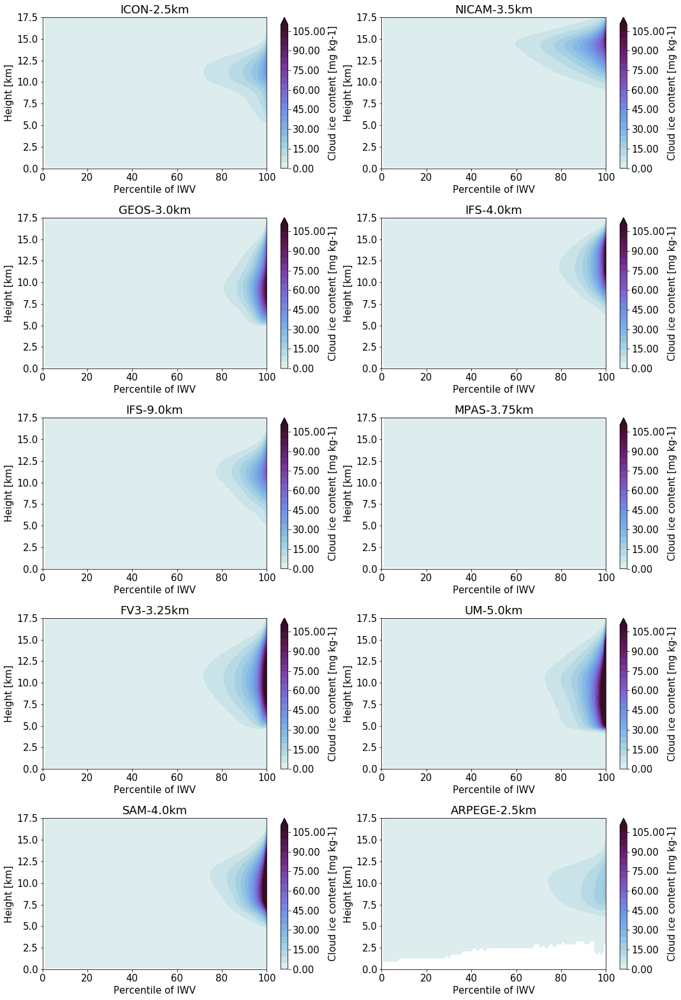

In [139]:
reload(plots)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 22))
tick_labels = np.arange(10, 81, 10)
ax = ax.ravel()

plt.rcParams.update({'font.size': 15})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'
contours=np.arange(0, 111, 5)

for i, exp in enumerate(exps):
    plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, (ms_perc[exp]['QI'].mean.T) * 1e6, contours,\
                                  x_lims, y_lims, x_label, y_label, 'Cloud ice content [mg kg-1]',
                                  cm_orientation='vertical', cb_extend='max',
                                  cmap='density', vmin=0, vmax=110)
    ax[i].set_title(exp)
plt.tight_layout()
ax[i+1].set_visible(False)

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1cddfec88>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1cde8ac50>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1cdf20748>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1ce0aec88>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1ce1378d0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1ce1ca940>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1cc27b7b8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

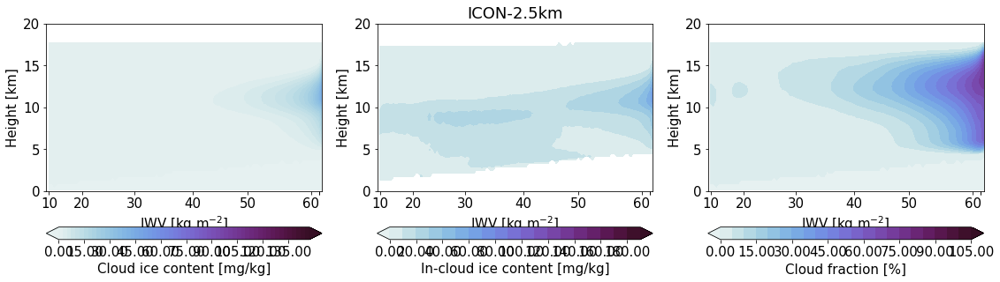

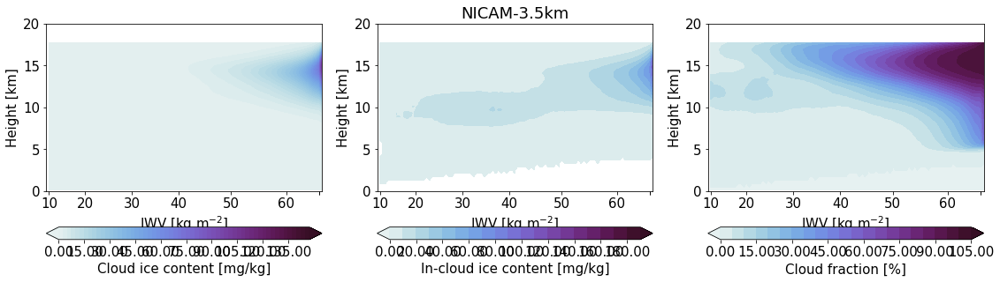

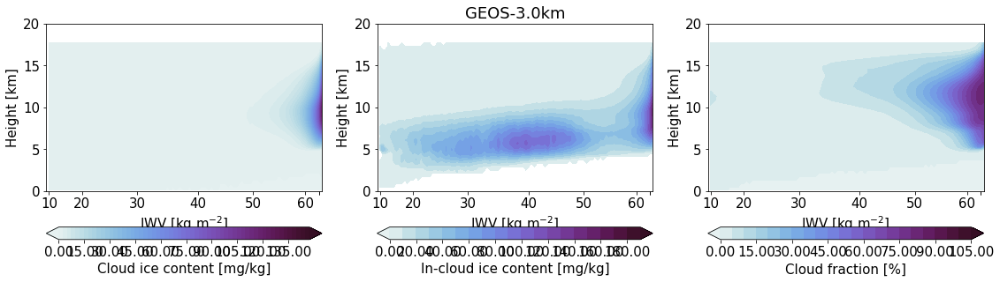

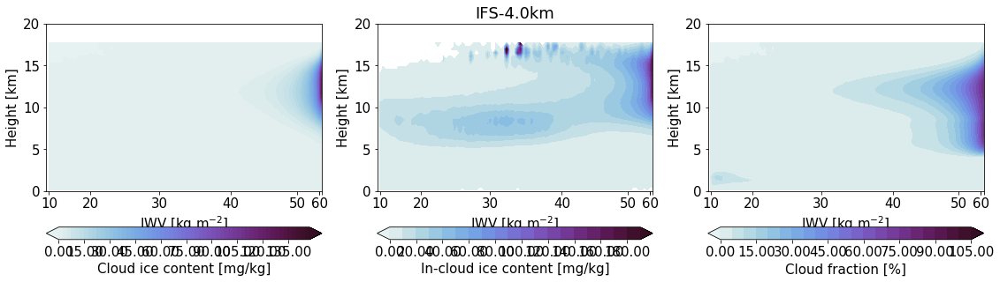

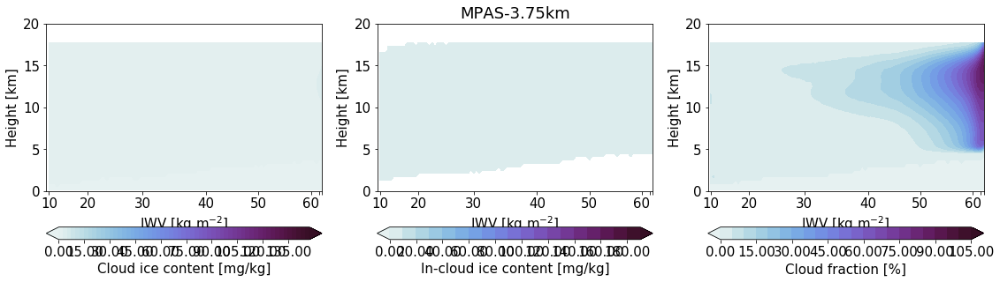

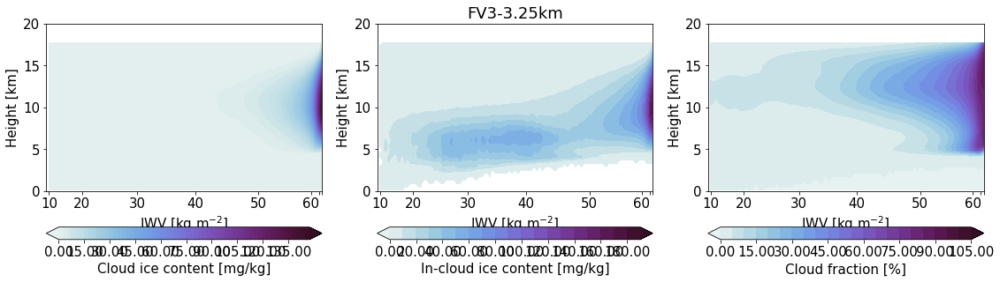

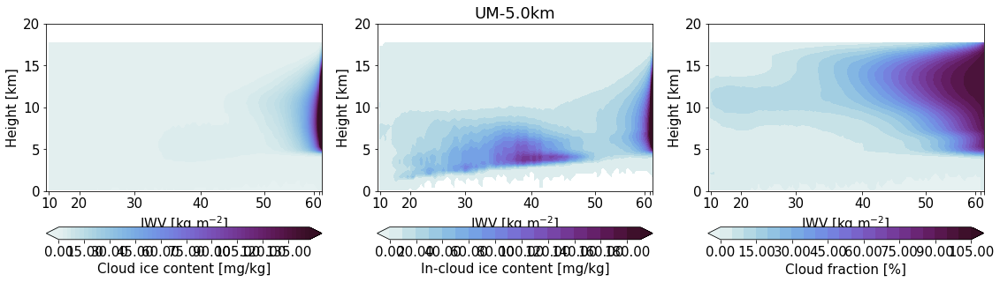

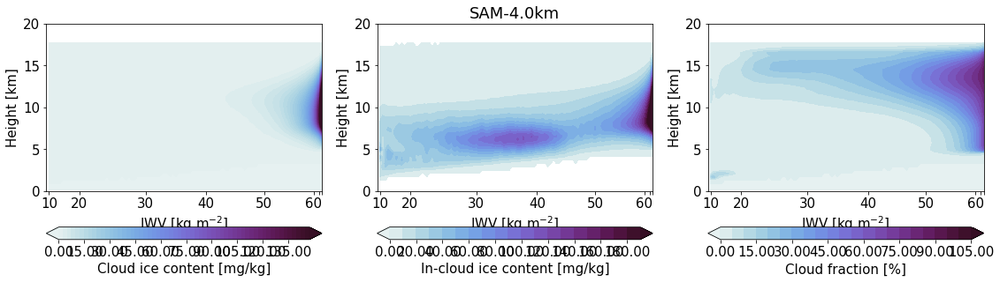

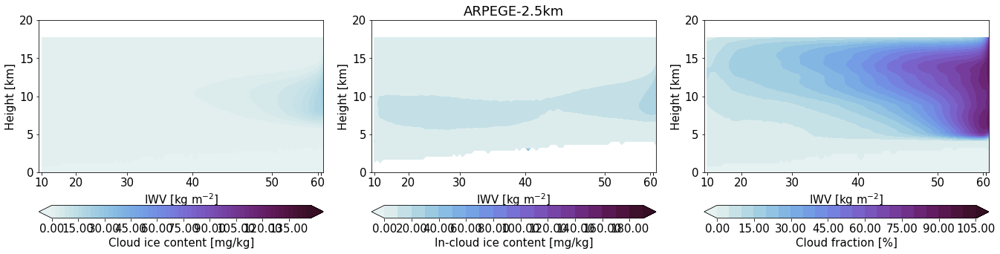

In [183]:
plt.rcParams.update({'font.size': 15})
tick_labels = np.arange(10, 81, 10)
x_lims = [0, 100]
y_lims = [0, 20]
x_label = 'IWV [kg m$^{-2}$]'
y_label = 'Height [km]'
for m in exps:
    fig, ax = plt.subplots(1, 3, figsize=(19, 5))
    contours_qi = np.arange(0, 150, 2.5)
    contours_icqi = np.arange(0, 200, 10)
    contours_cfi = np.arange(0, 110, 5)
    ax[1].set_title(m)
    plots.moisture_space_contourf(fig, ax[0], perc_values, h * 1e-3, ms_perc[m]['QI'].mean.T * 1e6, contours_qi,\
                                  x_lims, y_lims, x_label, y_label, 'Cloud ice content [mg/kg]',\
                                  percentiles[m], tick_labels,\
                                  cmap='density')
    plots.moisture_space_contourf(fig, ax[1], perc_values, h * 1e-3, ms_perc[m]['ICQI'].mean.T * 1e6, contours_icqi,\
                                  x_lims, y_lims, x_label, y_label, 'In-cloud ice content [mg/kg]',\
                                  percentiles[m], tick_labels,\
                                  cmap='density')
    plots.moisture_space_contourf(fig, ax[2], perc_values, h * 1e-3, ms_perc[m]['CFI'].mean.T * 1e2, contours_cfi,\
                                  x_lims, y_lims, x_label, y_label, 'Cloud fraction [%]',\
                                  percentiles[m], tick_labels,\
                                  cmap='density')
plt.tight_layout()

# Cloud water

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7eac12518>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f0d0af28>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7ea5b3908>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7eae96400>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f0782128>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f0d56940>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f0876160>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

IndexError: index 10 is out of bounds for axis 0 with size 10

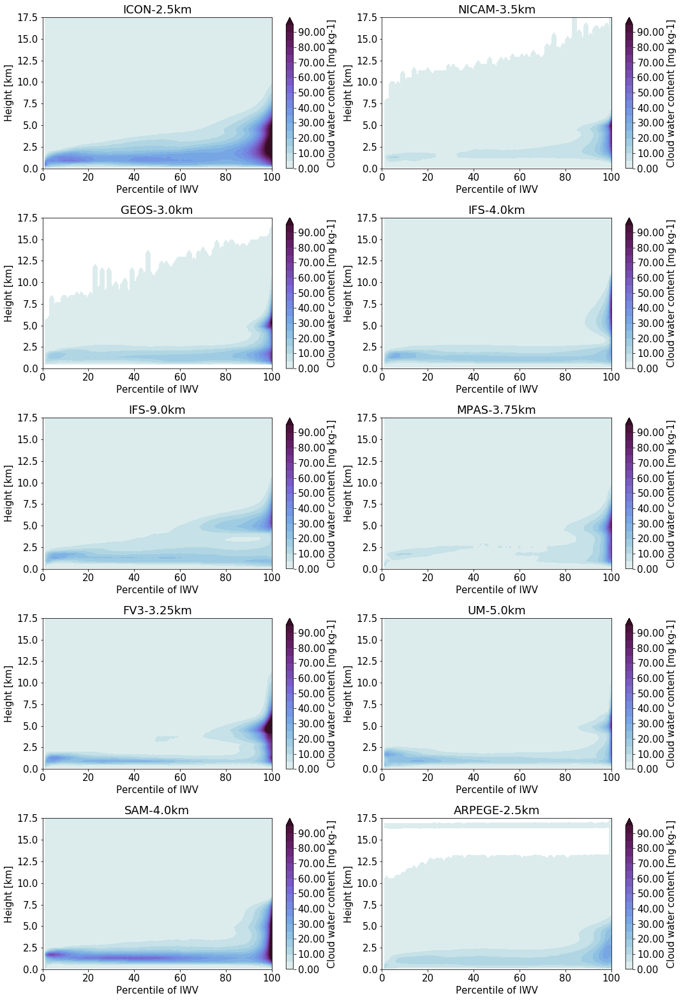

In [138]:
reload(plots)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 22))
tick_labels = np.arange(10, 81, 10)
ax = ax.ravel()

plt.rcParams.update({'font.size': 15})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'
contours=np.arange(0, 100, 5)

for i, exp in enumerate(exps):
    plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, (ms_perc[exp]['QC'].mean.T) * 1e6, contours,\
                                  x_lims, y_lims, x_label, y_label, 'Cloud water content [mg kg-1]',
                                  cm_orientation='vertical', cb_extend='max',
                                  cmap='density', vmin=0, vmax=100)
    ax[i].set_title(exp)
plt.tight_layout()
ax[i+1].set_visible(False)

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eaf3838d0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2ead9db1d0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eb1bd8a20>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2ead712240>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eaf20e908>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eafab9cc0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eae7ee0f0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

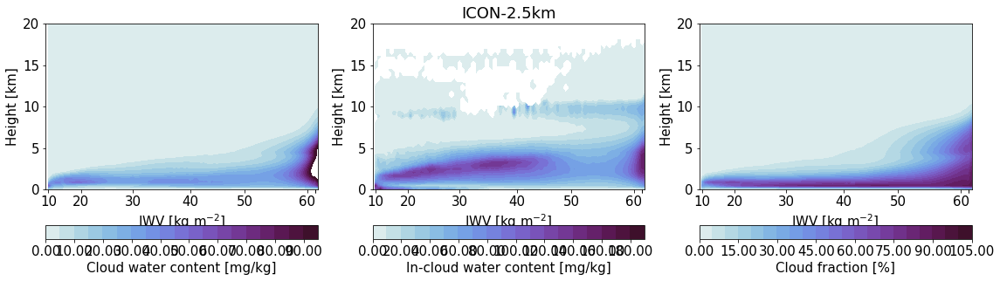

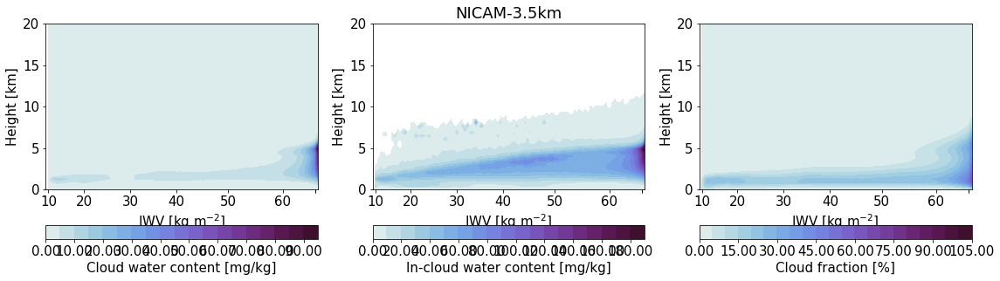

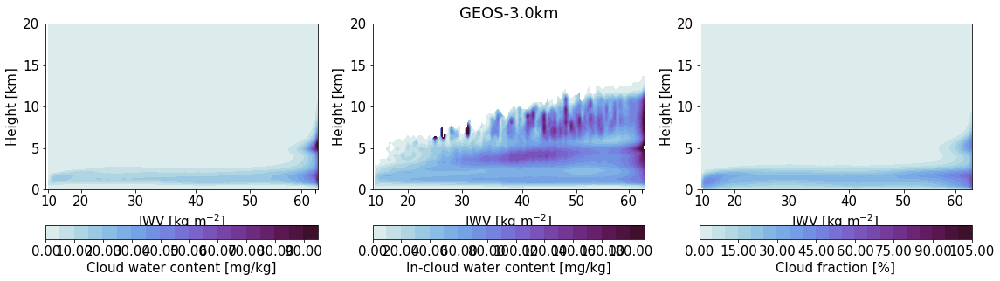

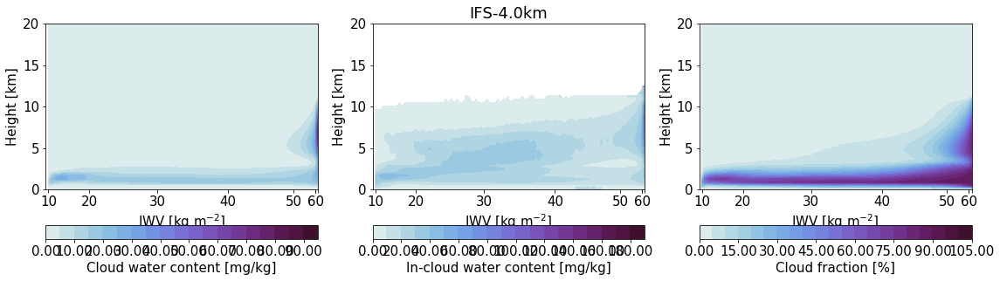

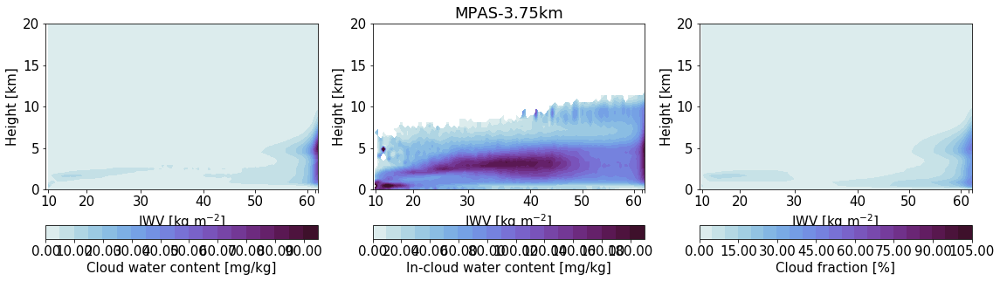

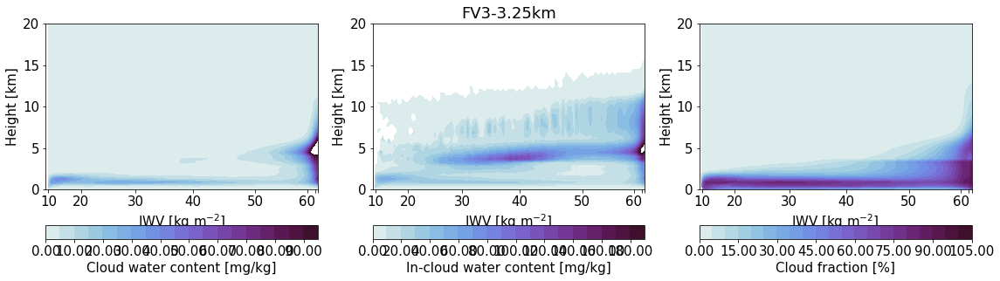

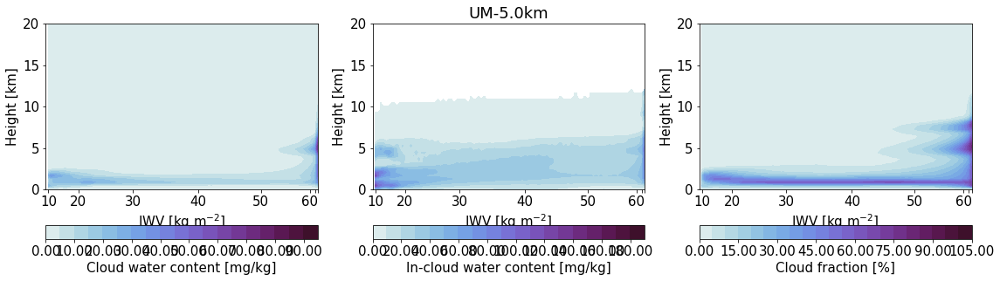

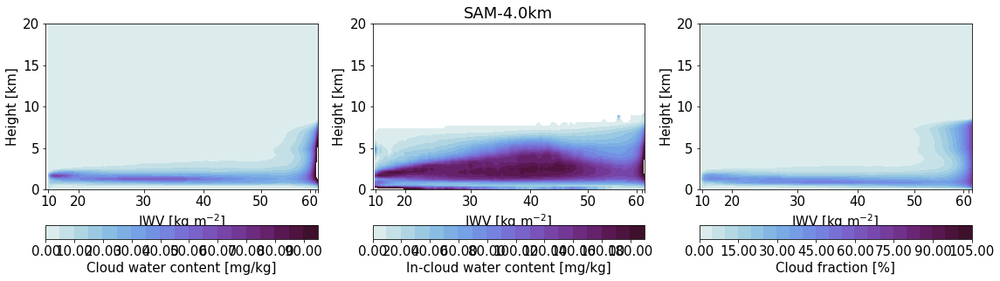

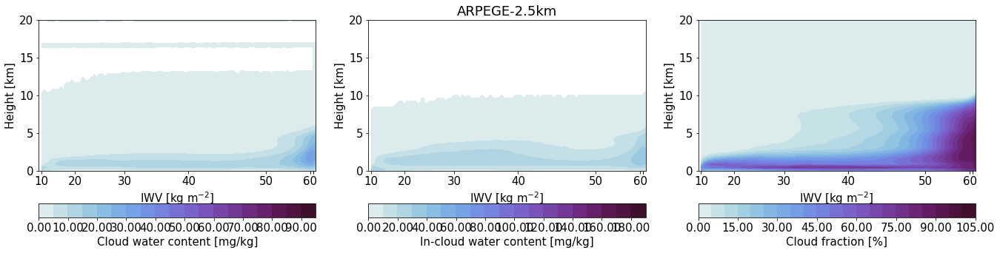

In [184]:
plt.rcParams.update({'font.size': 15})
tick_labels = np.arange(10, 81, 10)
x_lims = [0, 100]
y_lims = [0, 20]
x_label = 'IWV [kg m$^{-2}$]'
y_label = 'Height [km]'
for m in exps:
    fig, ax = plt.subplots(1, 3, figsize=(19, 5))
    contours_qi = np.arange(0, 100, 5)
    contours_icqi = np.arange(0, 200, 10)
    contours_cfi = np.arange(0, 110, 5)
    ax[1].set_title(m)
    plots.moisture_space_contourf(fig, ax[0], perc_values, h * 1e-3, ms_perc[m]['QC'].mean.T * 1e6, contours_qi,\
                                  x_lims, y_lims, x_label, y_label, 'Cloud water content [mg/kg]',\
                                  percentiles[m], tick_labels,\
                                  cmap='density')
    plots.moisture_space_contourf(fig, ax[1], perc_values, h * 1e-3, ms_perc[m]['ICQC'].mean.T * 1e6, contours_icqi,\
                                  x_lims, y_lims, x_label, y_label, 'In-cloud water content [mg/kg]',\
                                  percentiles[m], tick_labels,\
                                  cmap='density')
    plots.moisture_space_contourf(fig, ax[2], perc_values, h * 1e-3, ms_perc[m]['CFL'].mean.T * 1e2, contours_cfi,\
                                  x_lims, y_lims, x_label, y_label, 'Cloud fraction [%]',\
                                  percentiles[m], tick_labels,\
                                  cmap='density')
plt.tight_layout()

# Temperature

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f4126c18>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f27e5eb8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f2cd4ac8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f44d2828>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f2c5f4e0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f4e30c88>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f22bb860>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

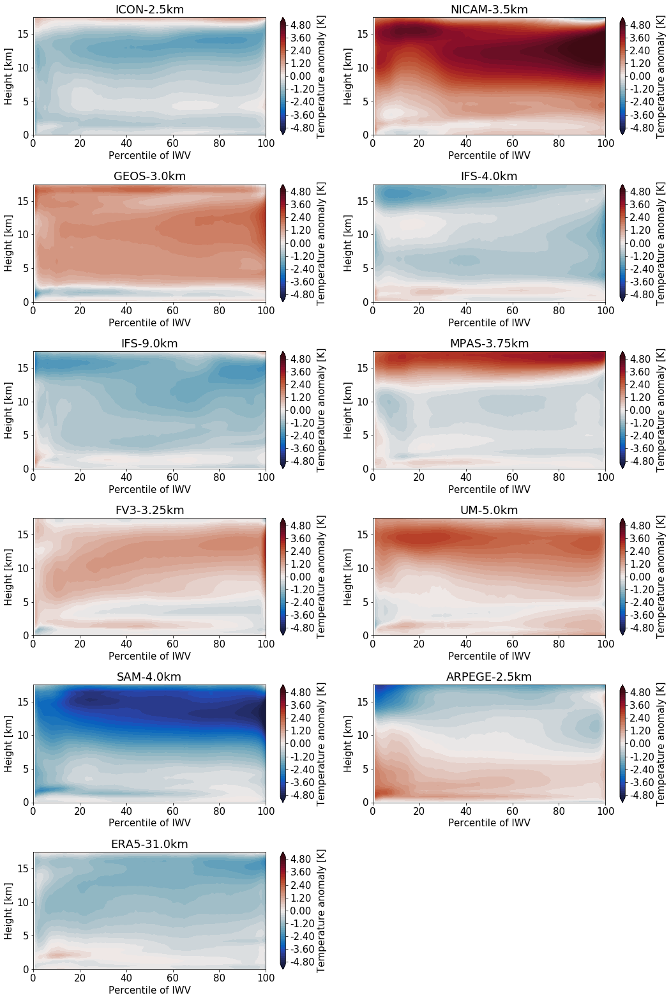

In [324]:
reload(plots)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 22))
tick_labels = np.arange(10, 81, 10)
ax = ax.ravel()

plt.rcParams.update({'font.size': 15})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'
contours=np.arange(-5, 5.2, 0.2)

for i, exp in enumerate(exps):
    plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, (ms_perc[exp]['TEMP'].mean.T - ms_perc_series['TEMP'].mean.T), contours,\
                                  x_lims, y_lims, x_label, y_label, 'Temperature anomaly [K]',
                                  cm_orientation='vertical', cb_extend='both',
                                  cmap='difference', vmin=-5, vmax=5)
    ax[i].set_title(exp)
plt.tight_layout()
ax[i+1].set_visible(False)

# Water vapor

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f1c01ef0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f45268d0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


IndexError: index 2 is out of bounds for axis 0 with size 2

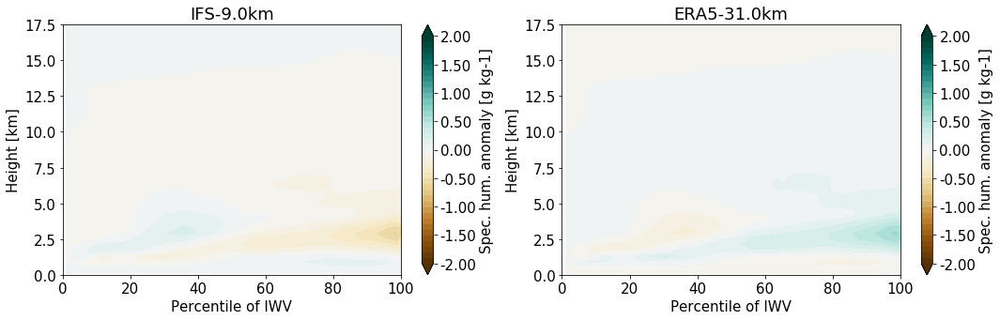

In [338]:
reload(plots)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 5))
tick_labels = np.arange(10, 81, 10)
ax = ax.ravel()

plt.rcParams.update({'font.size': 15})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'
contours=np.arange(-2, 2.1, 0.1)

for i, exp in enumerate(exps):
    plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, (ms_perc[exp]['QV'].mean.T - ms_perc_series['QV'].mean.T) * 1e3, contours,\
                                  x_lims, y_lims, x_label, y_label, 'Spec. hum. anomaly [g kg-1]',
                                  cm_orientation='vertical', cb_extend='both',
                                  cmap='BrBG', vmin=-2, vmax=2)
    ax[i].set_title(exp)
plt.tight_layout()
ax[i+1].set_visible(False)

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f4dd5860>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f57e3e10>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f28a5ef0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f51d04e0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f1b2a8d0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f357a780>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f34e8cf8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

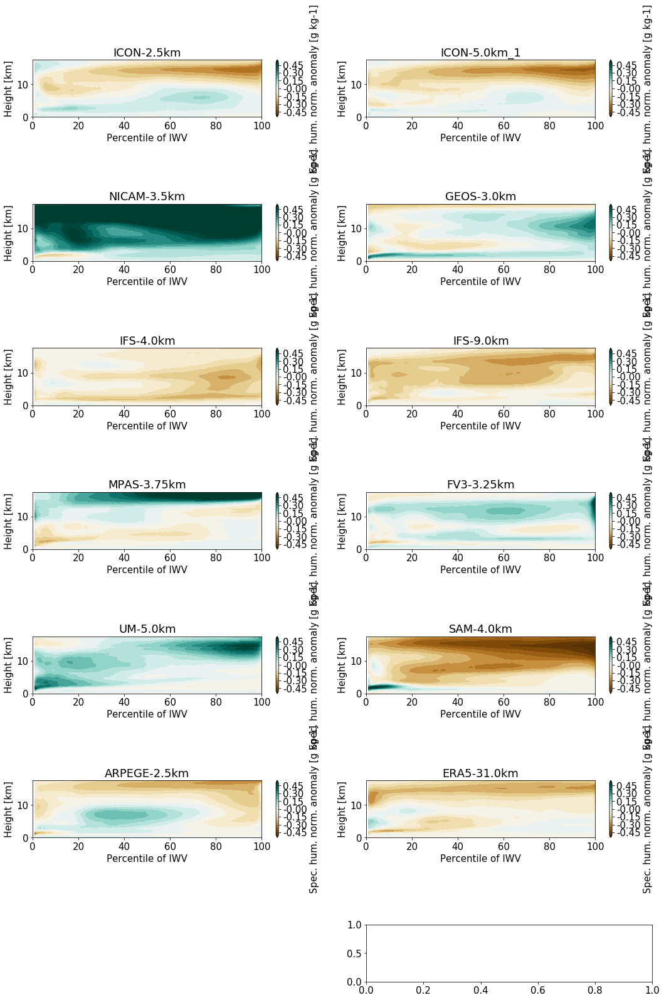

In [386]:
reload(plots)
fig, ax = plt.subplots(np.ceil((len(exps)+1) / 2).astype(int), 2, figsize=(15, 22))
tick_labels = np.arange(10, 81, 10)
ax = ax.ravel()

plt.rcParams.update({'font.size': 15})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'
contours=np.arange(-0.5, 0.501, 0.05)

for i, exp in enumerate(exps):
    plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, (ms_perc[exp]['QV'].mean.T - ms_perc_series['QV'].mean.T) / ms_perc_series['QV'].mean.T, contours,\
                                  x_lims, y_lims, x_label, y_label, 'Spec. hum. norm. anomaly [g kg-1]',
                                  cm_orientation='vertical', cb_extend='both',
                                  cmap='BrBG', vmin=contours[0], vmax=contours[-1])
    ax[i].set_title(exp)
plt.tight_layout()
ax[i+1].set_visible(False)

# Relative humidity

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b568d7a2cf8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b568e72ec88>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b568e7f3ef0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b568e8c1550>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b568e974ef0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b568ea43160>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b568eb04160>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

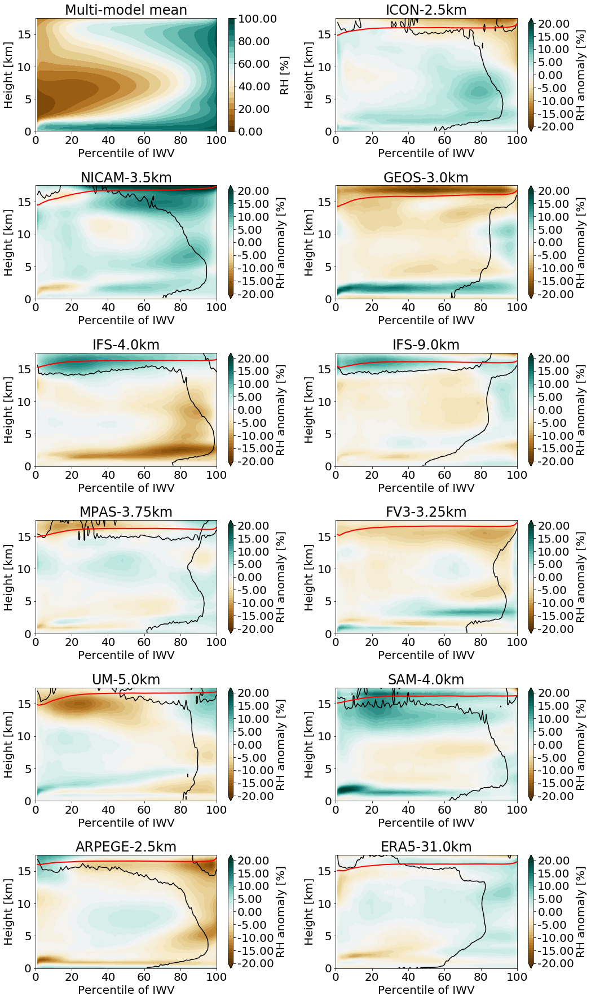

In [16]:
reload(plots)
fig, ax = plt.subplots(np.ceil((len(exps)+1) / 2).astype(int), 2, figsize=(15, 25))
tick_labels = np.arange(10, 81, 10)
ax = ax.ravel()

plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height [km]'

plots.moisture_space_contourf(fig, ax[0], perc_values, h * 1e-3, ms_perc_series['RH'].mean.T * 1e2, np.arange(0, 101, 5),\
                              x_lims, y_lims, x_label, y_label, 'RH [%]',
                              cm_orientation='vertical', cb_extend='neither', cb_ticks=np.arange(0, 101, 20), \
                              cmap='BrBG', vmin=0, vmax=100)
ax[0].set_title('Multi-model mean')
for i, exp in enumerate(exps):
    plots.moisture_space_contourf(fig, ax[i+1], perc_values, h * 1e-3, (ms_perc[exp]['RH'].mean.T - ms_perc_series['RH'].mean.T)* 1e2, np.arange(-20, 21, 1),\
                                  x_lims, y_lims, x_label, y_label, 'RH anomaly [%]',
                                  cm_orientation='vertical', cb_extend='both',\
                                  cmap='BrBG', vmin=-20, vmax=20)
        
    cs = plots.moisture_space_contour(fig, ax[i+1], perc_values, h * 1e-3, ms_perc[exp]['W'].mean.T,\
                             [0.0], x_lims, y_lims, x_label, y_label, 'k')
    plots.moisture_space_line(ax[i+1], perc_values, ms_perc[exp]['H_tropo'].mean * 1e-3,\
                                  x_lims, y_lims, x_label, y_label, lw=2, label=m, color='r')
  
    ax[i+1].set_title(exp)

plt.tight_layout()

# Cloud ice water vapor fraction

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1ca8b1f28>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1c840f780>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1ca2deef0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1c9daf7f0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1ca1fb160>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1ca0ec860>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ae1ca37b128>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

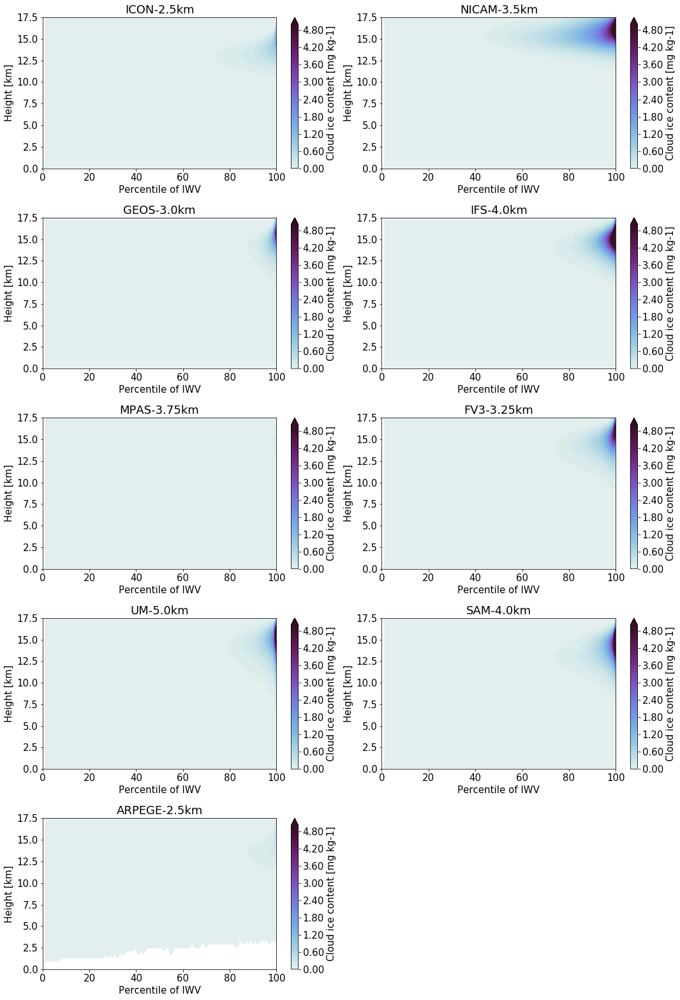

In [62]:
reload(plots)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 22))
tick_labels = np.arange(10, 81, 10)
ax = ax.ravel()

plt.rcParams.update({'font.size': 15})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'
contours=np.arange(0, 5.1, 0.1)

for i, exp in enumerate(exps):
    plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, (ms_perc[exp]['QI'].mean.T / ms_perc[exp]['QV'].mean.T), contours,\
                                  x_lims, y_lims, x_label, y_label, 'Cloud ice content [mg kg-1]',
                                  cm_orientation='vertical', cb_extend='max',
                                  cmap='density', vmin=0, vmax=5)
    ax[i].set_title(exp)
plt.tight_layout()
ax[i+1].set_visible(False)

# Different anomalies

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eaecedd30>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eaf9a9eb8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eb0933048>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eb09b3630>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eb0ba3ef0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eb0ca4fd0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eab40f978>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

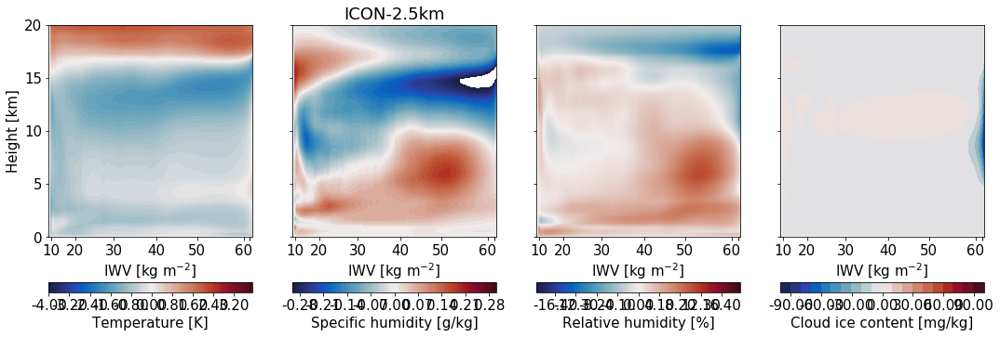

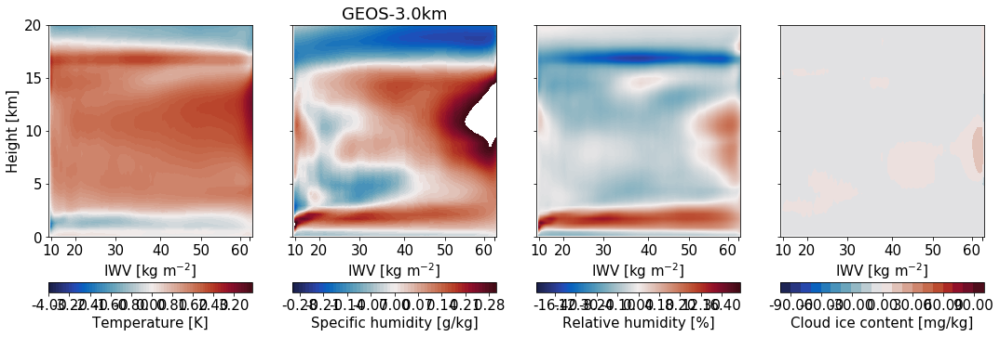

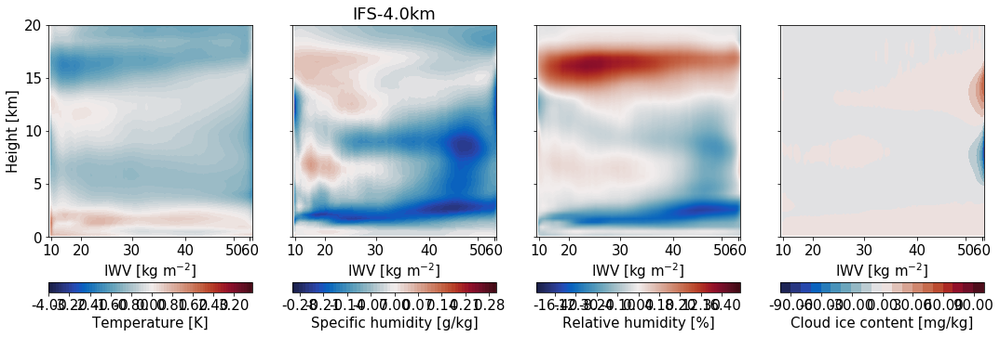

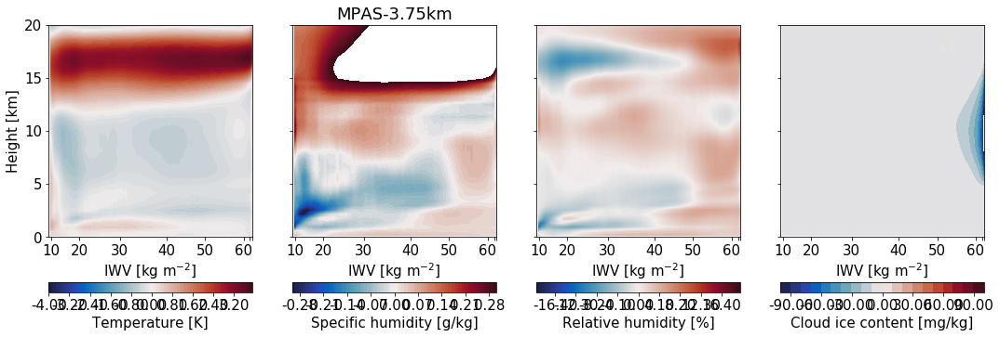

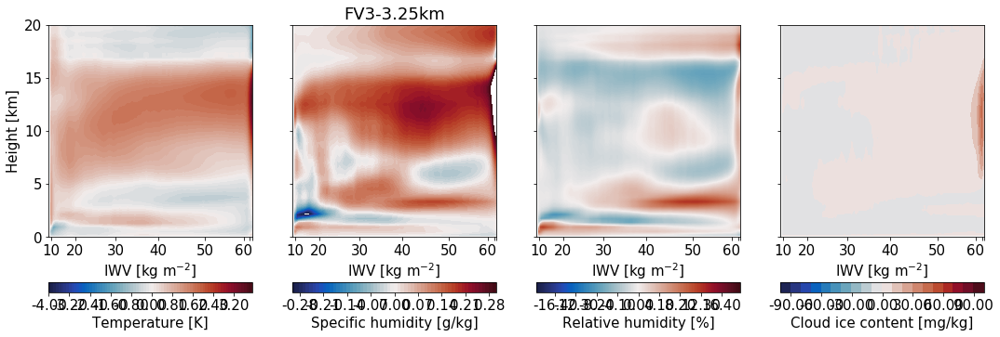

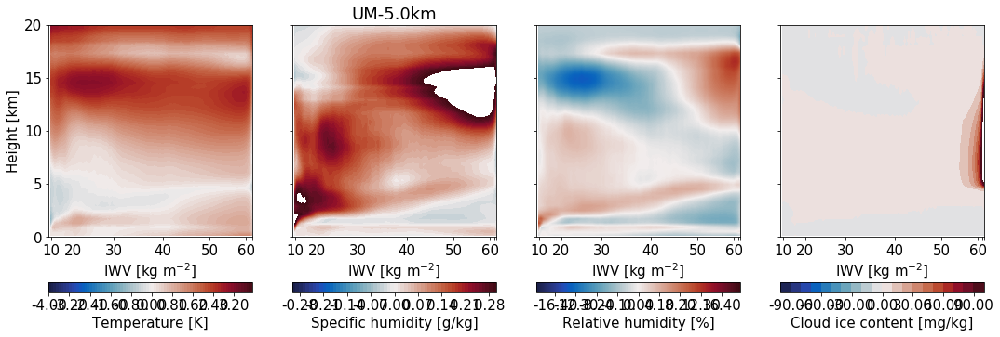

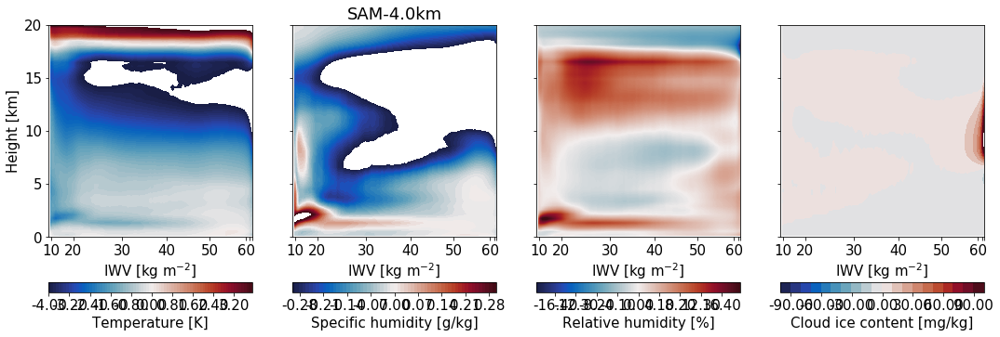

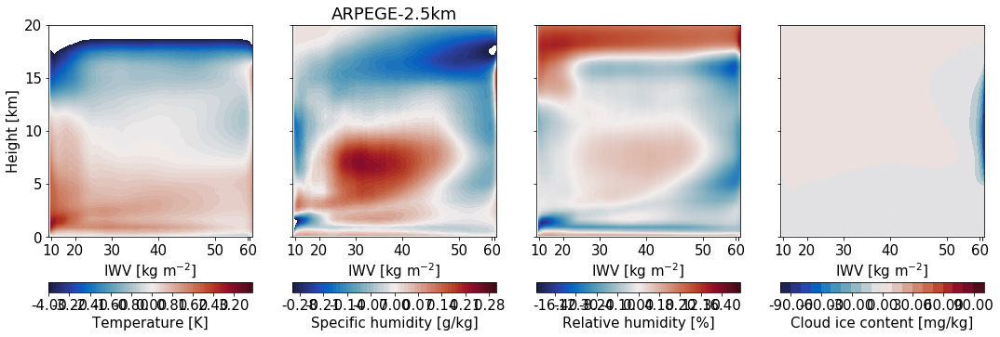

In [131]:
plt.rcParams.update({'font.size': 15})
tick_labels = np.arange(10, 81, 10)
x_lims = [0, 100]
y_lims = [0, 20]
x_label = 'IWV [kg m$^{-2}$]'
y_label = 'Height [km]'
for m in models_variability:
    fig, ax = plt.subplots(1, 4, figsize=(18, 6), sharey=True)
    contours_temp = np.arange(-4.0, 4.0, 0.1)
    contours_qv = np.arange(-0.3, 0.31, 0.01)#np.arange(-2.0, 2.1, 0.1)
    contours_rh = np.arange(-20, 20.1, 0.1)
    contours_qi = np.arange(-100, 110, 10)
    ax[1].set_title(m)
    plots.moisture_space_contourf(fig, ax[0], perc_values, h * 1e-3, ms_perc[m]['TEMP'].mean.T - ms_perc_series['TEMP'].mean.T, contours_temp,\
                                  x_lims, y_lims, x_label, y_label, 'Temperature [K]',\
                                  percentiles[m], tick_labels, vmin=-4, vmax=4,\
                                  cmap='difference')
    plots.moisture_space_contourf(fig, ax[1], perc_values, h * 1e-3, (ms_perc[m]['logQV'].mean.T - ms_perc_series['logQV'].mean.T), contours_qv,\
                                  x_lims, y_lims, x_label, '', 'Specific humidity [g/kg]',\
                                  percentiles[m], tick_labels, \
                                  cmap='difference')
    plots.moisture_space_contourf(fig, ax[2], perc_values, h * 1e-3, (ms_perc[m]['RH'].mean.T - ms_perc_series['RH'].mean.T) * 1e2, contours_rh,\
                                  x_lims, y_lims, x_label, '', 'Relative humidity [%]',\
                                  percentiles[m], tick_labels, vmin=-20, vmax=20,\
                                  cmap='difference')
    plots.moisture_space_contourf(fig, ax[3], perc_values, h * 1e-3, (ms_perc[m]['QI'].mean.T - ms_perc_series['QI'].mean.T) * 1e6, contours_qi,\
                                  x_lims, y_lims, x_label, '', 'Cloud ice content [mg/kg]',\
                                  percentiles[m], tick_labels, vmin=-100, vmax=100,\
                                  cmap='difference')

## Influence of temperature and specific humidity on RH

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eb41ecd30>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eb4273e80>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eb42eee10>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eb437e0f0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


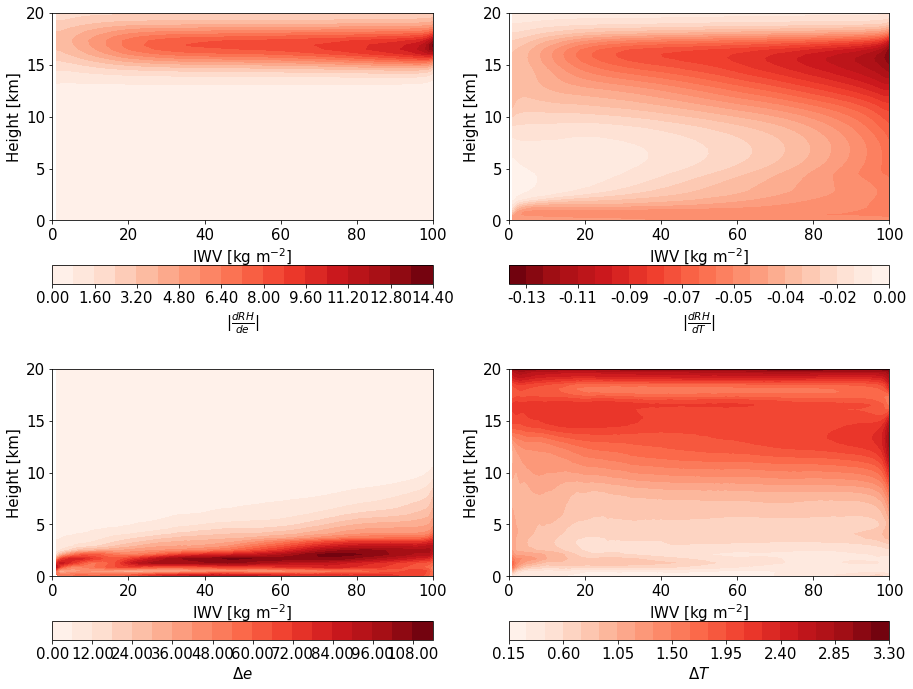

In [337]:
fig, ax = plt.subplots(2, 2, figsize=(15, 12))
Lv = typhon.constants.heat_of_vaporization
Rv = typhon.constants.gas_constant_water_vapor
dRH_de = 1 / ms_perc_series['Es'].mean.T
dRH_dT = -Lv / Rv / ms_perc_series['TEMP'].mean.T ** 2 * ms_perc_series['RH'].mean.T
label = r'$|\frac{dRH}{de}|$'
x_lims = [0, 100]
y_lims = [0, 20]
plots.moisture_space_contourf(fig, ax[0, 0], perc_values, h * 1e-3, dRH_de, 20,\
                              x_lims, y_lims, x_label, y_label, label,\
                              cmap='Reds')
label = r'$|\frac{dRH}{dT}|$'
plots.moisture_space_contourf(fig, ax[0, 1], perc_values, h * 1e-3, dRH_dT, 20,\
                              x_lims, y_lims, x_label, y_label, label,\
                              cmap='Reds_r')
label = r'$\Delta e$'
plots.moisture_space_contourf(fig, ax[1, 0], perc_values, h * 1e-3, ms_perc_series['E'].variability.T, 20,\
                              x_lims, y_lims, x_label, y_label, label,\
                              cmap='Reds')
label = r'$\Delta T$'
plots.moisture_space_contourf(fig, ax[1, 1], perc_values, h * 1e-3, ms_perc_series['TEMP'].variability.T, 20,\
                              x_lims, y_lims, x_label, y_label, label,\
                              cmap='Reds')

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b2eb44ea3c8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


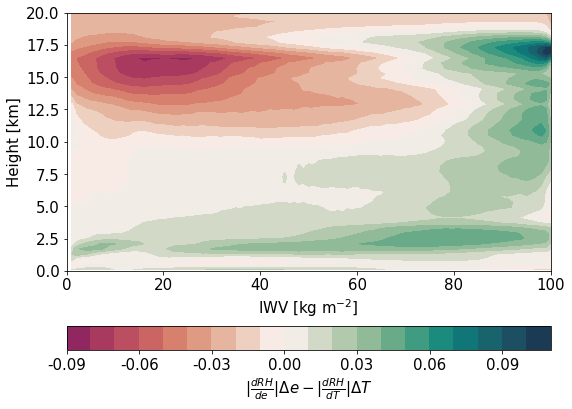

In [338]:
fig, ax = plt.subplots(figsize=(8, 6))

dRH_de_De = dRH_de * ms_perc_series['E'].variability.T

dRH_dT_DT = dRH_dT * ms_perc_series['TEMP'].variability.T
dRH_des_Des = dRH_des * ms_perc_series['Es'].variability.T
label = r'$|\frac{dRH}{de}|\Delta e - |\frac{dRH}{dT}|\Delta T$'
plots.moisture_space_contourf(fig, ax, perc_values, h * 1e-3, np.abs(dRH_de_De) - np.abs(dRH_dT_DT), 20,\
                                  x_lims, y_lims, x_label, y_label, label,\
                                  vmin=-0.12, vmax=0.12,\
                                  cmap='vorticity_r')

plt.tight_layout()

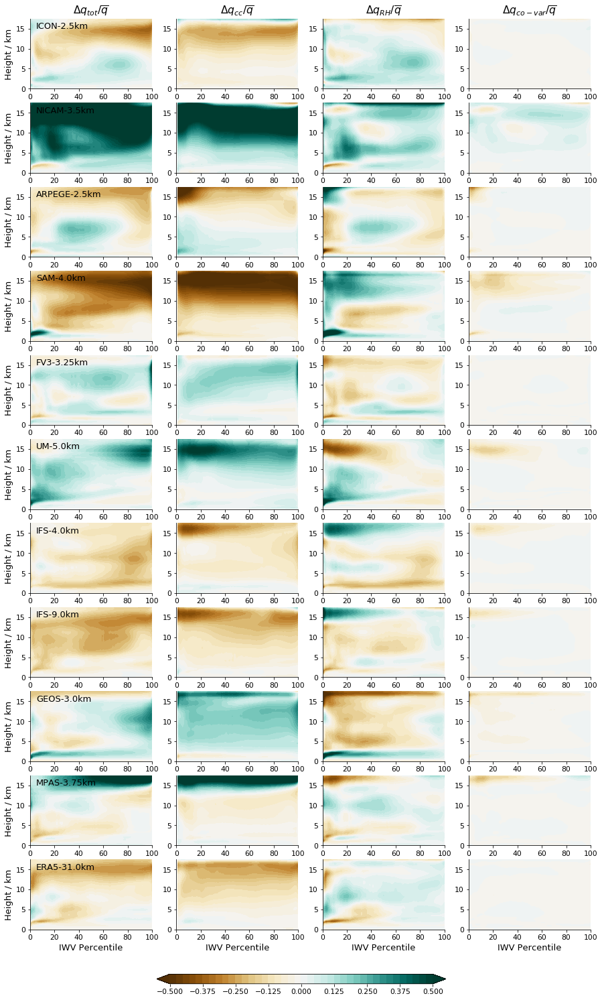

In [47]:
reload(plots)
plt.rcParams.update({'font.size': 13})
fig, ax = plt.subplots(len(exps), 4, figsize=(15, 25))
contours_dq = np.arange(-0.5, 0.501, 0.025)
q_mean = ms_perc_series['QV'].mean
x_label = ''
y_label = ''
dq_tot = {}
dq_cc = {}
dq_rh = {}
dq_cov = {}
for i, exp in enumerate(exps):
    dq_tot[exp] = ms_perc[exp]['QV'].mean - ms_perc_series['QV'].mean
    dq_cc[exp] = ms_perc_series['RH'].mean * (ms_perc[exp]['QS'].mean - ms_perc_series['QS'].mean)
    dq_rh[exp] = ms_perc_series['QS'].mean * (ms_perc[exp]['RH'].mean - ms_perc_series['RH'].mean)
    dq_cov[exp] = (ms_perc[exp]['QS'].mean - ms_perc_series['QS'].mean) * (ms_perc[exp]['RH'].mean - ms_perc_series['RH'].mean)
    
    im = plots.moisture_space_contourf(fig, ax[i, 0], perc_values, h * 1e-3, dq_tot[exp].T / q_mean.T, contours_dq,\
                                  x_lims, y_lims, x_label, y_label, '',
                                  cm_orientation='vertical', cb_extend='both',
                                  cmap='BrBG', cb=False, vmin=contours_dq[0], vmax=contours_dq[-1])
    plots.moisture_space_contourf(fig, ax[i, 1], perc_values, h * 1e-3, dq_cc[exp].T / q_mean.T, contours_dq,\
                                  x_lims, y_lims, x_label, y_label, '',
                                  cm_orientation='vertical', cb_extend='both',
                                  cmap='BrBG', cb=False, vmin=contours_dq[0], vmax=contours_dq[-1])
    plots.moisture_space_contourf(fig, ax[i, 2], perc_values, h * 1e-3, dq_rh[exp].T / q_mean.T, contours_dq,\
                                  x_lims, y_lims, x_label, y_label, '',
                                  cm_orientation='vertical', cb_extend='both',
                                  cmap='BrBG', cb=False, vmin=contours_dq[0], vmax=contours_dq[-1])
    plots.moisture_space_contourf(fig, ax[i, 3], perc_values, h * 1e-3, dq_cov[exp].T / q_mean.T, contours_dq,\
                                  x_lims, y_lims, x_label, y_label, '',
                                  cm_orientation='vertical', cb_extend='both',
                                  cmap='BrBG', cb=False, vmin=contours_dq[0], vmax=contours_dq[-1])
    ax[i, 0].set_ylabel('Height / km')
    ax[i, 0].annotate(exp, (5, 15))
for i in range(4):
    ax[-1, i].set_xlabel('IWV Percentile')
ax[0, 0].set_title('$\Delta q_{tot} / \overline{q}$')
ax[0, 1].set_title('$\Delta q_{cc} / \overline{q}$')
ax[0, 2].set_title('$\Delta q_{RH} / \overline{q}$')
ax[0, 3].set_title('$\Delta q_{co-var} / \overline{q}$')
cb_ax = fig.add_axes([0.3, 0.08, 0.4, 0.008])
fig.colorbar(im, cax=cb_ax, orientation='horizontal')


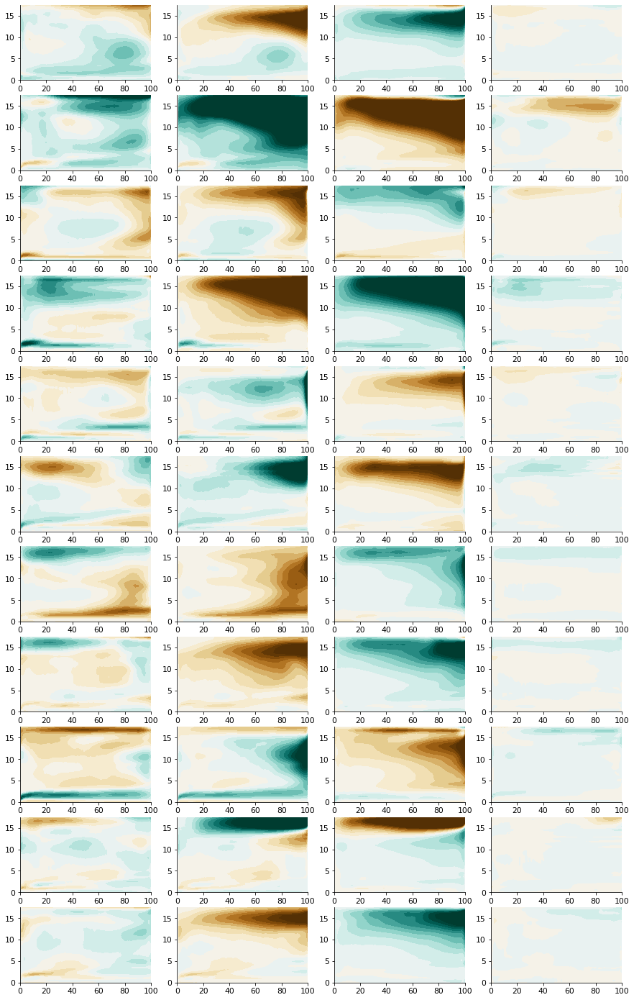

In [58]:
reload(plots)
plt.rcParams.update({'font.size': 13})
fig, ax = plt.subplots(len(exps), 4, figsize=(15, 25))
contours = np.arange(-20, 21, 2.)
q_mean = ms_perc_series['QV'].mean
x_label = ''
y_label = ''
drh_tot = {}
drh_q = {}
drh_qs = {}
drh_cov = {}
for i, exp in enumerate(exps):
    drh_tot[exp] = ms_perc[exp]['RH'].mean - ms_perc_series['RH'].mean
    drh_q[exp] = 1 / ms_perc_series['QS'].mean * (ms_perc[exp]['QV'].mean - ms_perc_series['QV'].mean)
    drh_qs[exp] = -ms_perc_series['QV'].mean / ms_perc_series['QS'].mean **2 * (ms_perc[exp]['QS'].mean - ms_perc_series['QS'].mean)
    drh_cov[exp] = drh_tot[exp] - drh_q[exp] - drh_qs[exp]
    
    im = plots.moisture_space_contourf(fig, ax[i, 0], perc_values, h * 1e-3, drh_tot[exp].T * 1e2, contours,\
                                  x_lims, y_lims, x_label, y_label, '',
                                  cm_orientation='vertical', cb_extend='both',
                                  cmap='BrBG', cb=False, vmin=contours[0], vmax=contours[-1])
    plots.moisture_space_contourf(fig, ax[i, 1], perc_values, h * 1e-3, drh_q[exp].T * 1e2, contours,\
                              x_lims, y_lims, x_label, y_label, '',
                              cm_orientation='vertical', cb_extend='both',
                              cmap='BrBG', cb=False, vmin=contours[0], vmax=contours[-1])
    plots.moisture_space_contourf(fig, ax[i, 2], perc_values, h * 1e-3, drh_qs[exp].T * 1e2, contours,\
                              x_lims, y_lims, x_label, y_label, '',
                              cm_orientation='vertical', cb_extend='both',
                              cmap='BrBG', cb=False, vmin=contours[0], vmax=contours[-1])
    plots.moisture_space_contourf(fig, ax[i, 3], perc_values, h * 1e-3, drh_cov[exp].T * 1e2, contours,\
                              x_lims, y_lims, x_label, y_label, '',
                              cm_orientation='vertical', cb_extend='both',
                              cmap='BrBG', cb=False, vmin=contours[0], vmax=contours[-1])


### Correlations

In [348]:
num_points = num_percs * len(h)
dq_tot_array = np.ones((num_points, len(exps))) * np.nan
dq_cc_array = np.ones((num_points, len(exps))) * np.nan
dq_rh_array = np.ones((num_points, len(exps))) * np.nan
corr_tot_cc = np.ones(num_points) * np.nan
corr_tot_rh = np.ones(num_points) * np.nan
for n in range(num_points):
    dq_tot_array[n, :] = np.array([dq_tot[exp].ravel()[n] for exp in exps])
    dq_cc_array[n, :] = np.array([dq_cc[exp].ravel()[n] for exp in exps])
    dq_rh_array[n, :] = np.array([dq_rh[exp].ravel()[n] for exp in exps])
    
    corr_tot_cc[n], p = pearsonr(dq_tot_array[n], dq_cc_array[n])
    corr_tot_rh[n], p = pearsonr(dq_tot_array[n], dq_rh_array[n])
    
corr_tot_cc = np.reshape(corr_tot_cc, (num_percs, len(h)))
corr_tot_rh = np.reshape(corr_tot_rh, (num_percs, len(h)))

In [100]:
corr_tot_cc.shape

(100, 45)

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b56b8163710>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


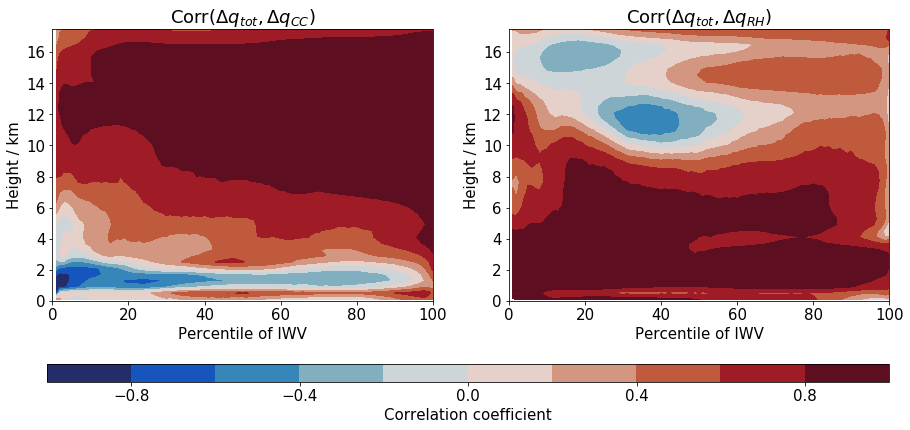

In [354]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
contours = np.arange(-1, 1.1, 0.2)
y_label = 'Height / km'
x_label = 'Percentile of IWV'
im_cc = plots.moisture_space_contourf(fig, ax[0], perc_values, h * 1e-3, corr_tot_cc.T, contours,\
                                  x_lims, y_lims, x_label, y_label, '',
                                  cm_orientation='vertical', cb_extend='neither',
                                  cmap='difference', cb=False, vmin=-1, vmax=1)
ax[0].set_title(r'Corr($\Delta q_{tot}, \Delta q_{CC}$)')
im_rh = plots.moisture_space_contourf(fig, ax[1], perc_values, h * 1e-3, corr_tot_rh.T, contours,\
                                  x_lims, y_lims, x_label, y_label, '',
                                  cm_orientation='vertical', cb_extend='neither',
                                  cmap='difference', cb=False, vmin=-1, vmax=1)
ax[1].set_title(r'Corr($\Delta q_{tot}, \Delta q_{RH}$)')

cb_ax = fig.add_axes([0.12, -0.1, 0.78, 0.05])
fig.colorbar(im_cc, cax=cb_ax, orientation='horizontal', label='Correlation coefficient')

# Profiles in Percentiles

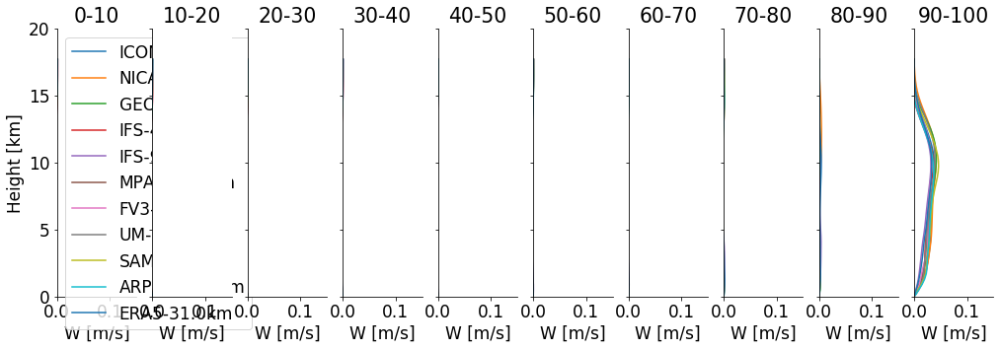

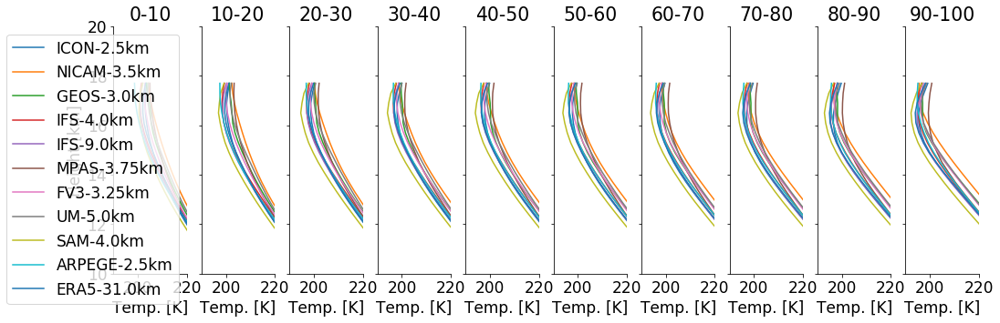

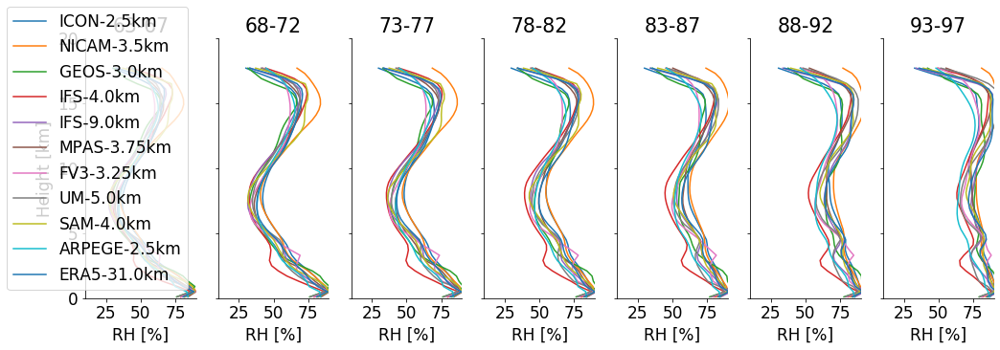

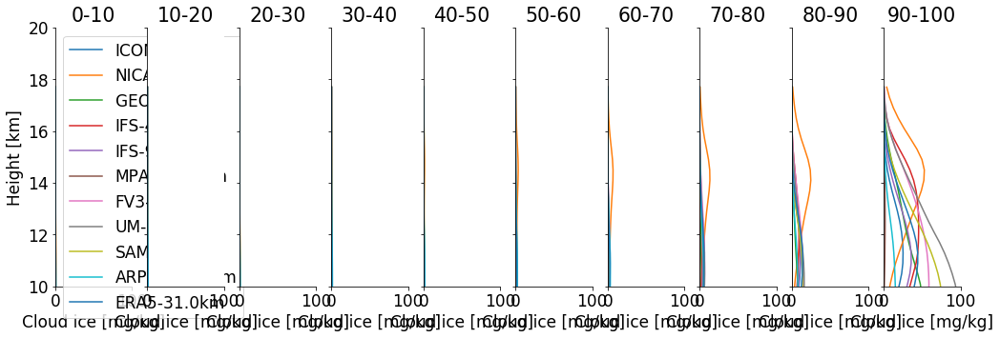

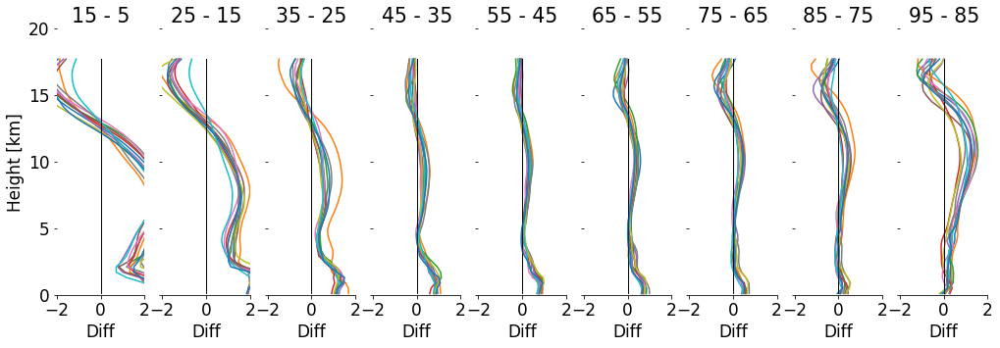

In [221]:
reload(plots)
plots.percentile_profiles(5, 100, 10, ms_perc_series['W'], 1, [0, 0.15], 'W [m/s]', [0, 20], 'Height [km]')
plots.percentile_profiles(5, 95, 10, ms_perc_series['TEMP'], 1, [190, 220], 'Temp. [K]', [10, 20], 'Height [km]')
plots.percentile_profiles(65, 95, 5, ms_perc_series['RH'], 1e2, [10, 90], 'RH [%]', [0, 20], 'Height [km]')
plots.percentile_profiles(5, 95, 10, ms_perc_series['QI'], 1e6, [0, 100], 'Cloud ice [mg/kg]', [10, 20], 'Height [km]')
plots.diff_percentile_profiles(5, 95, 10, ms_perc_series['TEMP'], 1, [-2, 2], 'Percentile of IWV', [0, 20], 'Height [km]')

# Variability

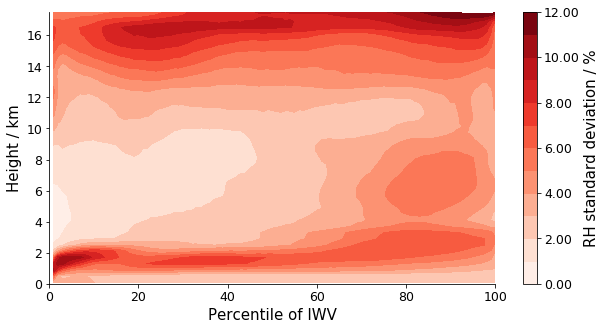

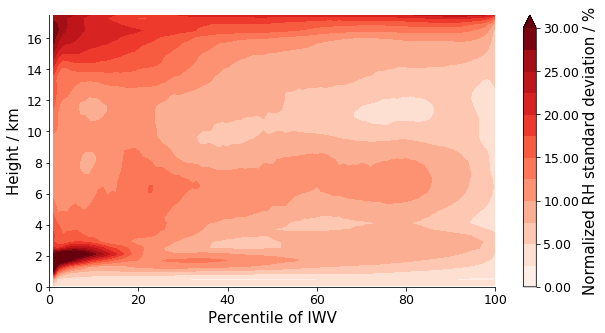

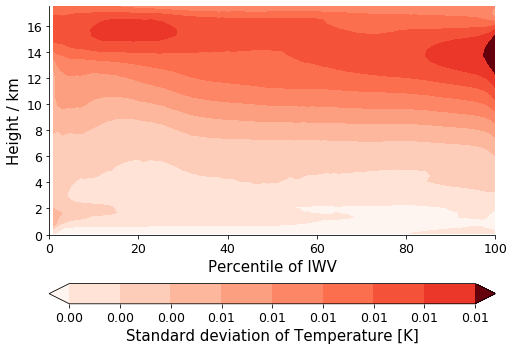

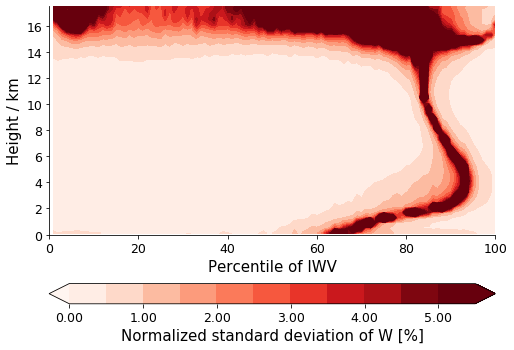

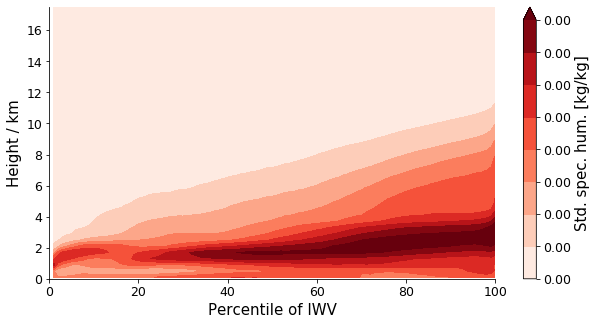

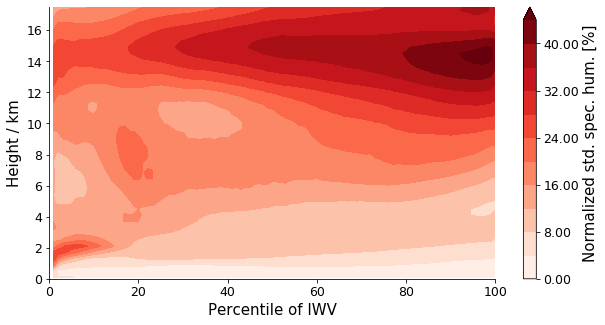

In [49]:
plt.rcParams.update({'font.size': 15})
reload(plots)
x_lims = [0, 100]
y_lims = [0, 17.5]
y_label = 'Height / km'
fig, ax = plt.subplots(figsize=(10, 5))
plots.moisture_space_contourf(fig, ax, perc_values, h * 1e-3, ms_perc_series['RH'].variability.T * 1e2, np.arange(0, 13),\
                              x_lims, y_lims, 'Percentile of IWV', y_label, 'RH standard deviation / %',\
                              cmap='Reds', cm_orientation='vertical', cb_extend='neither', vmin=0, vmax=12)
plt.savefig('plots_seminar/RH_standard_deviation.pdf', dpi=400)

fig, ax = plt.subplots(figsize=(10, 5))
plots.moisture_space_contourf(fig, ax, perc_values, h * 1e-3, ms_perc_series['RH'].variability.T / ms_perc_series['RH'].mean.T * 1e2, np.arange(0, 31, 2.5),\
                              x_lims, y_lims, 'Percentile of IWV', y_label, 'Normalized RH standard deviation / %',\
                              cmap='Reds', cm_orientation='vertical', cb_extend='max', cb_ticks=np.arange(0, 40, 5), vmin=0, vmax=30)
plt.savefig('plots_seminar/RH_standard_deviation_normalized.pdf', dpi=400)

fig, ax = plt.subplots(figsize=(8, 6))
plots.moisture_space_contourf(fig, ax, perc_values, h * 1e-3, ms_perc_series['TEMP'].variability.T / ms_perc_series['TEMP'].mean.T, 12,\
                              x_lims, y_lims, 'Percentile of IWV', y_label, 'Standard deviation of Temperature [K]',\
                              cmap='Reds', vmin=0, vmax=0.02)

fig, ax = plt.subplots(figsize=(8, 6))
plots.moisture_space_contourf(fig, ax, perc_values, h * 1e-3, ms_perc_series['W'].variability.T / np.abs(ms_perc_series['W'].mean.T), np.arange(0, 6, 0.5),\
                              x_lims, y_lims, 'Percentile of IWV', y_label, 'Normalized standard deviation of W [%]',\
                              cmap='Reds', vmin=0, vmax=5)

fig, ax = plt.subplots(figsize=(10, 5))
plots.moisture_space_contourf(fig, ax, perc_values, h * 1e-3, ms_perc_series['QV'].variability.T, 10,\
                              x_lims, y_lims, 'Percentile of IWV', y_label, 'Std. spec. hum. [kg/kg]',\
                              cmap='Reds', cm_orientation='vertical', cb_extend='max')

fig, ax = plt.subplots(figsize=(10, 5))
plots.moisture_space_contourf(fig, ax, perc_values, h * 1e-3, ms_perc_series['QV'].variability.T / ms_perc_series['QV'].mean.T * 1e2, 10,\
                              x_lims, y_lims, 'Percentile of IWV', y_label, 'Normalized std. spec. hum. [%]',\
                              cmap='Reds', cm_orientation='vertical', cb_extend='max')

## Variability in each bin

In [316]:
ms_perc[m]['W'].profile_stats.std.T.shape

(200, 100)

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b56bb325278>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


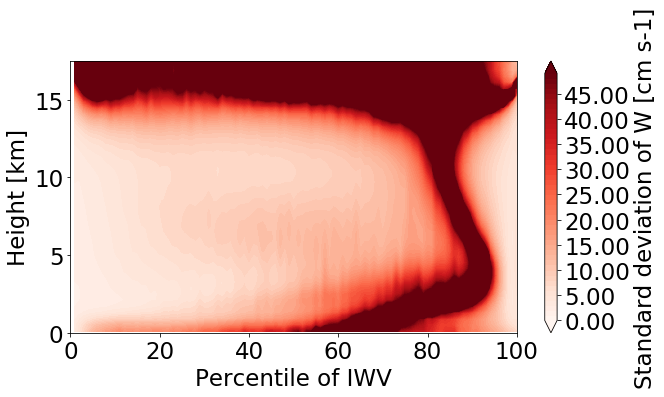

In [333]:
plt.rcParams.update({'font.size': 23})
reload(plots)
m = 'IFS-4.0km'
x_lims = [0, 100]
y_lims = [0, 17.5]
y_label = 'Height [km]'
fig, ax = plt.subplots(figsize=(10, 5))
contours = np.arange(0, 50, 1)
plots.moisture_space_contourf(fig, ax, perc_values, h * 1e-3, ms_perc[m]['W'].profile_stats.std.T / np.abs(ms_perc_series['W'].mean.T), contours,\
                              x_lims, y_lims, 'Percentile of IWV', y_label, 'Standard deviation of W [cm s-1]',\
                              cmap='Reds', cm_orientation='vertical', cb_extend='both', vmin=contours[0], vmax=contours[-1])



In [503]:
35 / 10000

0.0035

## Difference between two models

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b8293051ac8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b82b586cc50>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


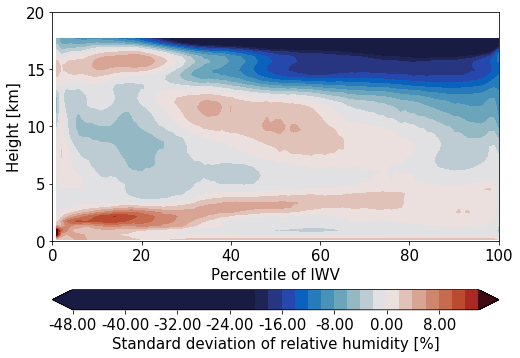

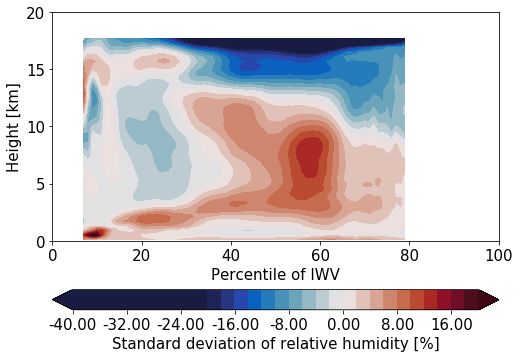

In [633]:
plt.rcParams.update({'font.size': 15})
model_1 = 'ICON-2.5km'
model_2 = 'NICAM-3.5km'
x_lims = [0, 100]
y_lims = [0, 20]
y_label = 'Height [km]'
fig, ax = plt.subplots(figsize=(8, 6))
plots.moisture_space_contourf(fig, ax, perc_values, h * 1e-3, (ms_perc[model_1]['RH'].mean.T - ms_perc[model_2]['RH'].mean.T) * 1e2, 40,\
                              x_lims, y_lims, 'Percentile of IWV', y_label, 'Standard deviation of relative humidity [%]',\
                              cmap='difference', vmin=-20, vmax=20)
fig, ax = plt.subplots(figsize=(8, 6))
plots.moisture_space_contourf(fig, ax, perc_values, h * 1e-3, (ms_bins[model_1]['RH'].mean.T - ms_bins[model_2]['RH'].mean.T) * 1e2, 40,\
                              x_lims, y_lims, 'Percentile of IWV', y_label, 'Standard deviation of relative humidity [%]',\
                              cmap='difference', vmin=-20, vmax=20)

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b346a707860>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


0.4710486880649678


DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b346ad3be48>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b346a61beb8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b346b73a780>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b346b746c50>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


0.4710486880649678
0.4710486880649678
0.4710486880649678


DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b346a594c88>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b346a5c2908>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b3465cd1b00>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


0.4710486880649678
0.4710486880649678
0.4710486880649678


DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b346a7d4048>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


0.4710486880649678
0.4710486880649678


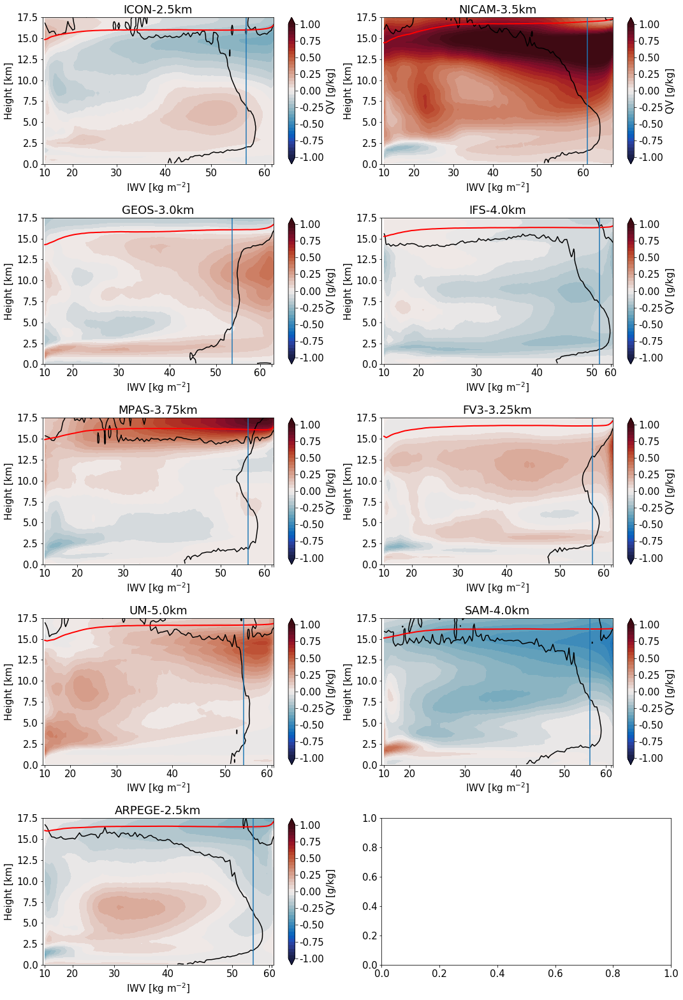

In [28]:
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 22))
tick_labels = np.arange(10, 81, 10)
ax = ax.ravel()

plt.rcParams.update({'font.size': 15})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = plots.axis_labels('IWV')
y_label = 'Height [km]'

lower_layer_bnd = 100
upper_layer_bnd = 12500
mean_up = {}
contours = np.arange(-1, 1.05, 0.05)
for m in exps:
    mean_up[m] = ms_perc[m]['Wint'].mean

for i, exp in enumerate(exps):
    plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, (ms_perc[exp]['QV'].mean.T - ms_perc_series['QV'].mean.T) / ms_perc_series['QV'].mean.T, contours,\
                                  x_lims, y_lims, x_label, y_label, 'QV [g/kg]', percentiles[exp], tick_labels,
                                  cm_orientation='vertical',\
                                  cmap='difference', vmin=-1, vmax=1)
    print(np.mean(ms_perc_series['RH'].mean))
    cs = plots.moisture_space_contour(fig, ax[i], perc_values, h * 1e-3, ms_perc[exp]['W'].mean.T,\
                             [0.], x_lims, y_lims, x_label, y_label, 'k')
    plots.moisture_space_line(ax[i], perc_values, ms_perc[exp]['H_tropo'].mean * 1e-3,\
                                  x_lims, y_lims, x_label, y_label, lw=2, label=m, color='r')
    w0 = np.argmin(np.abs(mean_up[exp]))
    perc_w0 = perc_values[w0]
    ax[i].plot([perc_w0, perc_w0], y_lims)
    ax[i].set_title(exp)
plt.tight_layout()

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ba994141898>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ba999a9f6a0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ba9292c25c0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ba98f5c5470>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ba994d65550>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ba98ede2d68>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ba98ecf1f60>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

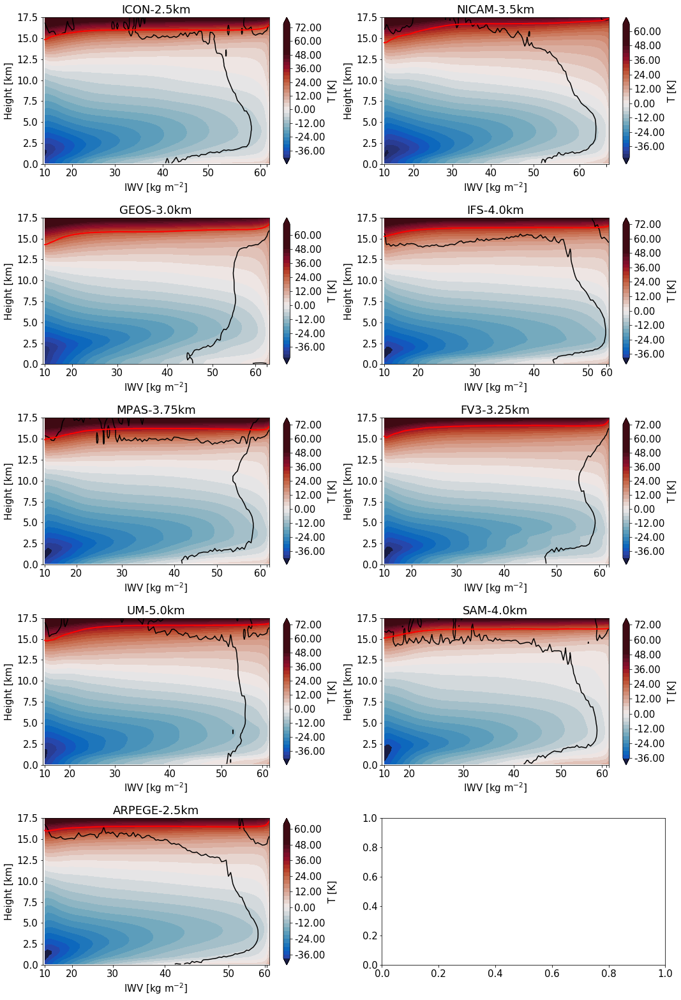

In [327]:
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 22))
tick_labels = np.arange(10, 81, 10)
ax = ax.ravel()

plt.rcParams.update({'font.size': 15})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = plots.axis_labels('IWV')
y_label = 'Height [km]'

for i, exp in enumerate(exps):
    plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, (ms_perc[exp]['THETA_E'].mean.T - ms_perc[exp]['THETA_E'].area_mean()), 40,\
                                  x_lims, y_lims, x_label, y_label, 'T [K]', percentiles[exp], tick_labels,
                                  cm_orientation='vertical',\
                                  cmap='difference', vmin=-50, vmax=50)
    cs = plots.moisture_space_contour(fig, ax[i], perc_values, h * 1e-3, ms_perc[exp]['W'].mean.T,\
                             [0.], x_lims, y_lims, x_label, y_label, 'k')
    plots.moisture_space_line(ax[i], perc_values, ms_perc[exp]['H_tropo'].mean * 1e-3,\
                                  x_lims, y_lims, x_label, y_label, lw=2, label=m, color='r')
    ax[i].set_title(exp)
plt.tight_layout()

# Mass-weighted mean vertical velocity

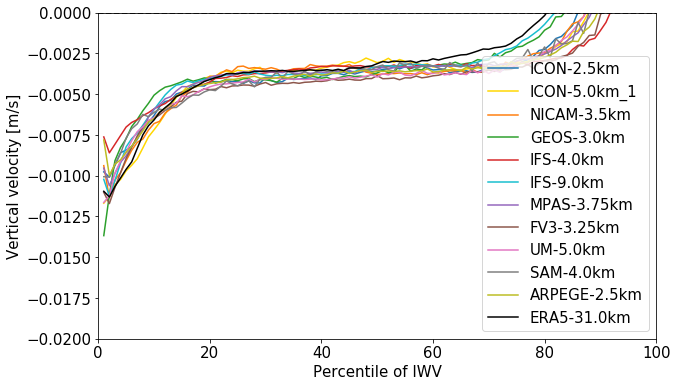

In [390]:
lower_layer_bnd = 1000
upper_layer_bnd = 12500
fig, ax = plt.subplots(figsize=(10, 6))
for m in exps:
    #ax.plot(perc_values, ms_perc[m]['Wint'].mean)
    ax.plot(perc_values, ms_perc[m]['W'].vertical_mean(lower_layer_bnd, upper_layer_bnd), label=m, color=plots.DYAMOND_colors(m))
ax.plot([0, 100], [0, 0], '--', color='k')
ax.set_xlim(0, 100)
ax.set_ylim(-0.02, 0)
ax.set_xlabel('Percentile of IWV')
ax.set_ylabel('Vertical velocity [m/s]')
ax.legend()

ICON-2.5km
0.87
ICON-5.0km_1
0.89
NICAM-3.5km
0.89
GEOS-3.0km
0.81
IFS-4.0km
0.94
IFS-9.0km
0.79
MPAS-3.75km
0.89
FV3-3.25km
0.9
UM-5.0km
0.87
SAM-4.0km
0.89
ARPEGE-2.5km
0.9
ERA5-31.0km
0.78


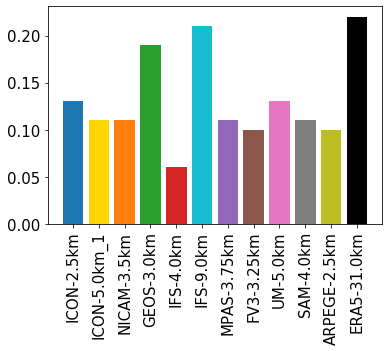

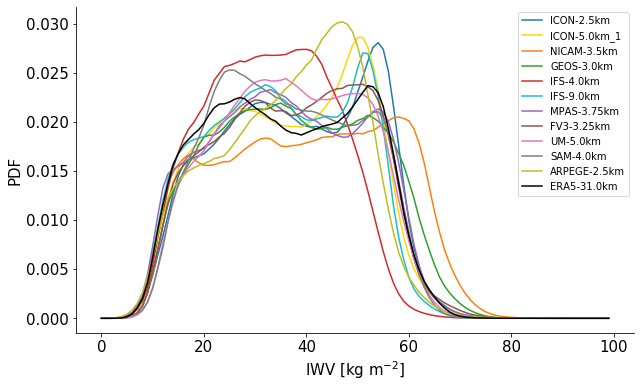

In [394]:
fig, ax = plt.subplots()
frac_up = {}
for m in exps:
    print(m)
    mean_up = ms_perc[m]['Wint'].mean
    frac_up[m] = np.sum(mean_up > 0) / len(perc_values)
    print(1 - frac_up[m])
height = [frac_up[m] for m in exps]
c = [plots.DYAMOND_colors(m) for m in exps]
ax.bar(np.arange(len(height)), height, width=0.8, bottom=None, color=c)
ax.set_xticks(np.arange(len(height)))
ax.set_xticklabels(exps, rotation=90)

fig, ax = plt.subplots(figsize=(10, 6))
for m in exps:
    ax.plot(ms_bins[m]['TEMP'].profile_pdf / num_profiles, label=m, color=plots.DYAMOND_colors(m))
ax.legend(fontsize=10)
ax.set_xlabel('IWV [kg m$^{-2}$]')
ax.set_ylabel('PDF')
seaborn.despine()
#ax.set_ylim(0, 50000)
#ax.set_xlim(50, 80)

# Streamfunction

In [205]:
streamfunction[m].shape

(101, 45)

In [73]:
reload(utils)
streamfunction = {}
x_velocity = {}
z_velocity = {}
contours_w = np.arange(-0.05, 0.050001, 0.001)
for m in exps:
    streamfunction[m] = np.zeros((num_percs+1, len(h)))
    density = utils.calc_density_moist_air(
        ms_perc[m]['PRES'].mean,
        ms_perc[m]['TEMP'].mean,
        ms_perc[m]['QV'].mean
    )
    density = np.vstack((density[0], density))
#     for i in range(1, num_percs):
#         streamfunction[m][i] = streamfunction[m][i-1] + density[i] * ms_perc[m]['W'].mean[i]
#         t = density * ms_perc[m]['QV'].mean * ms_perc[m]['W'].mean 
#         profile_stats = moisture_space.ProfileStats('QV_Transport', t)
#         vertical_moisture_transport[m] = moisture_space.PercMoistureSpace(m, profile_stats, ms_perc[m]['PRES'].bins, ms_perc[m]['PRES'].levels)
    for i in range(num_percs, 0, -1):
        streamfunction[m][i-1] = streamfunction[m][i] + density[i] * ms_perc[m]['W'].mean[i-1]

    x_velocity[m] = np.diff(streamfunction[m], axis=1) / density[:, :-1]
    z_velocity[m] = -np.diff(streamfunction[m], axis=0) / density[1:]

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b56b1bd0828>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b56b1d299e8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


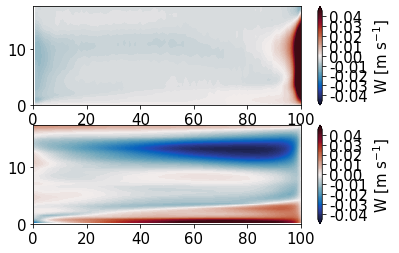

In [74]:
m = 'FV3-3.25km'
fig, ax = plt.subplots(2, 1)
h_half = h[:-1] + np.diff(h) * 0.5
x_streamfunction = np.arange(0.5, 101.5, 1)
plots.moisture_space_contourf(fig, ax[0], perc_values, h * 1e-3, z_velocity[m].T,\
                                 contours_w, x_lims, y_lims, x_label, y_label, r'W [m s$^{-1}$]', cm_orientation='vertical', cmap='difference')
plots.moisture_space_contourf(fig, ax[1], x_streamfunction, h_half * 1e-3, x_velocity[m].T,\
                                 contours_w, x_lims, y_lims, x_label, y_label, r'W [m s$^{-1}$]', cm_orientation='vertical', cmap='difference')

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f1fae7f0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f218c438>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f23667f0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f2547630>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f271d240>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f28ed8d0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7f2abee80>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

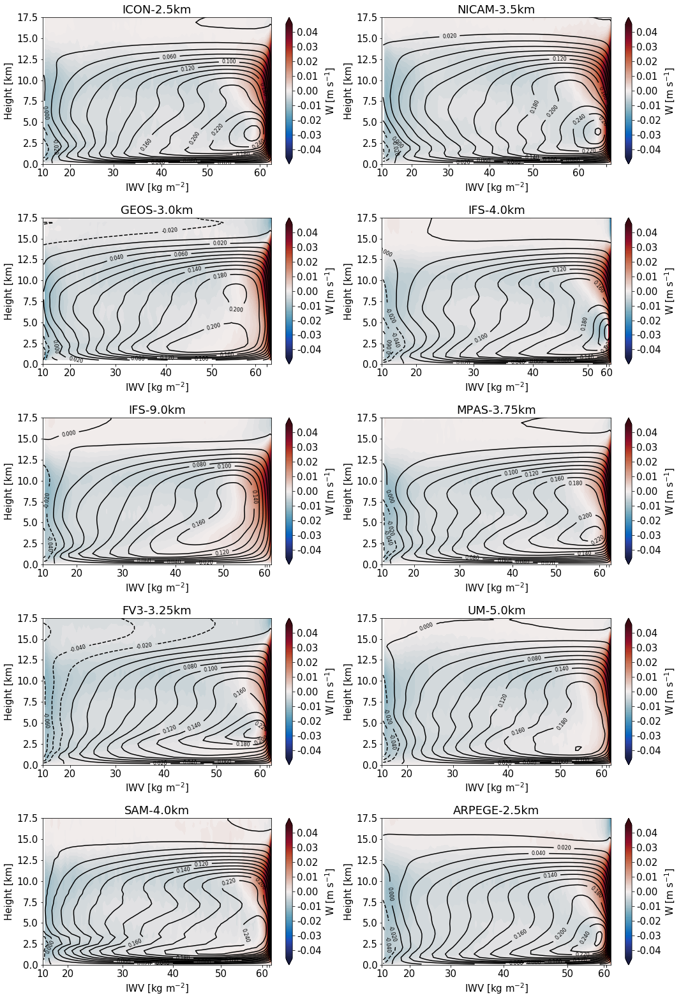

In [198]:
reload(plots)
plt.rcParams.update({'font.size': 15})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = plots.axis_labels('IWV')
y_label = 'Height [km]'
tick_labels = np.arange(10, 81, 10)
contours = np.arange(-0.4, 0.4, 0.02)
contours_w = np.arange(-0.05, 0.050001, 0.001)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 22))
ax = ax.ravel()
x_streamfunction = np.arange(0.5, 101.5, 1)
for i, m in enumerate(exps):    
    cs = plots.moisture_space_contour(fig, ax[i], x_streamfunction, h * 1e-3, streamfunction[m].T,\
                                 contours, x_lims, y_lims, x_label, y_label, 'k', percentiles[m], tick_labels)
    #cs = plots.moisture_space_contour(fig, ax[i], ms_perc[m]['IWV'].mean, h * 1e-3, streamfunction[m].T,\
    #                             contours, x_lims, y_lims, x_label, y_label, 'k')
    ax[i].clabel(cs, fontsize=8)
    cs = plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, ms_perc[m]['W'].mean.T,\
                                 contours_w, x_lims, y_lims, x_label, y_label, r'W [m s$^{-1}$]', cm_orientation='vertical', cmap='difference')

    ax[i].set_title(m)
plt.tight_layout()



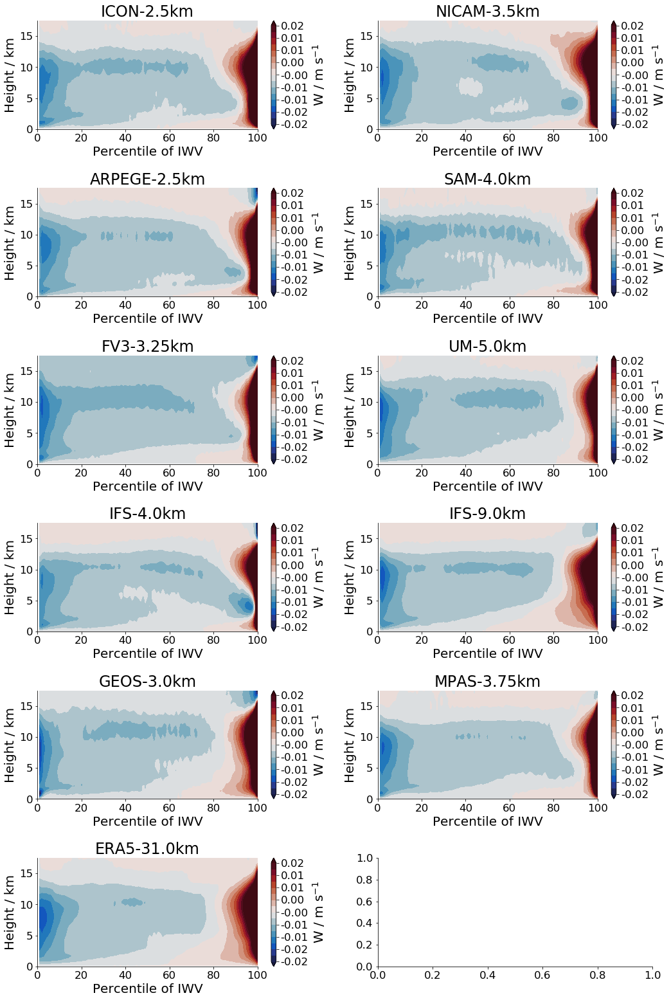

In [32]:
reload(plots)
plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'
y_label = 'Height / km'
tick_labels = np.arange(10, 81, 10)
contours = np.arange(-0.4, 0.4, 0.04)
contours_w = np.arange(-0.02, 0.020001, 0.0025)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 22))
ax = ax.ravel()
for i, m in enumerate(exps):    
    #cs = plots.moisture_space_contour(fig, ax[i], perc_values, h * 1e-3, streamfunction[m].T,\
    #                             contours, x_lims, y_lims, x_label, y_label, 'k', percentiles[m], tick_labels)
    #cs = plots.moisture_space_contour(fig, ax[i], perc_values, h * 1e-3, streamfunction[m].T,\
    #                             contours, x_lims, y_lims, x_label, y_label, 'k')
    #ax[i].clabel(cs)
    cs = plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, ms_perc[m]['W'].mean.T,\
                                 contours_w, x_lims, y_lims, x_label, y_label, r'W / m s$^{-1}$', cm_orientation='vertical', cmap='difference')

    ax[i].set_title(m)
plt.tight_layout()
plt.savefig('plots_seminar/vertical_velocity_moisture_space.pdf', dpi=450)

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2ad7ea185438>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


KeyError: 'ICON-5.0km_1'

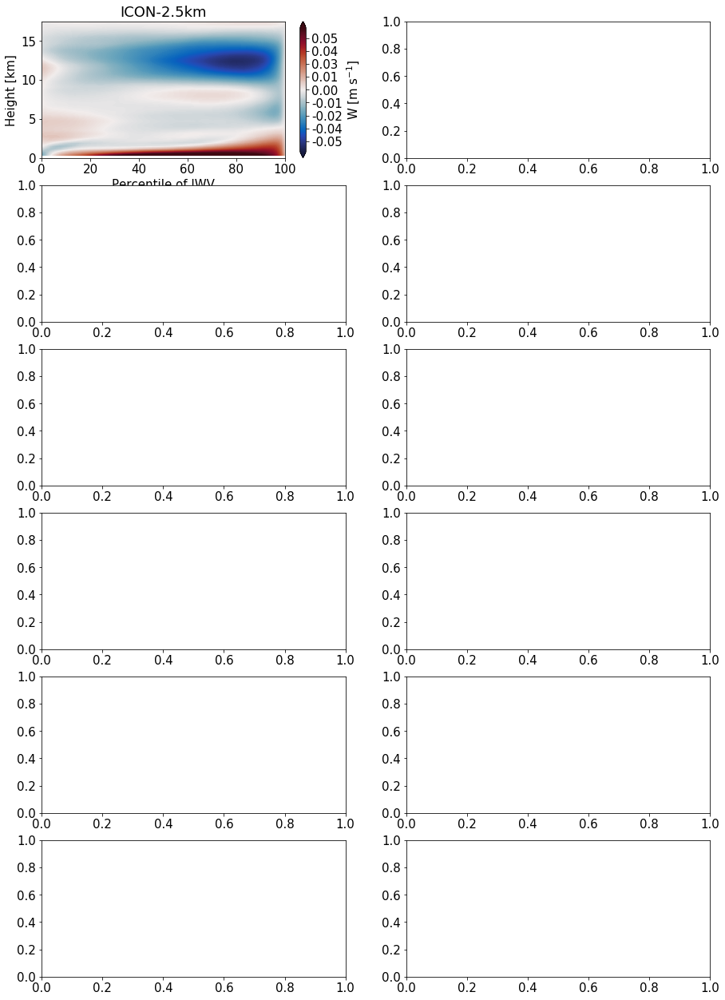

In [395]:
reload(plots)
plt.rcParams.update({'font.size': 15})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'
tick_labels = np.arange(10, 81, 10)
contours = np.arange(-0.4, 0.4, 0.04)
contours_w = np.arange(-0.06, 0.060001, 0.0005)
h_half = h[:-1] + np.diff(h) * 0.5
x_streamfunction = np.arange(0.5, 101.5, 1)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 22))
ax = ax.ravel()
for i, m in enumerate(exps):    

    cs = plots.moisture_space_contourf(fig, ax[i], x_streamfunction, h_half * 1e-3, x_velocity[m].T,\
                                 contours_w, x_lims, y_lims, x_label, y_label, r'W [m s$^{-1}$]', cm_orientation='vertical', cmap='difference')

    ax[i].set_title(m)
plt.tight_layout()

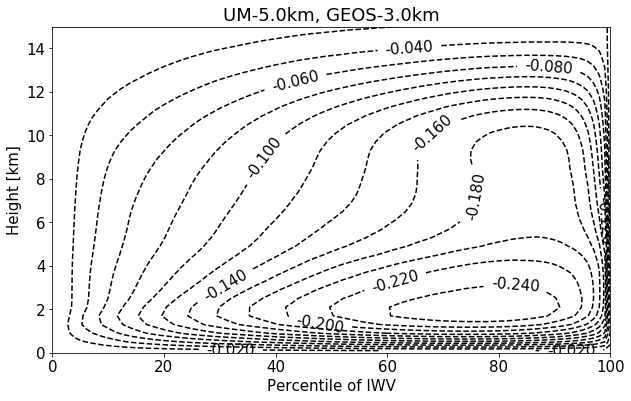

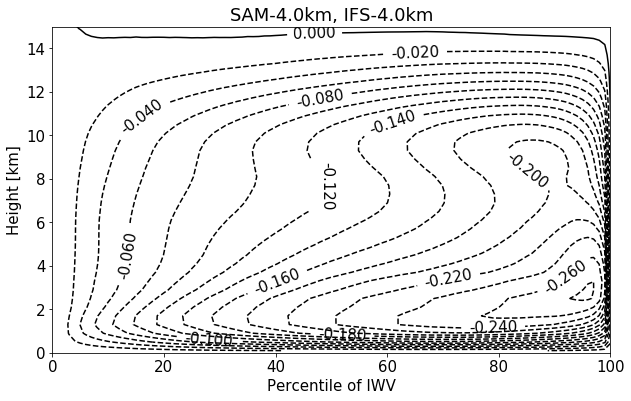

In [28]:
groups = [
    ['UM-5.0km', 'GEOS-3.0km'],
    ['SAM-4.0km', 'IFS-4.0km']
]
mean_streamfunctions = []
for group in groups:
    num_models = len(group)
    sum_streamfunction = np.zeros((num_percs, len(h)))
    for m in group:
        sum_streamfunction += streamfunction[m]
    mean_streamfunctions.append(sum_streamfunction / num_models)
    
x_lims = [0, 100]
y_lims = [0, 15]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'

for g in range(len(groups)):
    fig, ax = plt.subplots(figsize=(10, 6))
    cs = plots.moisture_space_contour(fig, ax, perc_values, h * 1e-3, mean_streamfunctions[g].T,\
                                 contours, x_lims, y_lims, x_label, y_label, 'k')
    ax.clabel(cs)
    ax.set_title(', '.join(groups[g]))
    ax.set_xlim(0, 100)

In [52]:
density[60]

array([1.14973167, 1.10762074, 1.06592071, 1.02536603, 0.98590164,
       0.9475186 , 0.91043518, 0.87466957, 0.84033574, 0.80715826,
       0.77505015, 0.74393347, 0.71351283, 0.68376857, 0.65543207,
       0.62836654, 0.60244449, 0.57755866, 0.55362467, 0.53058258,
       0.50840382, 0.48708045, 0.46667651, 0.44711741, 0.42828175,
       0.41012747, 0.39262503, 0.37573621, 0.35941185, 0.34361009,
       0.32827652, 0.31337766, 0.29890315, 0.28484232, 0.27115116,
       0.25777576, 0.2446579 , 0.23175511, 0.21909351, 0.20660571,
       0.19426748, 0.18210318, 0.17019834, 0.15878156, 0.14773657])

NameError: name 'streamfunction_iwv' is not defined

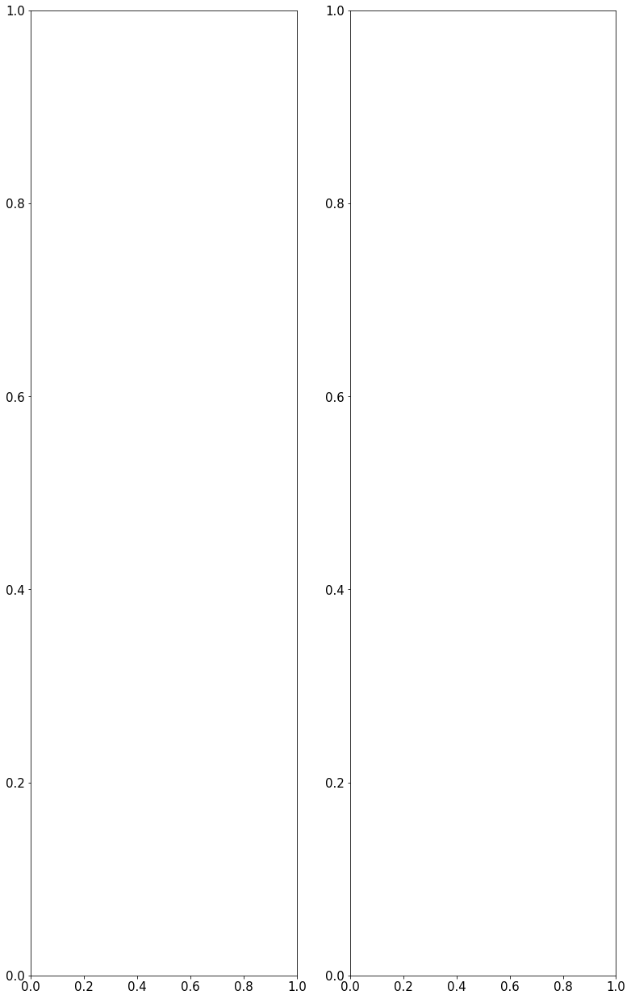

In [102]:
reload(moisture_space)
x_lims = [5, 75]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'
tick_labels = np.arange(10, 81, 10)
contours = np.arange(-0.4, 0.4, 0.02)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(13, 22))
ax = ax.ravel()
for i, m in enumerate(exps):    
    cs = plots.moisture_space_contour(fig, ax[i], ms_bins[m]['IWV'].mean, h * 1e-3, streamfunction_iwv[m].T,\
                                 contours, x_lims, y_lims, x_label, y_label, 'k', percentiles[m], tick_labels)
#     plots.moisture_space_contourf(fig, ax, perc_values, h * 1e-3, perc_mean_interp[m]['RH'] * 1e2, 10,\
#                                   x_lims, y_lims, x_label, y_label, 'Relative humidity [%]',\
#                                   cmap='speed', alpha=0.5, vmin=0, vmax=100)
    ax[i].clabel(cs)
    ax[i].set_title(m)
plt.tight_layout()

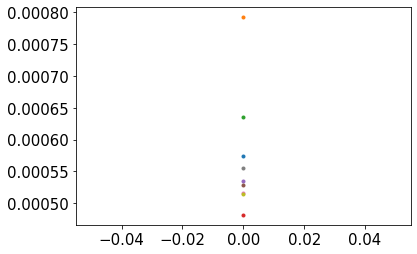

In [397]:

x_lims = [0, 100]
y_lims = [0, 20]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'
contours = np.arange(-1.8, 1.9, 0.1)
fig, ax = plt.subplots()
for i, m in enumerate(exps):
#    fig, ax = plt.subplots()
#    plots.moisture_space_contourf(fig, ax, perc_values, h * 1e-3, vertical_moisture_transport[m].mean.T * 1e3, contours,\
#                      x_lims, y_lims, x_label, y_label, 'Standard deviation of relative humidity [%]',\
#                      cmap='difference')
#    plots.moisture_space_line(ax, perc_values, vertical_moisture_transport[m].vertical_mean(4000, 6000) * 1e3, [80, 101], [-0.1, 1.5], x_label, y_label)
#    ax.set_title(m)
    t = vertical_moisture_transport[m].vertical_mean(5000, 10000)
    percs_up = t >= 0
    percs_down = t < 0
    t_up = np.sum(t[percs_up])
    t_down = np.sum(t[percs_down])
    ax.plot(t_up, '.', color=colors[m])

# Testing Hypothetis for inter-model variability

## RH EOF0

Plot fraction of profiles with a positive vertical velocity between 4 and 6 km against EOF0

In [398]:
reload(plots)
plt.rcParams.update({'font.size': 15})
lower_layer_bnd = 100
upper_layer_bnd = 10000
boundary_lev = 12000
frac_up = {}
w_up = {}
mean_w_up = {}
mean_w_down = {}
temp_up = {}

for m in exps:
    mean_w = ms_perc[m]['W'].vertical_mean(lower_layer_bnd, upper_layer_bnd)
    mean_up = ms_perc[m]['Wint'].mean
    frac_up[m] = np.sum(mean_up > 0) / len(perc_values)
    w_up[m] = np.mean(mean_up[mean_up > 0])
    mean_w_up[m] = np.mean(mean_w[mean_up > 0])
    mean_w_down[m] = np.mean(mean_w[mean_up < 0])

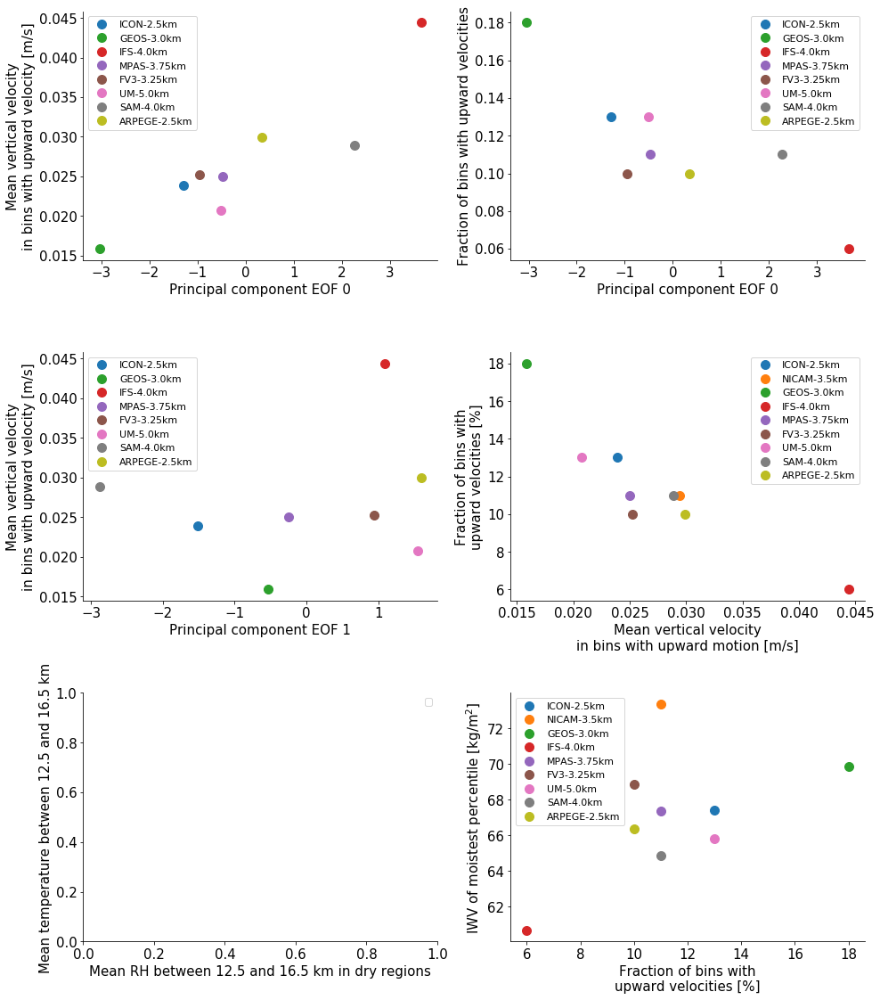

In [710]:
    
fig, ax = plt.subplots(3, 2, figsize=(14, 16))
ax = ax.ravel()
for i, m in enumerate(models_variability):
    mean_up = ms_perc[m]['Wint'].mean
    bin_start = np.where(mean_up > 0)[0][0]
    bin_end = np.where(mean_up > 0)[0][-1]
    ax[0].plot(expansion_coeffs['RH'][0][i], mean_w_up[m], '.', markersize=20, color=colors[m], label=m)
    ax[1].plot(expansion_coeffs['RH'][0][i], frac_up[m], '.', markersize=20, color=colors[m], label=m)
    ax[2].plot(expansion_coeffs['RH'][1][i], mean_w_up[m], '.', markersize=20, color=colors[m], label=m)
    #ax[4].plot(expansion_coeffs['RH'][0][i], ms_perc[m]['TEMP'].area_mean(lower_bnd=12000, upper_bnd=15000), '.', markersize=20, color=colors[m], label=m)
    #ax[5].plot(expansion_coeffs['RH'][0][i], ms_perc[m]['IWV'].mean[-1], '.', markersize=20, color=colors[m], label=m)
    seaborn.despine()
for i, m in enumerate(exps):
    #ax[1].plot(ms_perc[m]['RH'].area_mean(lower_bnd=boundary_lev, upper_bnd=18000) /\
    #           ms_perc[m]['RH'].area_mean(lower_bnd=None, upper_bnd=boundary_lev),\
    #           mean_w_up[m] * 1e2, '.', markersize=20, color=colors[m], label=m)
    ax[3].plot(mean_w_up[m], frac_up[m] * 1e2, '.', markersize=20, color=colors[m], label=m)
    #ax[4].plot(ms_perc[m]['RH'].area_mean(bin_start=0, bin_end=50, lower_bnd=12500, upper_bnd=16500), ms_perc[m]['TEMP'].area_mean(bin_start=0, bin_end=50, lower_bnd=12500, upper_bnd=16500), '.', markersize=20, color=colors[m], label=m)
    ax[5].plot(frac_up[m] * 1e2, ms_perc[m]['IWV'].mean[-1], '.', markersize=20, color=colors[m], label=m)
    #ax[4].plot(expansion_coeffs['RH'][0][i], ms_perc[m]['S'].area_mean(lower_bnd=10000, upper_bnd=17000), '.', markersize=20, color=colors[m], label=m)
    
    
ax[0].set_xlabel('Principal component EOF 0')
ax[0].set_ylabel('Mean vertical velocity\nin bins with upward velocity [m/s]')
ax[0].legend(fontsize=11)

ax[2].set_xlabel('Principal component EOF 1')
ax[2].set_ylabel('Mean vertical velocity\nin bins with upward velocity [m/s]')
ax[2].legend(fontsize=11)

ax[1].set_xlabel('Principal component EOF 0')
ax[1].set_ylabel('Fraction of bins with upward velocities')
ax[1].legend(fontsize=11)

ax[3].set_xlabel('Mean vertical velocity\nin bins with upward motion [m/s]')
ax[3].set_ylabel('Fraction of bins with\nupward velocities [%]')
ax[3].legend(fontsize=11)

ax[4].set_xlabel('Mean RH between 12.5 and 16.5 km in dry regions')
ax[4].set_ylabel('Mean temperature between 12.5 and 16.5 km')
ax[4].legend(fontsize=11)

ax[5].set_xlabel('Fraction of bins with\nupward velocities [%]')
ax[5].set_ylabel('IWV of moistest percentile [kg/m$^2$]')
ax[5].legend(fontsize=11)

plt.tight_layout()

Text(0, 0.5, '')

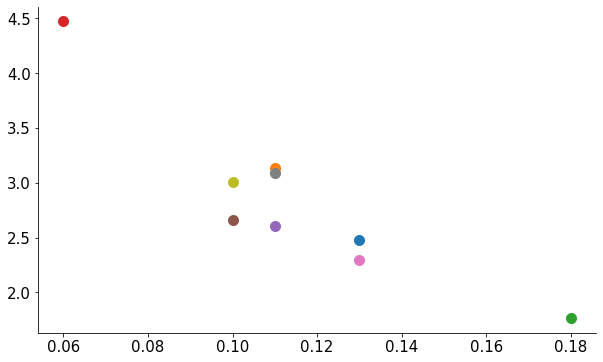

In [199]:
fig, ax = plt.subplots(figsize=(10, 6))
for m in exps:
    ax.plot(frac_up[m],
            mean_w_up[m] * 1e2,
            '.', markersize=20, label=m)
seaborn.despine()
ax.set_xlabel('')
ax.set_ylabel('')

Text(0, 0.5, 'Mean tropospheric T [K]')

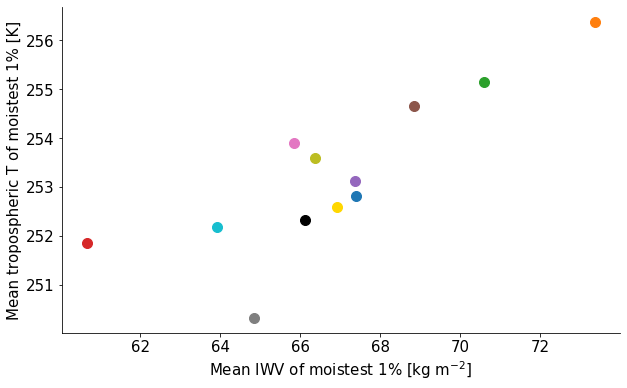

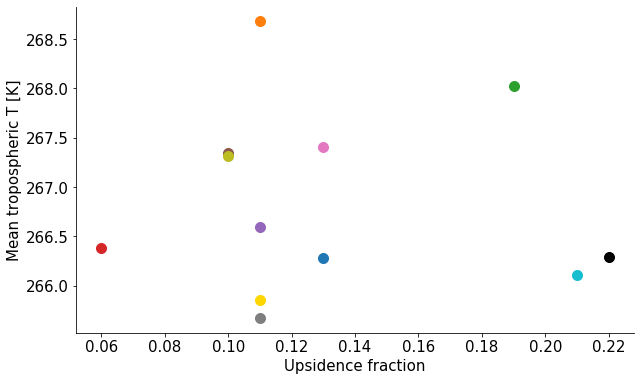

In [401]:
fig, ax = plt.subplots(figsize=(10, 6))
for m in exps:
    ax.plot(np.max(ms_perc[m]['IWV'].mean),
            ms_perc[m]['TEMP'].area_mean(bin_start=99, bin_end=100, lower_bnd=100, upper_bnd=16000),
            '.', markersize=20, label=m, color=plots.DYAMOND_colors(m))
seaborn.despine()
ax.set_xlabel('Mean IWV of moistest 1% [kg m$^{-2}$]')
ax.set_ylabel('Mean tropospheric T of moistest 1% [K]')

fig, ax = plt.subplots(figsize=(10, 6))
for i, m in enumerate(exps):
    ax.plot(frac_up[m],
            ms_perc[m]['TEMP'].area_mean(bin_start=0, bin_end=100, lower_bnd=0, upper_bnd=11000),
            '.', markersize=20, label=m, color=plots.DYAMOND_colors(m))
seaborn.despine()
ax.set_xlabel('Upsidence fraction')
ax.set_ylabel('Mean tropospheric T [K]')

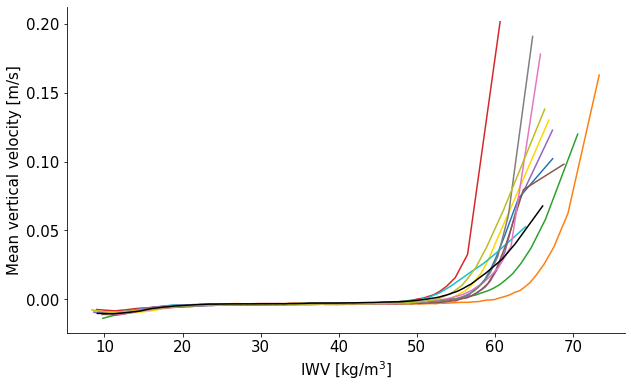

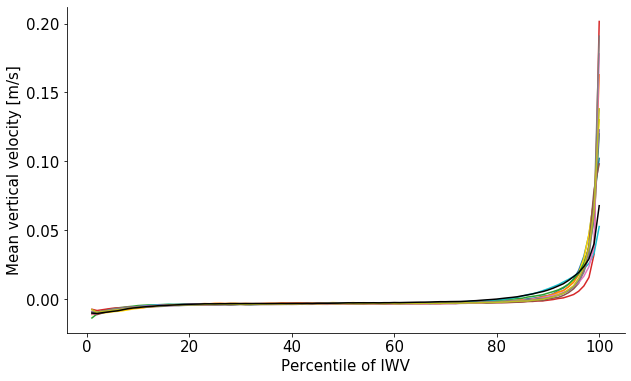

In [404]:
lower_layer_bnd = 100
upper_layer_bnd = 12500
fig, ax = plt.subplots(figsize=(10, 6))
for exp in models_variability:
    ax.plot(ms_perc[exp]['IWV'].mean, ms_perc[exp]['W'].vertical_mean(lower_layer_bnd, upper_layer_bnd), color=plots.DYAMOND_colors(exp))
ax.set_xlabel('IWV [kg/m$^3$]')
ax.set_ylabel('Mean vertical velocity [m/s]')
seaborn.despine(top=True, right=True)

lower_layer_bnd = 100
upper_layer_bnd = 12500
fig, ax = plt.subplots(figsize=(10, 6))
for exp in exps:
    ax.plot(perc_values, ms_perc[exp]['W'].vertical_mean(lower_layer_bnd, upper_layer_bnd), color=plots.DYAMOND_colors(exp))
ax.set_xlabel('Percentile of IWV')
ax.set_ylabel('Mean vertical velocity [m/s]')
seaborn.despine(top=True, right=True)

Plot upper-tropospheric temperature against upper-tropospheric RH in dry regions

Text(0.5, 0, 'Static stability (12-18km; perc < 50%) [K/hPa]')

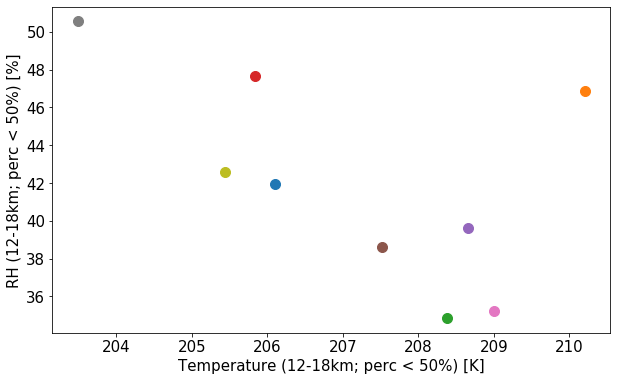

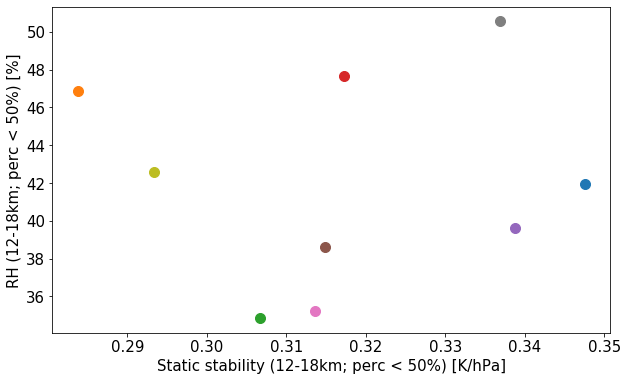

In [77]:
lower_bnd = 12000
upper_bnd = 18000

fig, ax = plt.subplots(figsize=(10, 6))
for i, m in enumerate(exps):
    ax.plot(ms_perc[m]['TEMP'].area_mean(bin_start=0, bin_end=50, lower_bnd=lower_bnd, upper_bnd=upper_bnd),\
            ms_perc[m]['RH'].area_mean(bin_start=0, bin_end=50, lower_bnd=lower_bnd, upper_bnd=upper_bnd) * 1e2,\
            '.', markersize=20, color=colors[m], label=m)
ax.set_ylabel('RH (12-18km; perc < 50%) [%]')
ax.set_xlabel('Temperature (12-18km; perc < 50%) [K]')

fig, ax = plt.subplots(figsize=(10, 6))
for i, m in enumerate(exps):
    ax.plot(ms_perc[m]['S'].area_mean(bin_start=0, bin_end=50, lower_bnd=lower_bnd, upper_bnd=upper_bnd) * 1e2,\
            ms_perc[m]['RH'].area_mean(bin_start=0, bin_end=50, lower_bnd=lower_bnd, upper_bnd=upper_bnd) * 1e2,\
            '.', markersize=20, color=colors[m], label=m)
ax.set_ylabel('RH (12-18km; perc < 50%) [%]')
ax.set_xlabel('Static stability (12-18km; perc < 50%) [K/hPa]')

Plot profiles in upsidence and subsidence regions

Text(0.5, 1.0, 'Upsidence')

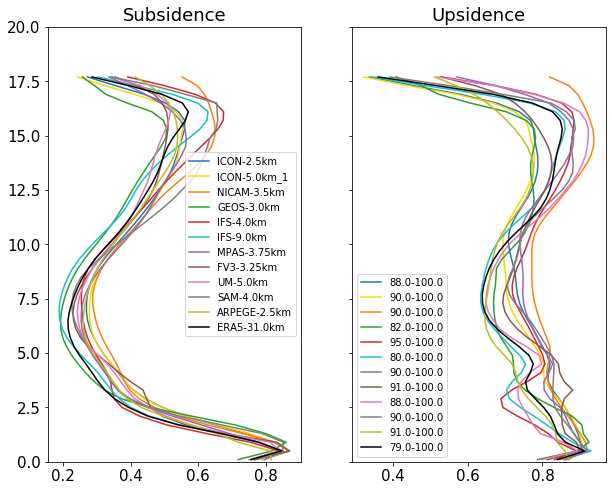

In [409]:
fig, ax = plt.subplots(1, 2, figsize=(10, 8), sharey=True)
for exp in exps:
    mean_up = ms_perc[exp]['Wint'].mean
    ind_up = np.where(mean_up > 0)[0]
    ind_sub = np.where(mean_up < 0)[0]
    ax[0].plot(ms_perc[exp]['RH'].mean_profile(perc_values[ind_sub[0]], perc_values[ind_sub[-1]]), h * 1e-3, label=exp, color=plots.DYAMOND_colors(exp))
    ax[1].plot(ms_perc[exp]['RH'].mean_profile(perc_values[ind_up[0]], perc_values[ind_up[-1]]), h * 1e-3, label=f'{perc_values[ind_up[0]]}-{perc_values[ind_up[-1]]}', color=plots.DYAMOND_colors(exp))
ax[0].set_ylim(0, 20)
ax[0].legend(fontsize=10)
ax[1].legend(fontsize=10)
ax[0].set_title('Subsidence')
ax[1].set_title('Upsidence')

Plot profiles reconstructed from N EOFs

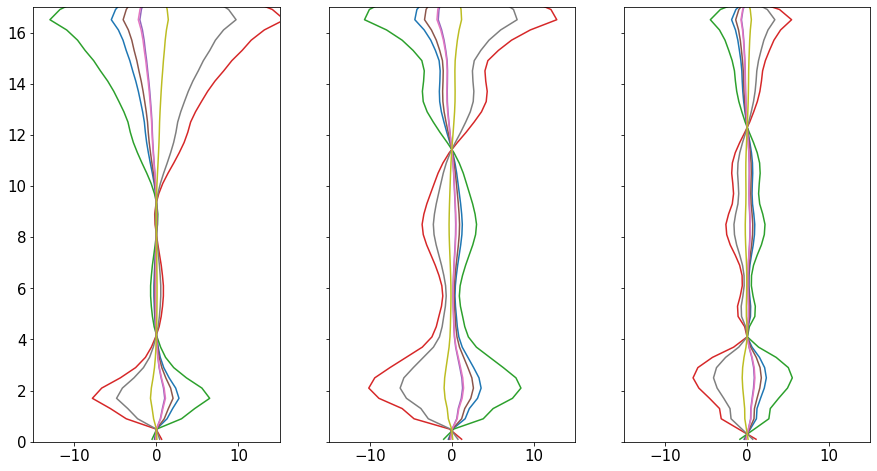

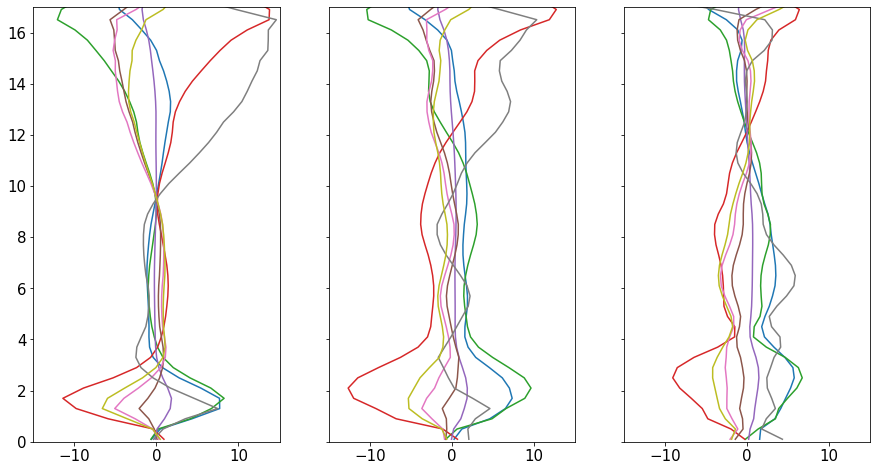

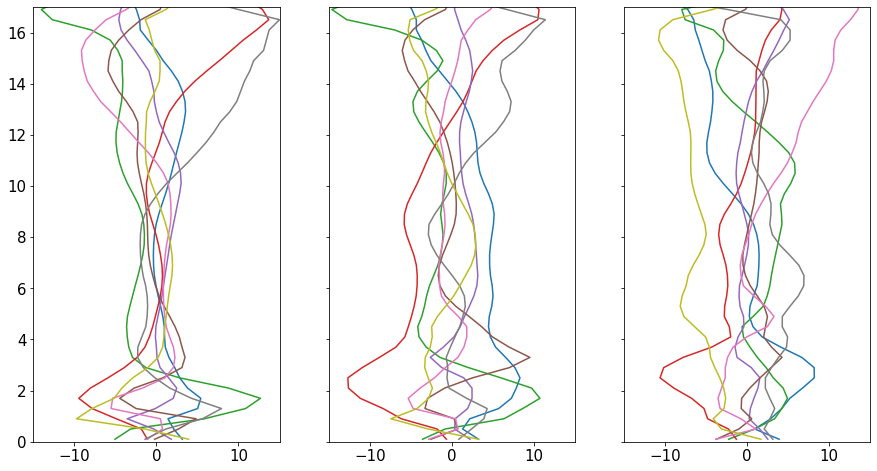

In [158]:
fig, ax = plt.subplots(1, 3, figsize=(15, 8), sharey=True)
ax[0].set_ylim(0, 17)
for i, m in enumerate(models_variability):
    ax[0].plot(rep_1['RH'][i].mean_profile(10, 50) * 1e2, h * 1e-3, color=colors[m])
    ax[1].plot(rep_1['RH'][i].mean_profile(50, 90) * 1e2, h * 1e-3, color=colors[m])
    ax[2].plot(rep_1['RH'][i].mean_profile(98, 100) * 1e2, h * 1e-3, color=colors[m])
    ax[0].set_xlim(-15, 15)
    ax[1].set_xlim(-15, 15)
    ax[2].set_xlim(-15, 15)
    
fig, ax = plt.subplots(1, 3, figsize=(15, 8), sharey=True)
ax[0].set_ylim(0, 17)
for i, m in enumerate(models_variability):
    ax[0].plot(rep_2['RH'][i].mean_profile(10, 50) * 1e2, h * 1e-3, color=colors[m])
    ax[1].plot(rep_2['RH'][i].mean_profile(50, 90) * 1e2, h * 1e-3, color=colors[m])
    ax[2].plot(rep_2['RH'][i].mean_profile(98, 100) * 1e2, h * 1e-3, color=colors[m])
    ax[0].set_xlim(-15, 15)
    ax[1].set_xlim(-15, 15)
    ax[2].set_xlim(-15, 15)
    
fig, ax = plt.subplots(1, 3, figsize=(15, 8), sharey=True)
ax[0].set_ylim(0, 17)
for i, m in enumerate(models_variability):
    ax[0].plot(rep_5['RH'][i].mean_profile(10, 50) * 1e2, h * 1e-3, color=colors[m])
    ax[1].plot(rep_5['RH'][i].mean_profile(50, 90) * 1e2, h * 1e-3, color=colors[m])
    ax[2].plot(rep_5['RH'][i].mean_profile(98, 100) * 1e2, h * 1e-3, color=colors[m])
    ax[0].set_xlim(-15, 15)
    ax[1].set_xlim(-15, 15)
    ax[2].set_xlim(-15, 15)

## Thermodynamics

Plot equivalent potential temperature in moistest bin against mean saturation value of equivalent potential temperature

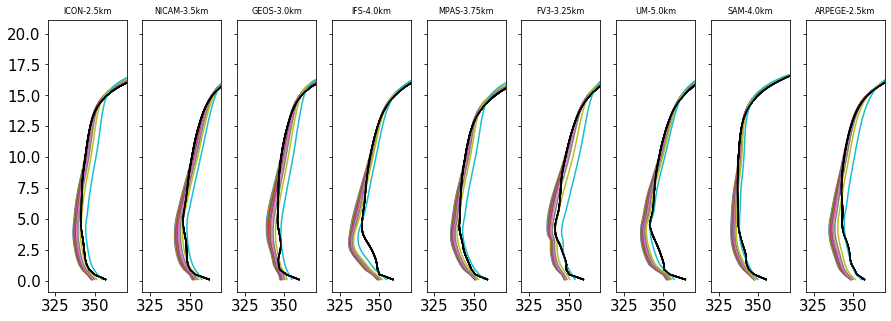

In [38]:
fig, ax = plt.subplots(1, len(exps), figsize=(15, 5), sharey=True)
for i, exp in enumerate(exps):
    for b in range(90, num_percs):
        ax[i].plot(ms_perc[exp]['THETA_E'].mean[b], h * 1e-3)
        ax[i].plot(ms_perc[exp]['THETA_ES'].mean_profile(60, 100), h * 1e-3, color='k')
        ax[i].set_xlim(320, 370)
        ax[i].set_title(exp, fontsize=8)
    

Text(0.5, 0, '$\\theta_e*$ in 30% moistest bins [K]')

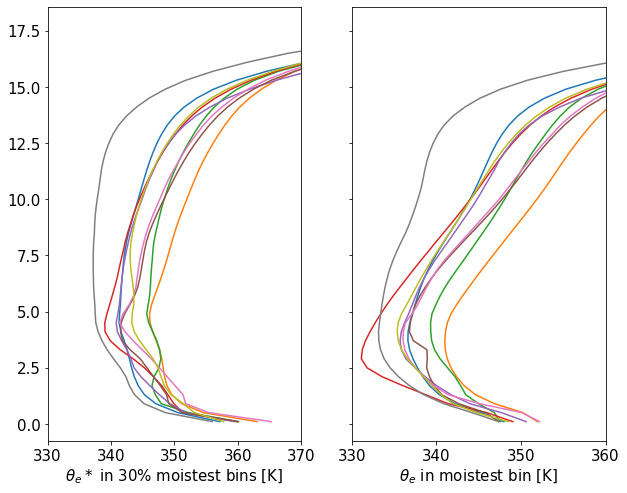

In [161]:
fig, ax = plt.subplots(1, 2, figsize=(10, 8), sharey=True)
for i, exp in enumerate(exps):
    ax[0].plot(ms_perc[exp]['THETA_ES'].mean_profile(70, 100), h * 1e-3, color=colors[exp])
    ax[1].plot(ms_perc[exp]['THETA_E'].mean_profile(90, 95), h * 1e-3, color=colors[exp])
ax[0].set_xlim(330, 370)
ax[1].set_xlim(330, 360)
ax[1].set_xlabel(r'$\theta_e$ in moistest bin [K]')
ax[0].set_xlabel(r'$\theta_e*$ in 30% moistest bins [K]')

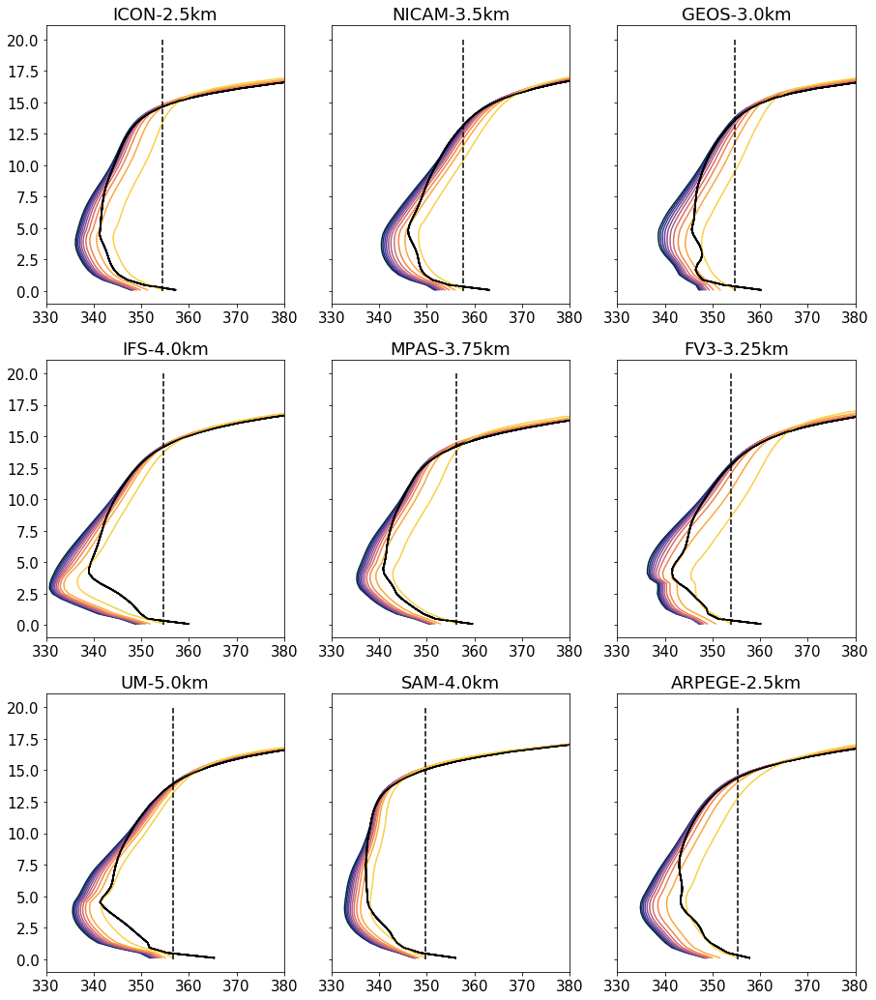

In [102]:
test_models = exps

num_cols = len(test_models) // 3
num_rows = len(test_models) // num_cols
fig, ax = plt.subplots(num_cols, 3, figsize=(15, 6 * num_cols), sharey=True)
ax = ax.ravel()

for i, exp in enumerate(test_models):
    ax[i].set_prop_cycle(color=typhon.plots.cmap2rgba('temperature', 11))
    for b in range(90, num_percs):
        ax[i].plot(ms_perc[exp]['THETA_E'].mean[b], h * 1e-3)
        ax[i].plot(ms_perc[exp]['THETA_ES'].mean_profile(70, 100), h * 1e-3, color='k')
    theta_surf = ms_perc[exp]['THETA_E'].mean[-1][0]
    ax[i].plot([theta_surf, theta_surf], [0, 20], '--', color='k')
        #ax[i].plot(ms_perc[exp]['THETA_ES'].mean_profile(100, 100), h * 1e-3, '--', color='k')
        #ax[i].plot(ms_perc['GEOS-3.0km']['THETA_ES'].mean_profile(70, 100), h * 1e-3, color='r')
    ax[i].set_xlim(330, 380)
    ax[i].set_title(exp)

## RH EOF2

Plot Tropopause height in moistest profiles against expansion coefficient 1

(100, 51)


NameError: name 'expansion_coeff' is not defined

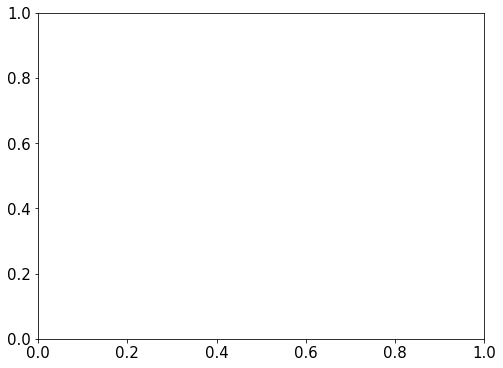

In [16]:
bin_start = 95
fig, ax = plt.subplots(figsize=(8, 6))
for i, m in enumerate(models_variability):
    tropo_height, tropo_temp = utils.cold_point_tropopause(
        ms_perc[m]['TEMP'].mean,
        h
    )
    ax.plot(expansion_coeff['RH'][1][i], tropo_height,\
            '.', markersize=20, color=colors[m], label=m)
ax.set_xlabel('Expansion coefficient 1')
ax.set_ylabel('Mean tropopause height in moistest 5% of profiles')
ax.legend()

Plot tropopause region of moist profiles

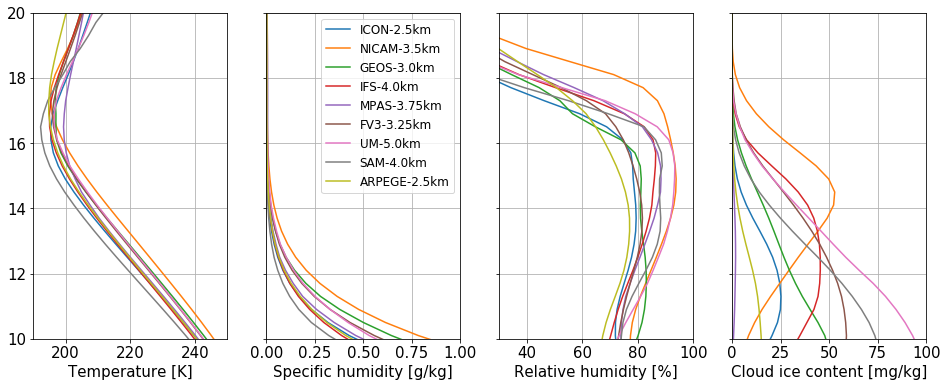

In [353]:
plot_vars = ['TEMP', 'QV', 'RH', 'QI']
fig, ax = plt.subplots(1, len(plot_vars), figsize=(4 * len(plot_vars), 6), sharey=True)
for i, var in enumerate(plot_vars):
    for n, m in enumerate(exps):#enumerate(['ICON-2.5km', 'SAM-4.0km', 'IFS-4.0km', 'UM-5.0km']):
        ax[i].plot(ms_perc[m][var].mean_profile(90, 100) * scaling_factor[ms_perc[m][var].variable],\
                   h * 1e-3, color=colors[m], label=m)
        #ax[i].plot([0, 300], [ms_perc[m]['H_tropo'].mean_profile(95, 100) * 1e-3, ms_perc[m]['H_tropo'].mean_profile(95, 100) * 1e-3])
        ax[i].set_xlabel(plots.axis_labels(ms_perc[m][var].variable))
        ax[i].grid()

ax[0].set_ylim(10, 20)
ax[0].set_xlim(190, 250)
ax[2].set_xlim(30, 100)
ax[3].set_xlim(0, 100)
ax[1].set_xlim(0, 1)
#ax[4].set_xlim(0, 0.1)
ax[1].legend(fontsize=12)


* Absolute amount of water vapor is closely tied to temperature, whereas RH in the region above ~14 km (also in the lower stratosphere) seems to be tied to cloud ice (see plot below). Where convection (production of cloud ice) reaches higher, the cold point tropopause is also higher
* Amount of cloud ice is most significant with respect to the amount of water vapour in the region above ~14 km (see plot below) --> Here, sublimation of cloud ice could be an important vapour source. Therefore, it is the cloud ice content in this region that is important.
* Another way to interpret the connection between RH and cloud ice content is that more cloud ice can form where RH is higher. Then the question is why the RH is higher there? And why should cloud ice formation be more sensitive to RH in the tropopause region than below (below there seems to be no correlation between the two)?

[[1.         0.61780952]
 [0.61780952 1.        ]]
[[1.         0.55538121]
 [0.55538121 1.        ]]


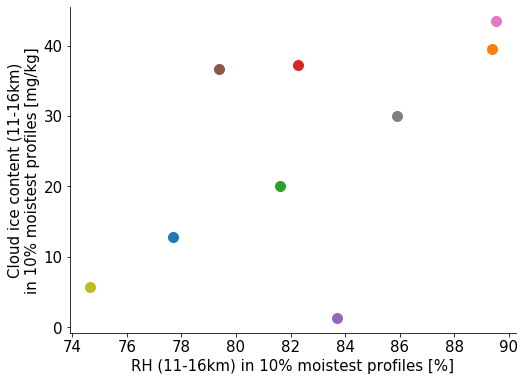

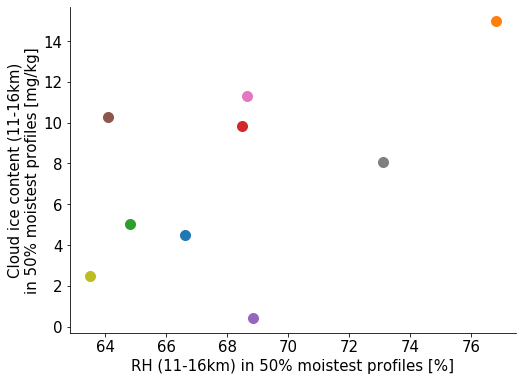

In [688]:
lower_bnd = 11000
upper_bnd = 16000
bin_start = 90
bin_end = 100
fig, ax = plt.subplots(figsize=(8, 6))
for m in exps:    
    ax.plot(ms_perc[m]['RH'].area_mean(bin_start, bin_end, lower_bnd, upper_bnd) * 1e2,\
            ms_perc[m]['QI'].area_mean(bin_start, bin_end, lower_bnd, upper_bnd) * 1e6,\
            '.', markersize=20, color=colors[m])
ax.set_xlabel('RH (11-16km) in 10% moistest profiles [%]')
ax.set_ylabel('Cloud ice content (11-16km)\nin 10% moistest profiles [mg/kg]')
seaborn.despine()
x = [ms_perc[m]['RH'].area_mean(bin_start, bin_end, lower_bnd, upper_bnd) for m in exps]
y = [ms_perc[m]['QI'].area_mean(bin_start, bin_end, lower_bnd, upper_bnd) for m in exps]
print(np.corrcoef(x, y))

lower_bnd = 11000
upper_bnd = 16000
bin_start = 50
bin_end = 100
fig, ax = plt.subplots(figsize=(8, 6))
for m in exps:    
    ax.plot(ms_perc[m]['RH'].area_mean(bin_start, bin_end, lower_bnd, upper_bnd) * 1e2,\
            ms_perc[m]['QI'].area_mean(bin_start, bin_end, lower_bnd, upper_bnd) * 1e6,\
            '.', markersize=20, color=colors[m])
ax.set_xlabel('RH (11-16km) in 50% moistest profiles [%]')
ax.set_ylabel('Cloud ice content (11-16km)\nin 50% moistest profiles [mg/kg]')
seaborn.despine()
x = [ms_perc[m]['RH'].area_mean(bin_start, bin_end, lower_bnd, upper_bnd) for m in exps]
y = [ms_perc[m]['QI'].area_mean(bin_start, bin_end, lower_bnd, upper_bnd) for m in exps]
print(np.corrcoef(x, y))

In [686]:
ms_perc[m]['RH'].area_mean(bin_start, bin_end, lower_bnd, upper_bnd)

0.6349357286528489

Text(0, 0.5, 'Height [km]')

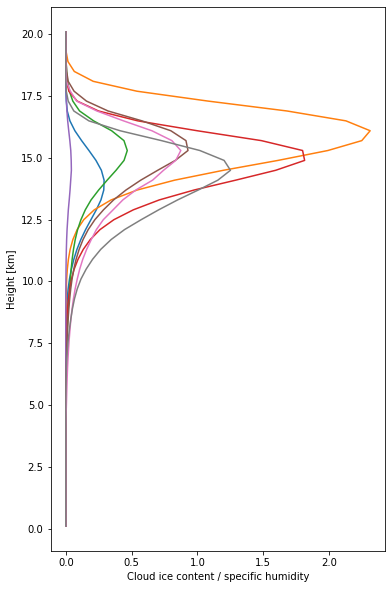

In [25]:
fig, ax = plt.subplots(figsize=(6, 10))
for m in exps:
    ax.plot(ms_perc[m]['QI'].mean_profile(80, 100) / ms_perc[m]['QV'].mean_profile(98, 100), h * 1e-3)
#ax.set_ylim(10, 20)
ax.set_xlabel('Cloud ice content / specific humidity')
ax.set_ylabel('Height [km]')

DEBUG:vmin 1.0112787914629863e-08 vmax 0.00042516764939699945
DEBUG:ticklocs array([1.e-09, 1.e-08, 1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02])
DEBUG:vmin 1.0112787914629863e-08 vmax 0.00042516764939699945
DEBUG:ticklocs array([1.e-09, 1.e-08, 1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02])
DEBUG:vmin 1.0112787914629863e-08 vmax 0.00042516764939699945
DEBUG:ticklocs array([1.e-09, 1.e-08, 1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02])
DEBUG:vmin 1.0112787914629863e-08 vmax 0.00042516764939699945
DEBUG:ticklocs array([1.e-09, 1.e-08, 1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02])
DEBUG:vmin 1.0112787914629863e-08 vmax 0.00042516764939699945
DEBUG:ticklocs array([2.e-09, 3.e-09, 4.e-09, 5.e-09, 6.e-09, 7.e-09, 8.e-09, 9.e-09,
       2.e-08, 3.e-08, 4.e-08, 5.e-08, 6.e-08, 7.e-08, 8.e-08, 9.e-08,
       2.e-07, 3.e-07, 4.e-07, 5.e-07, 6.e-07, 7.e-07, 8.e-07, 9.e-07,
       2.e-06, 3.e-06, 4.e-06, 5.e-06, 6.e-06, 7.e-06, 8.e-06, 9.e-06,
       2.e-05, 3.e-05, 4.e-05, 5.e-05, 6.e-

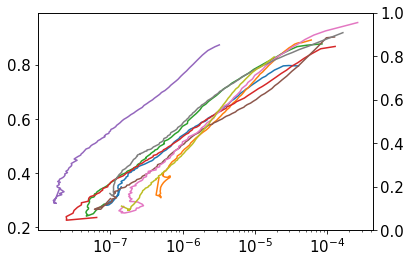

In [675]:
level_start = 11000
level_end = 14000
fig, ax = plt.subplots()
ax2 = ax.twinx()
for exp in exps:
    ax.semilogx(ms_perc[exp]['QI'].vertical_mean(level_start, level_end), ms_perc[exp]['RH'].vertical_mean(level_start, level_end))
    #ax2.plot(perc_values, ms_perc[exp]['RH'].vertical_mean(level_start, level_end))

Plot boundary layer region for dryest profiles

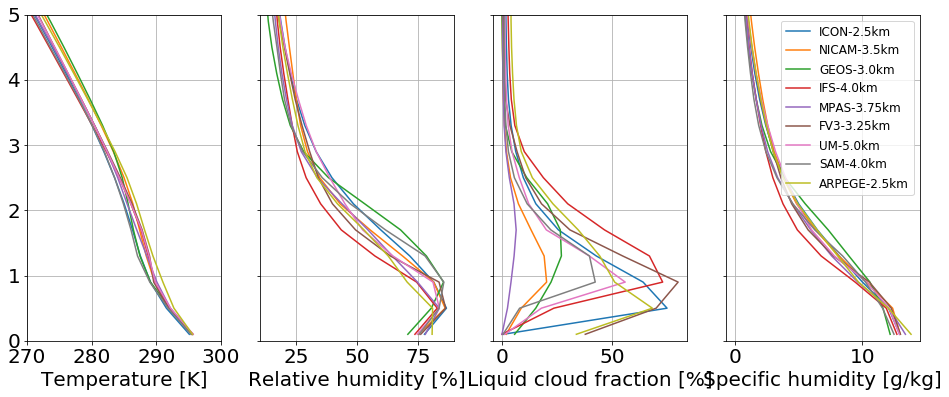

In [258]:
plot_vars = ['TEMP', 'RH', 'CFL', 'QV']
fig, ax = plt.subplots(1, len(plot_vars), figsize=(4 * len(plot_vars), 6), sharey=True)
for i, var in enumerate(plot_vars):
    for n, m in enumerate(exps):
        ax[i].plot(ms_perc[m][var].mean_profile(10, 50) * scaling_factor[ms_perc[m][var].variable],\
                   h * 1e-3, color=colors[m], label=m)
        #ax[i].plot([0, 300], [ms_perc[m]['H_tropo'].mean_profile(95, 100) * 1e-3, ms_perc[m]['H_tropo'].mean_profile(95, 100) * 1e-3])
        ax[i].set_xlabel(plots.axis_labels(ms_perc[m][var].variable))
        ax[i].grid()

ax[0].set_ylim(0, 5)
ax[0].set_xlim(270, 300)
ax[1].set_xlim(10, 90)
ax[-1].legend(fontsize=12)

## SVDs RH, TEMP, log(QV)

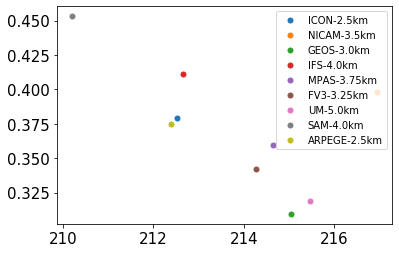

In [135]:
bin_start = 0
bin_end = 40
lower_bnd = 10000
upper_bnd = 17500
fig, ax = plt.subplots()
for m in exps:
    ax.plot(ms_perc[m]['TEMP'].area_mean(bin_start, bin_end, lower_bnd, upper_bnd),
            ms_perc[m]['RH'].area_mean(bin_start, bin_end, lower_bnd, upper_bnd), 
           '.', markersize=10, color=colors[m], label=m)
ax.legend(fontsize=10)

## Subsidence drying

In [398]:
Lv = typhon.constants.heat_of_vaporization
Rv = typhon.constants.gas_constant_water_vapor
RH = {}
for exp in exps:
    RH[exp] = np.zeros((ms_perc[exp]['RH'].num_profiles, ms_perc[exp]['RH'].num_levels))
    RH[exp][:, -1] = ms_perc[exp]['RH'].mean[:, -1]
    for i in range(2, ms_perc[exp]['RH'].num_levels):
        dz =  (h[-i] - h[-i+1])
        RH[exp][:, -i] = RH[exp][:, -i+1] * np.exp(Lv / Rv * -ms_perc[exp]['LR'].mean[:, -i] / ms_perc[exp]['TEMP'].mean[:, -i] **2 * dz)
        
        

(10, 16)

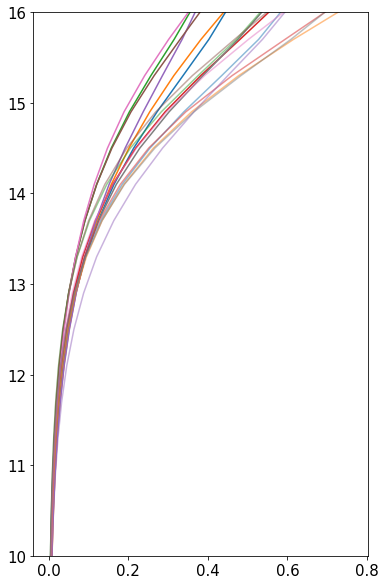

In [402]:
fig, ax = plt.subplots(figsize=(6, 10))
for m in exps:
    ax.plot(np.mean(RH[m][0:40], axis=0), h * 1e-3, color=colors[m])
ax.set_ylim(10, 16)

for m in exps:
    ax.plot(np.mean(RH[m][40:80], axis=0), h * 1e-3, alpha=0.5, color=colors[m])
ax.set_ylim(10, 16)

## Temperature gradient

DEBUG:vmin 1.772328594226451e-05 vmax 0.0004916801316092212
DEBUG:ticklocs array([1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02])
DEBUG:vmin 1.772328594226451e-05 vmax 0.0004916801316092212
DEBUG:ticklocs array([1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02])
DEBUG:vmin 1.772328594226451e-05 vmax 0.0004916801316092212
DEBUG:ticklocs array([1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02])
DEBUG:vmin 1.772328594226451e-05 vmax 0.0004916801316092212
DEBUG:ticklocs array([2.e-06, 3.e-06, 4.e-06, 5.e-06, 6.e-06, 7.e-06, 8.e-06, 9.e-06,
       2.e-05, 3.e-05, 4.e-05, 5.e-05, 6.e-05, 7.e-05, 8.e-05, 9.e-05,
       2.e-04, 3.e-04, 4.e-04, 5.e-04, 6.e-04, 7.e-04, 8.e-04, 9.e-04,
       2.e-03, 3.e-03, 4.e-03, 5.e-03, 6.e-03, 7.e-03, 8.e-03, 9.e-03,
       2.e-02, 3.e-02, 4.e-02, 5.e-02, 6.e-02, 7.e-02, 8.e-02, 9.e-02])
DEBUG:vmin 1.772328594226451e-05 vmax 0.0004916801316092212
DEBUG:ticklocs array([1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02])
DEBUG:vmin 1.772328594226451e-05 vmax 0.0004916801316092212
DEBUG:ticklocs ar

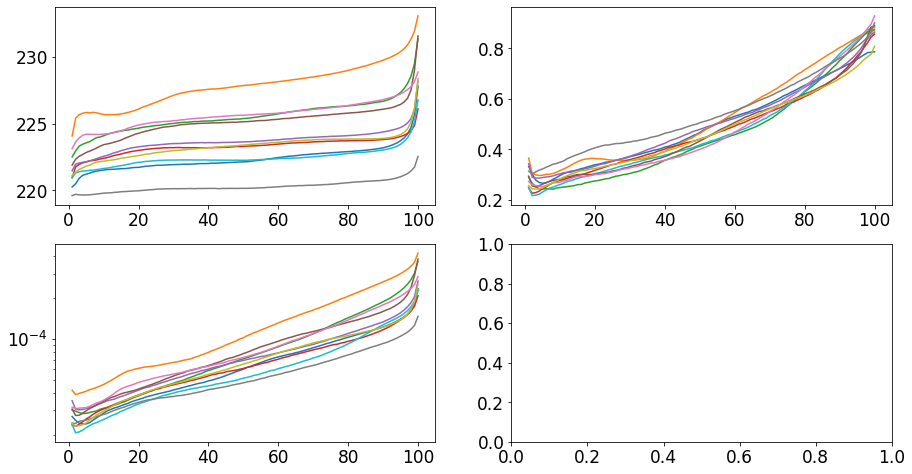

In [294]:
fig, ax = plt.subplots(2, 2, figsize=(15, 8))
for exp in exps:
    
    ax[0, 0].plot(perc_values, ms_perc[exp]['TEMP'].vertical_mean(lower_bnd=10000, upper_bnd=14000), color=colors[exp])
    ax[0, 1].plot(perc_values, ms_perc[exp]['RH'].vertical_mean(lower_bnd=10000, upper_bnd=14000), color=colors[exp])
    ax[1, 0].semilogy(perc_values, ms_perc[exp]['QV'].vertical_mean(lower_bnd=10000, upper_bnd=14000), color=colors[exp])

## Murphy vs. Magnus

In [239]:
exp = 'ICON-2.5km'
temp = ms_perc[exp]['TEMP'].mean
q = ms_perc[exp]['QV'].mean
p = ms_perc[exp]['PRES'].mean
e = ms_perc[exp]['E'].mean

vmr = typhon.physics.specific_humidity2vmr(q)
rh_murphy_w = typhon.physics.vmr2relative_humidity(vmr, p, temp, e_eq=typhon.physics.e_eq_water_mk)
rh_murphy_e = typhon.physics.vmr2relative_humidity(vmr, p, temp, e_eq=typhon.physics.e_eq_ice_mk)
es_magnus_w = 6.112 * np.exp(17.62 * (temp - 273.15) / (243.12 + (temp - 273.15))) * 1e2 
rh_magnus_w = e / es_magnus_w
es_magnus_e = 6.112 * np.exp(22.46 * (temp - 273.15) / (272.62 + (temp - 273.15))) * 1e2 
rh_magnus_e = e / es_magnus_e

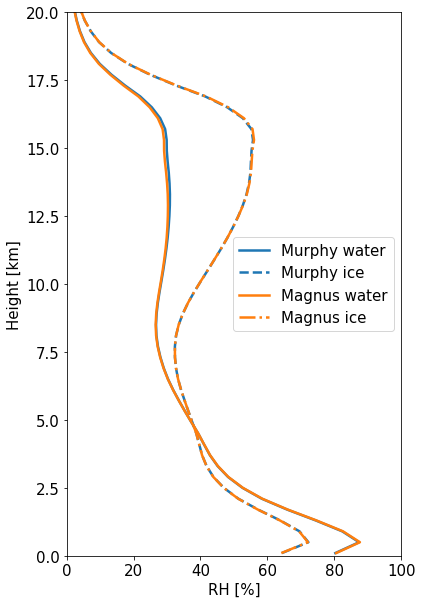

In [252]:
fig, ax = plt.subplots(figsize=(6, 10))
ax.plot(np.mean(rh_murphy_w, axis=0) * 1e2, h * 1e-3, lw=2.5, color='C0', label='Murphy water')
ax.plot(np.mean(rh_murphy_e, axis=0) * 1e2, h * 1e-3, '--', lw=2.5, color='C0', label='Murphy ice')
#ax.plot(ms_perc[exp]['RH'].mean_profile(0, 100) * 1e2, h * 1e-3)
ax.plot(np.mean(rh_magnus_w, axis=0) * 1e2, h * 1e-3, lw=2.5, color='C1', label='Magnus water')
ax.plot(np.mean(rh_magnus_e, axis=0) * 1e2, h * 1e-3, '-.', lw=2.5, color='C1', label='Magnus ice')
ax.set_ylim(0, 20)
ax.set_xlim(0, 100)
ax.set_ylabel('Height [km]')
ax.set_xlabel('RH [%]')
ax.legend()

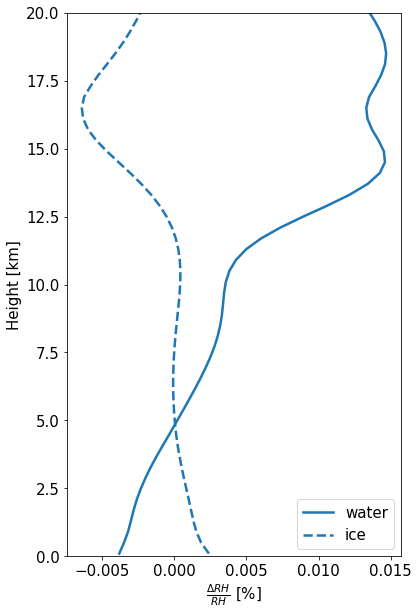

In [258]:
fig, ax = plt.subplots(figsize=(6, 10))
ax.plot((np.mean(rh_murphy_w, axis=0) - np.mean(rh_magnus_w, axis=0)) / np.mean(rh_murphy_e, axis=0), h * 1e-3, lw=2.5, color='C0', label='water')
ax.plot((np.mean(rh_murphy_e, axis=0) - np.mean(rh_magnus_e, axis=0)) / np.mean(rh_murphy_e, axis=0), h * 1e-3, '--', lw=2.5, color='C0', label='ice')
ax.set_ylim(0, 20)
#ax.set_xlim(0, 100)
ax.set_ylabel('Height [km]')
ax.set_xlabel(r'$\frac{\Delta RH}{RH}$ [%]')
ax.legend()

## IWV

In [139]:
ms_perc[exp]['RH'].mean[:, 0:10].shape

(100, 10)

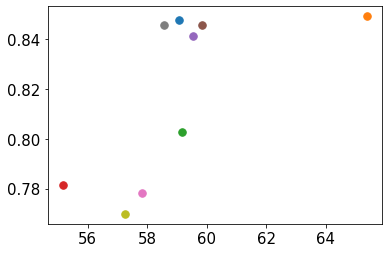

In [244]:
fig, ax = plt.subplots()
for exp in exps:
    mean_up = ms_perc[exp]['Wint'].mean
    ind_up = np.where(mean_up > 0)[0]
    ind_sub = np.where(mean_up < 0)[0]
    ax.plot(ms_perc[exp]['IWV'].mean_profile(bin_start=perc_values[ind_up[0]], bin_end=perc_values[ind_up[-1]]),
            ms_perc[exp]['RH'].area_mean(bin_start=perc_values[ind_up[0]], bin_end=perc_values[ind_up[-1]], lower_bnd=0, upper_bnd=6000),
           '.', markersize=15)

Text(0, 0.5, 'Effective LR [K km$^{-1}$]')

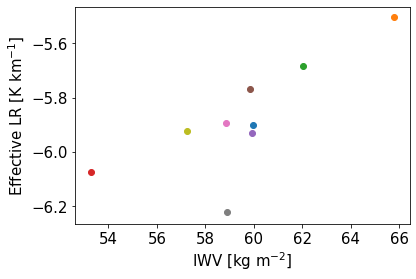

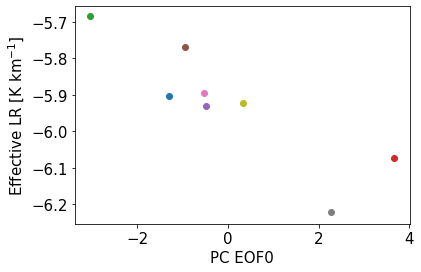

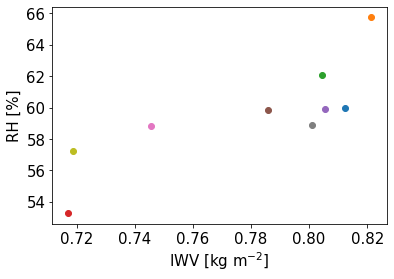

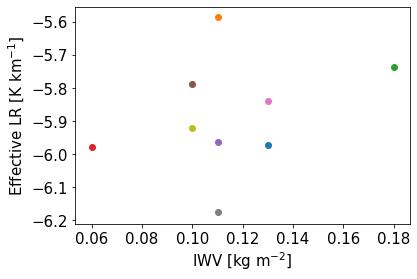

In [657]:
fig, ax = plt.subplots()
z_10 = np.argmin(np.abs(h - 10000))
for exp in exps:
    eff_lr = (ms_perc[exp]['TEMP'].mean[90:100, z_10] - ms_perc[exp]['TEMP'].mean[90:100, 0]) / 10
    ax.scatter(np.mean(ms_perc[exp]['IWV'].mean[90:100]), np.mean(eff_lr))
ax.set_xlabel('IWV [kg m$^{-2}$]')
ax.set_ylabel('Effective LR [K km$^{-1}$]')

fig, ax = plt.subplots()
for i, exp in enumerate(models_variability):
    eff_lr = (ms_perc[exp]['TEMP'].mean[90:100, z_10] - ms_perc[exp]['TEMP'].mean[90:100, 0]) / 10
    ax.scatter(expansion_coeffs['RH'][0][i], np.mean(eff_lr), color=colors[exp])
ax.set_xlabel('PC EOF0')
ax.set_ylabel('Effective LR [K km$^{-1}$]')

fig, ax = plt.subplots()
for exp in exps:
    ax.scatter(ms_perc[exp]['RH'].area_mean(90, 100, 0, 10000), np.mean(ms_perc[exp]['IWV'].mean[90:100]))
ax.set_xlabel('IWV [kg m$^{-2}$]')
ax.set_ylabel('RH [%]')

fig, ax = plt.subplots()
z_10 = np.argmin(np.abs(h - 10000))
for exp in exps:
    eff_lr = (ms_perc[exp]['TEMP'].mean[0:100, z_10] - ms_perc[exp]['TEMP'].mean[0:100, 0]) / 10
    ax.scatter(frac_up[exp], np.mean(eff_lr))
ax.set_xlabel('IWV [kg m$^{-2}$]')
ax.set_ylabel('Effective LR [K km$^{-1}$]')

In [594]:
IWV_above = {}
reload(utils)
for exp in exps:
    IWV_above[exp] = utils.calc_IWV_above(ms_perc[exp]['QV'].mean.T, ms_perc[exp]['TEMP'].mean.T, ms_perc[exp]['PRES'].mean.T, h)

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b829905e278>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b82b57804e0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b82b6ce7898>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b8299475978>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b82b74b0be0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b8299822be0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b8299752e80>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

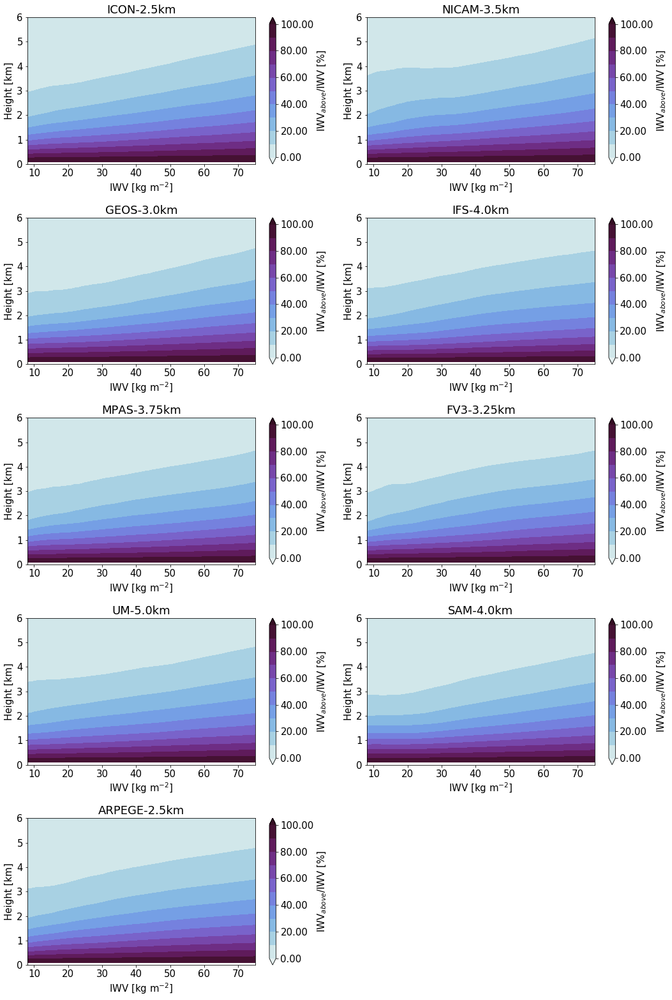

In [632]:
plt.rcParams.update({'font.size': 15})
x_lims = [8, 75]
y_lims = [0, 6]
x_label = plots.axis_labels('IWV')
y_label = 'Height [km]'
tick_labels = np.arange(10, 81, 10)
contours = np.arange(0, 101, 10)
fig, ax = plt.subplots(np.ceil(len(exps) / 2).astype(int), 2, figsize=(15, 22))
ax = ax.ravel()
for i, exp in enumerate(exps):    
    cs = plots.moisture_space_contourf(fig, ax[i], perc_values, h * 1e-3, IWV_above[exp] / IWV_above[exp][0] * 100,\
                                 contours, x_lims, y_lims, x_label, y_label, r'IWV$_{above}$/IWV [%]', cm_orientation='vertical', cmap='density')

    ax[i].set_title(exp)
plt.tight_layout()
ax[i+1].set_visible(False)

(0, 65)

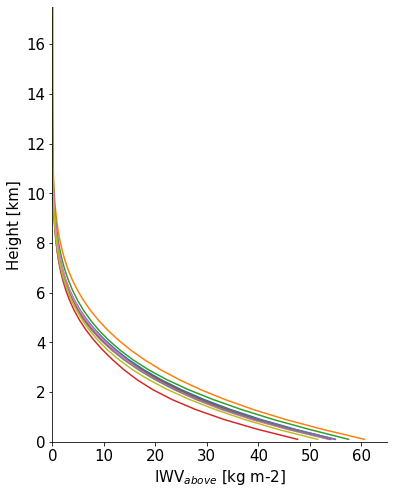

In [611]:
fig, ax = plt.subplots(figsize=(6, 8))
for exp in exps:
    ax.plot(IWV_above[exp][:, 90], h * 1e-3)
seaborn.despine()
ax.set_xlabel(r'IWV$_{above}$ [kg m-2]')
ax.set_ylabel('Height [km]')
ax.set_ylim(0, 17.5)
ax.set_xlim(0, 65)

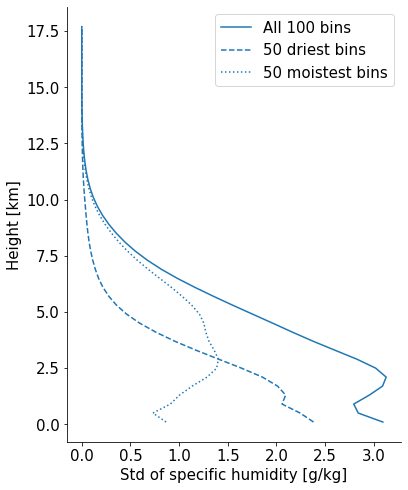

In [521]:
# wonach sortiere ich in jedem einzelnen Modell?
m = 'ICON-2.5km'
q_rh_const = np.zeros((num_percs, len(h)))
rh_const = np.repeat(np.expand_dims(ms_perc[m]['RH'].mean_profile(), 0), num_percs, axis=0)
q_rh_const = utils.rel_hum2spec_hum(rh_const, ms_perc[exp]['TEMP'].mean, ms_perc[exp]['PRES'].mean)
fig, ax = plt.subplots(figsize=(6, 8))

ax.plot(np.std(ms_perc[m]['QV'].mean, axis=0) * 1e3, h * 1e-3, label='All 100 bins')
#ax.plot(np.std(q_rh_const, axis=0) * 1e3, h * 1e-3)
ax.plot(np.std(ms_perc[m]['QV'].mean[0:50], axis=0) * 1e3, h * 1e-3, '--', color='C0', label='50 driest bins')
ax.plot(np.std(ms_perc[m]['QV'].mean[50:100], axis=0) * 1e3, h * 1e-3, ':', color='C0', label='50 moistest bins')
#ax.plot(np.std(q_rh_const[0:50], axis=0) * 1e3, h * 1e-3, '--', color='C1')
#ax.plot(np.std(q_rh_const[50:100], axis=0) * 1e3, h * 1e-3, ':', color='C1')
ax.set_ylabel('Height [km]')
ax.set_xlabel('Std of specific humidity [g/kg]')
seaborn.despine()
ax.legend()

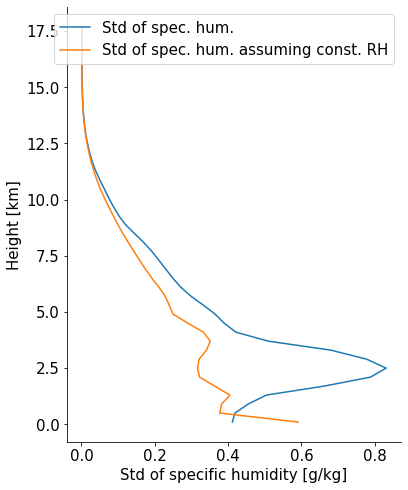

In [530]:
q_rh_const = np.zeros((len(models_variability), num_percs, len(h)))
for i, exp in enumerate(models_variability):
    q_rh_const[i] = utils.rel_hum2spec_hum(ms_perc_series['RH'].mean, ms_perc[exp]['TEMP'].mean, ms_perc[exp]['PRES'].mean)

std_rh_const = np.std(q_rh_const, axis=0)
fig, ax = plt.subplots(figsize=(6, 8))

ax.plot(ms_perc_series['QV'].variability.T[:, 90] * 1e3, h * 1e-3, label='Std of spec. hum.')
ax.plot(std_rh_const[90] * 1e3, h * 1e-3, label='Std of spec. hum. assuming const. RH')

ax.set_ylabel('Height [km]')
ax.set_xlabel('Std of specific humidity [g/kg]')
seaborn.despine()
ax.legend()

In [526]:
std_rh_const.shape

NameError: name 'std_rh_const' is not defined

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b82b416a320>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b82b5564390>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh


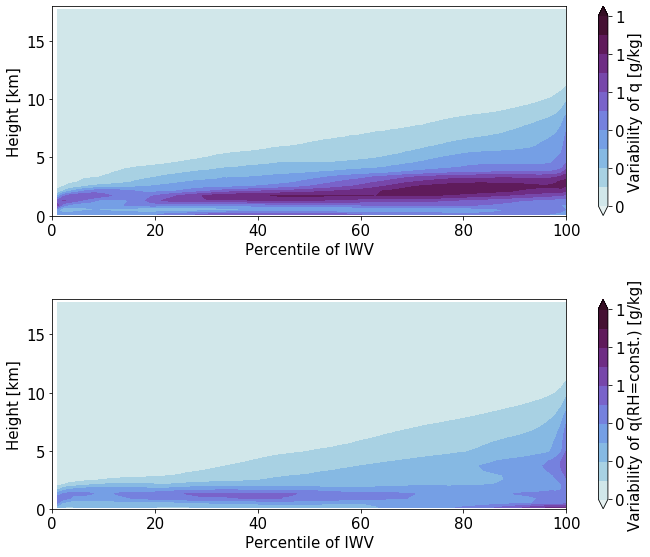

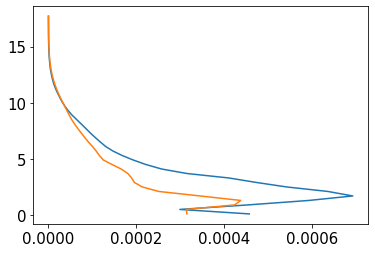

In [208]:
q_rh_const = np.zeros((len(models_variability), num_percs, len(h)))
for i, exp in enumerate(models_variability):
    q_rh_const[i] = utils.rel_hum2spec_hum(ms_perc_series['RH'].mean, ms_perc[exp]['TEMP'].mean, ms_perc[exp]['PRES'].mean)

x_lims = [0, 100]
y_lims = [0, 18]
x_label = 'Percentile of IWV'
y_label = 'Height [km]'
fig, ax = plt.subplots(2, 1, figsize=(10, 8))  
contours = np.arange(0, 1.1, 0.1)
plots.moisture_space_contourf(fig, ax[0], perc_values, h * 1e-3,
                              ms_perc_series['QV'].variability.T * 1e3, contours,\
                              x_lims, y_lims, x_label, y_label, 'Variability of q [g/kg]',\
                              cmap='density', cm_orientation='vertical', vmin=0, vmax=1) 
plots.moisture_space_contourf(fig, ax[1], perc_values, h * 1e-3,
                              np.std(q_rh_const, axis=0).T * 1e3, contours,\
                              x_lims, y_lims, x_label, y_label, 'Variability of q(RH=const.) [g/kg]',\
                              cmap='density', cm_orientation='vertical', vmin=0, vmax=1) 
plt.tight_layout()

fig, ax = plt.subplots()
ax.plot(np.mean(ms_perc_series['QV'].variability, axis=0), h * 1e-3)
ax.plot(np.mean(np.std(q_rh_const, axis=0), axis=0), h * 1e-3)

## Shallow cumulus layer height

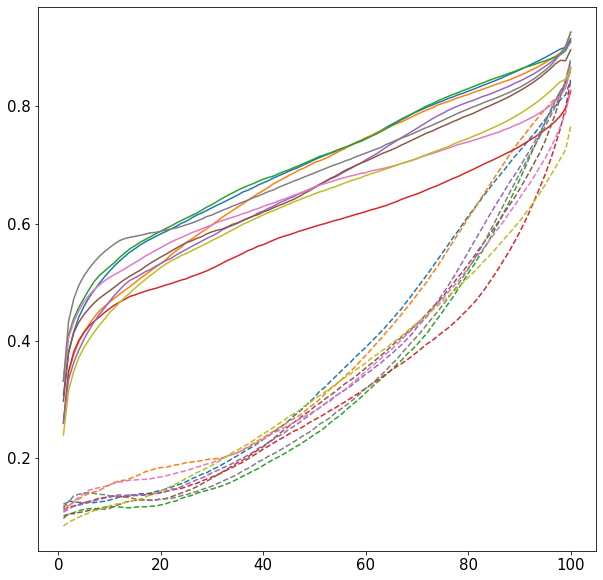

In [627]:
fig, ax = plt.subplots(figsize=(10, 10))
for exp in exps:
    ax.plot(perc_values, ms_perc[exp]['RH'].vertical_mean(0, 3000), color=colors[exp])
    ax.plot(perc_values, ms_perc[exp]['RH'].vertical_mean(3000, 10000), color=colors[exp], ls='--')

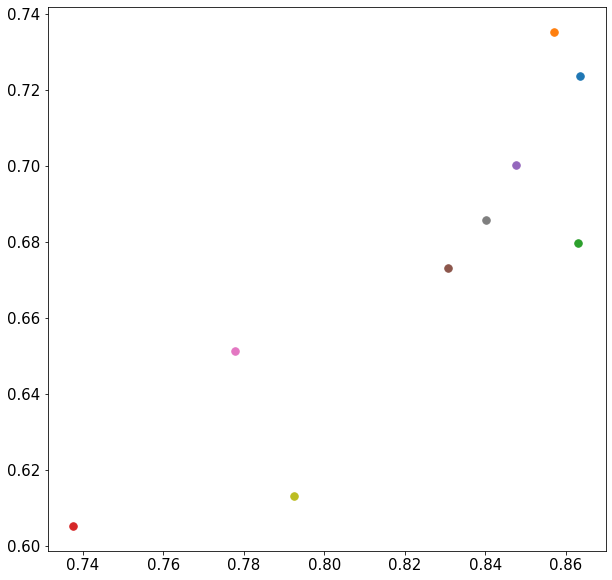

In [634]:
fig, ax = plt.subplots(figsize=(10, 10))
for exp in exps:
    ax.plot(ms_perc[exp]['RH'].area_mean(80, 100, 0, 3000), ms_perc[exp]['RH'].area_mean(80, 100, 3000, 10000), '.', markersize=15, color=colors[exp])

Text(0, 0.5, 'middle tropo')

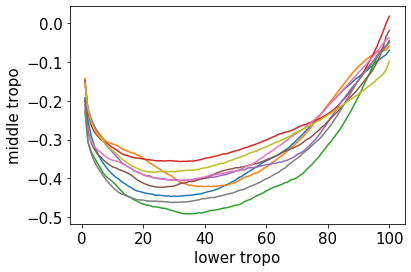

In [626]:
fig, ax = plt.subplots()
for exp in exps:
    ax.plot(perc_values, ms_perc[exp]['RH'].vertical_mean(3000, 10000) - ms_perc[exp]['RH'].vertical_mean(0, 3000))
ax.set_xlabel('lower tropo')
ax.set_ylabel('middle tropo')

## detrainment

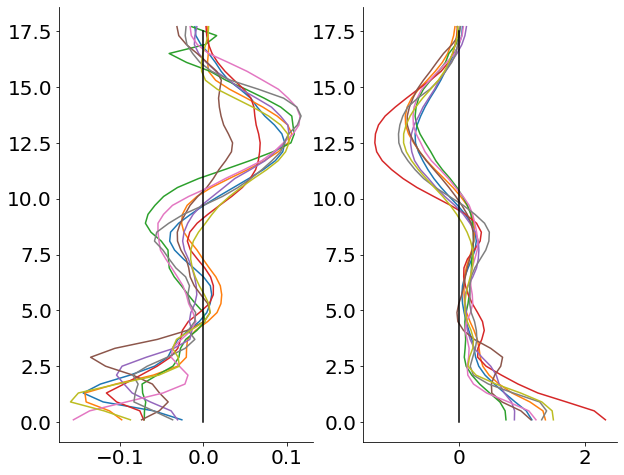

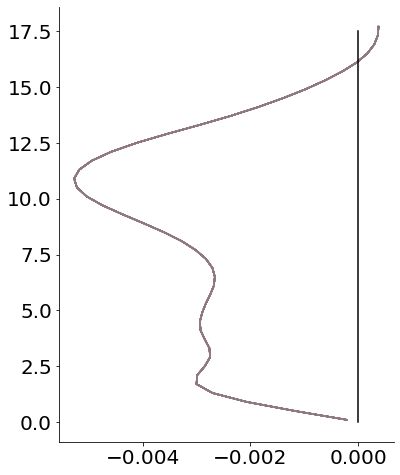

In [105]:
fig, ax = plt.subplots(1, 2, figsize=(10, 8))
for m in exps:
    mean_up = ms_perc[m]['Wint'].mean
    start_ind = np.where(mean_up > 0.0)[0][0]
    end_ind = np.where(mean_up > 0)[0][-1]
    mass_flux = ms_perc[m]['W'].mean * ms_perc[m]['DENS'].mean
    entrainment = np.gradient(ms_perc[m]['W'].mean, h, axis=1) * 86400
    #ax.plot(np.mean(entrainment[start_ind:100], axis=0), ms_perc[m]['TEMP'].mean_profile(start_ind, 100))
    ax[0].plot(np.mean(np.gradient(ms_perc[m]['W'].mean[30:start_ind], h, axis=1) * 86400, axis=0), h * 1e-3, color=colors[m])
    ax[1].plot(np.mean(np.gradient(ms_perc[m]['W'].mean[start_ind:100], h, axis=1) * 86400, axis=0), h * 1e-3, color=colors[m])
seaborn.despine()
ax[0].plot([0, 0], [0, 17.5], color='k')
ax[1].plot([0, 0], [0, 17.5], color='k')
#ax.set_ylim(300, 180)

fig, ax = plt.subplots(figsize=(6, 8))
m = 'NICAM-3.5km'
for i in range(30, 65, 2):
    mean_up = ms_perc[m]['Wint'].mean
    start_ind = np.where(mean_up > 0.0)[0][0]
    end_ind = np.where(mean_up > 0)[0][-1]
    mass_flux = ms_perc[m]['W'].mean * ms_perc[m]['DENS'].mean
    entrainment = np.gradient(ms_perc[m]['W'].mean, h, axis=1) * 86400
    #ax.plot(np.mean(entrainment[start_ind:100], axis=0), ms_perc[m]['TEMP'].mean_profile(start_ind, 100))
    ax.plot(ms_perc[m]['W'].mean_profile(30, 65), h * 1e-3)
seaborn.despine()
ax.plot([0, 0], [0, 17.5], color='k')
#ax.set_ylim(300, 180)

In [426]:
start_ind

87

In [438]:
m = 'ICON-2.5km'
z_0 = np.argmin(np.abs(ms_perc[m]['W'].mean_profile(87, 100)))
det = np.gradient(ms_perc[m]['W'].mean_profile(87, 100) * ms_perc[m]['DENS'].mean_profile(87, 100), h, axis=0)
R = ms_perc[m]['RH'].mean_profile(87, 100)
h2o_sat = utils.rel_hum2spec_hum(R, ms_perc[m]['TEMP'].mean_profile(87, 100), ms_perc[m]['PRES'].mean_profile(87, 100))

q = np.ones(len(h)) * np.nan
for l in range(len(h)):
    if l < z_0:
        q[l] = np.sum(det[l:z_0] * h2o_sat[l:z_0]) / np.sum(det[l:z_0])
rh = utils.spec_hum2rel_hum(q, ms_perc[m]['TEMP'].mean_profile(65, 70), ms_perc[m]['PRES'].mean_profile(65, 70))
    

(-10, 100)

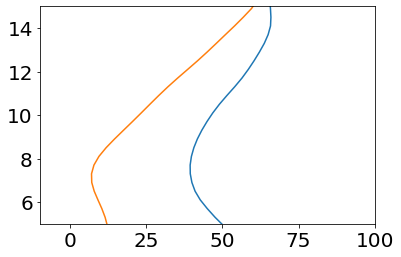

In [441]:
fig, ax = plt.subplots()
ax.plot(ms_perc[m]['RH'].mean_profile(65, 70) * 1e2, h * 1e-3)
ax.plot(rh * 1e2, h * 1e-3)
#ax.plot(ms_perc['ICON-2.5km']['RH'].mean_profile(30, 65) * 1e2, h * 1e-3)

ax.set_ylim(5, 15)
ax.set_xlim(-10, 100)

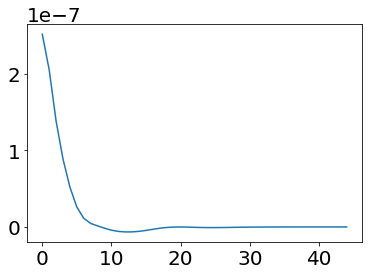

In [440]:
plt.plot(h2o_sat * det)

In [715]:
3600 * 1800 * 240 * 0.7 / 10000000

108.864

In [713]:
30 * 8

240